In [1]:
import numpy as np
import pickle, os, math
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import statsmodels.api as sm
from sklearn.decomposition import PCA
from scipy.stats import pearsonr, spearmanr
from scipy.spatial.distance import jensenshannon
from sklearn import metrics

In [2]:
root_folder = '../Data/'

In [3]:
dic = None
with open(f'{root_folder}/GC_Bias_Analysis/ref_genome_GC.pkl', 'rb') as f:
    dic = pickle.load(f)
ref_GC_array = dic['GC_array'] # (22, 350, 101)


def interpolate_zero_elements(array):
    first_non_zero_index = np.argmax(array != 0)
    last_non_zero_index = len(array) - 1 - np.argmax(array[::-1] != 0)
    inner_array = array[first_non_zero_index:last_non_zero_index + 1]
    non_zero_indices = np.nonzero(inner_array)[0]
    zero_indices = np.where(inner_array == 0)[0]
    inner_array[zero_indices] = np.interp(zero_indices, non_zero_indices, inner_array[non_zero_indices])
    array[first_non_zero_index:last_non_zero_index + 1] = inner_array
    return array

# Suppl Fig 1

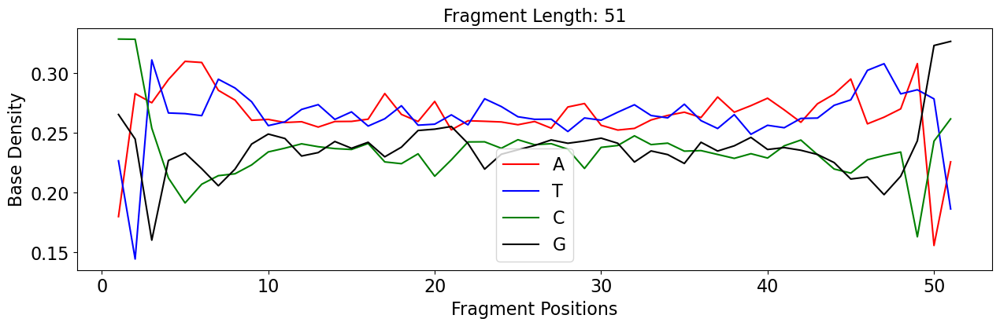

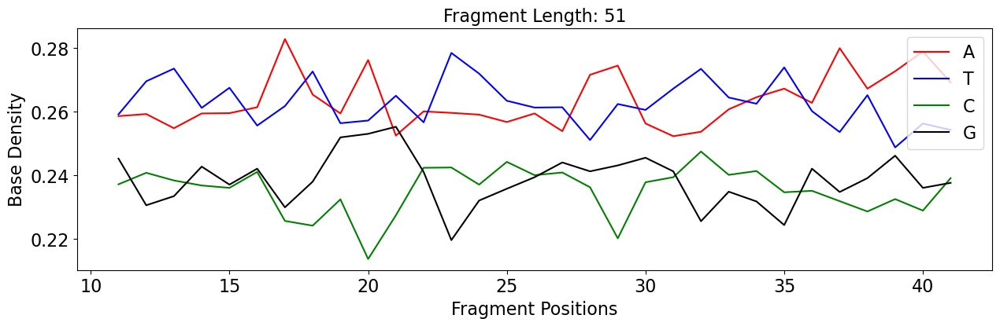

.....................................................................................................................


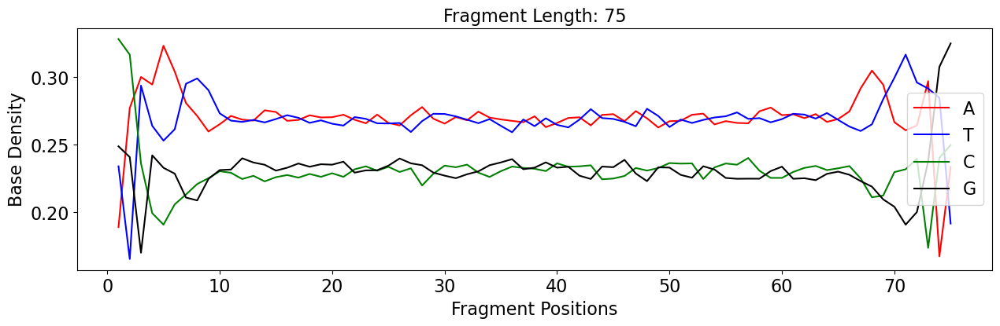

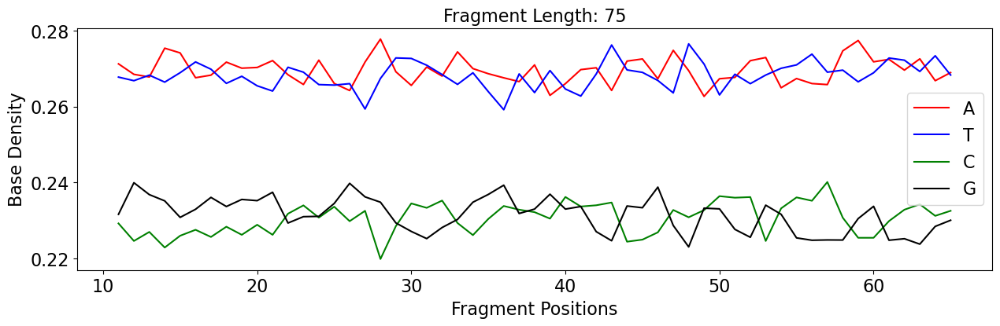

.....................................................................................................................


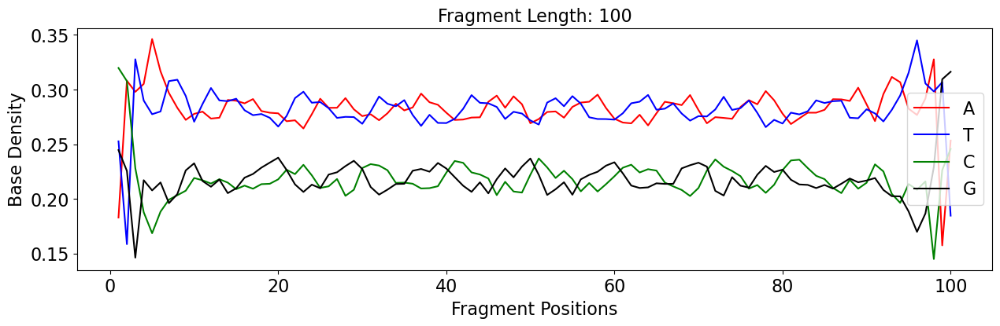

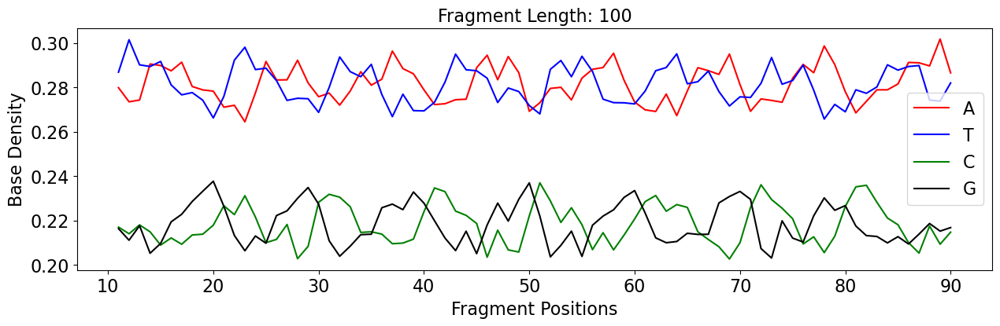

.....................................................................................................................


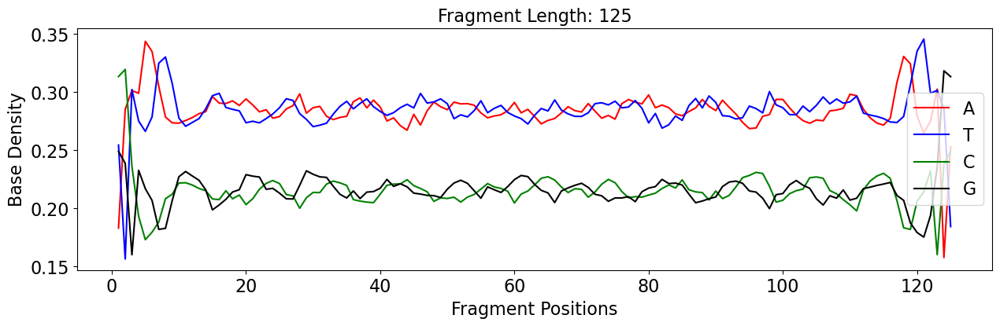

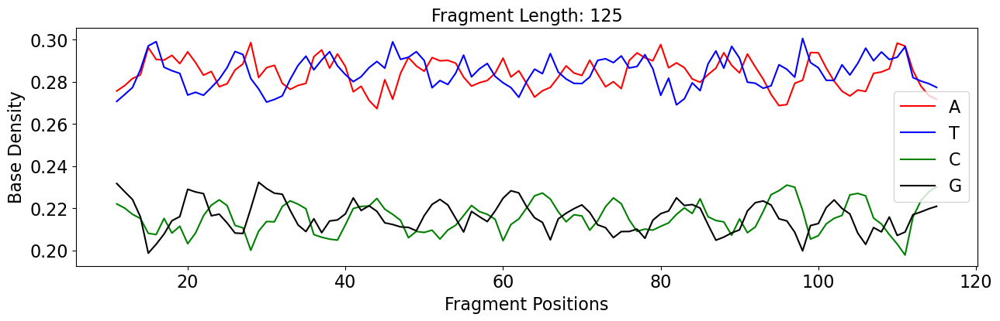

.....................................................................................................................


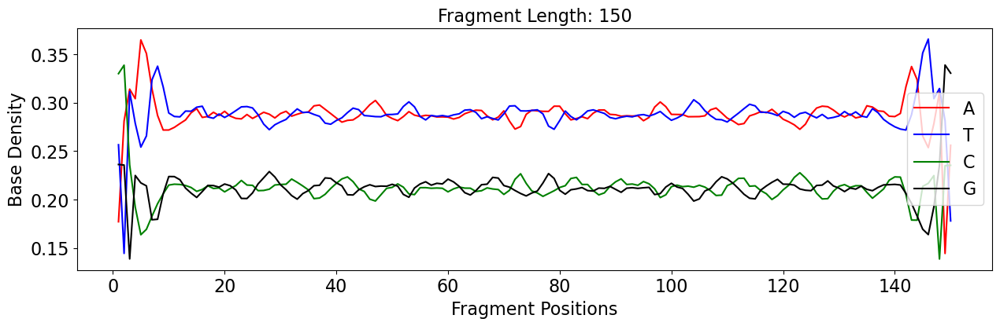

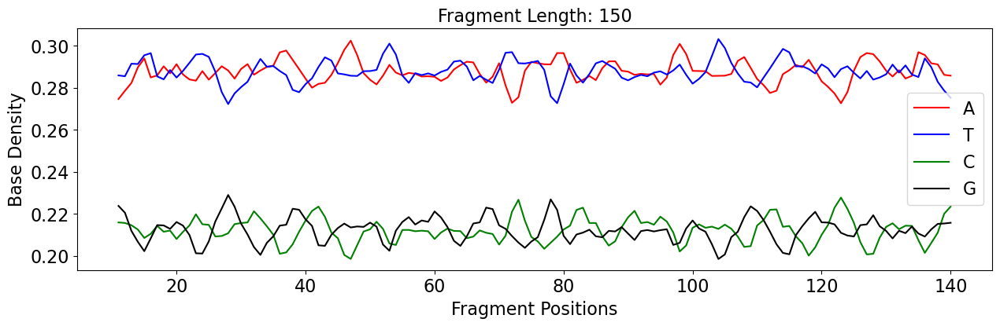

.....................................................................................................................


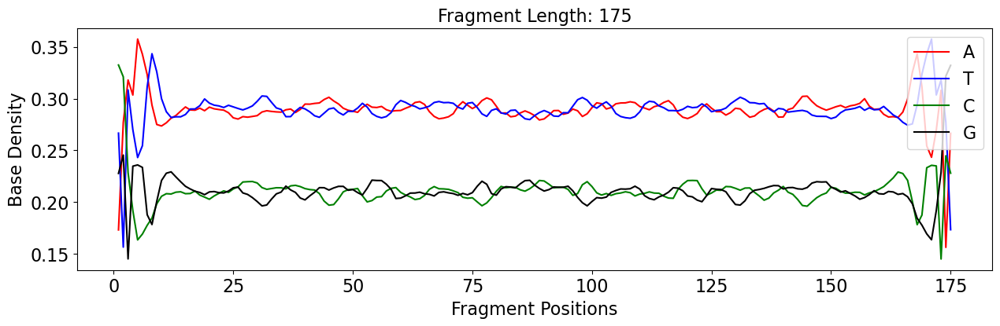

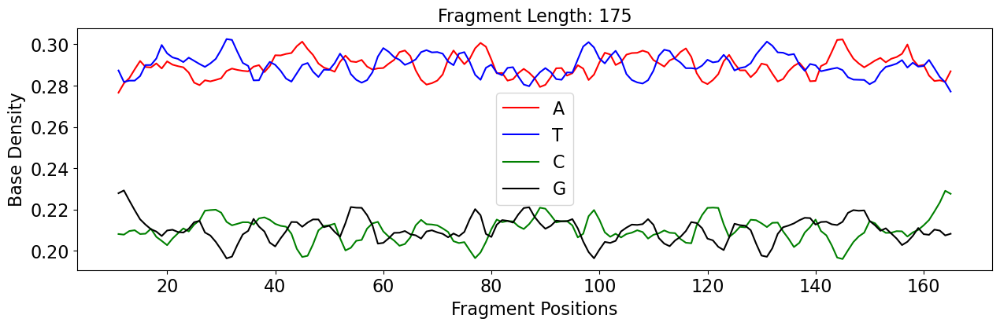

.....................................................................................................................


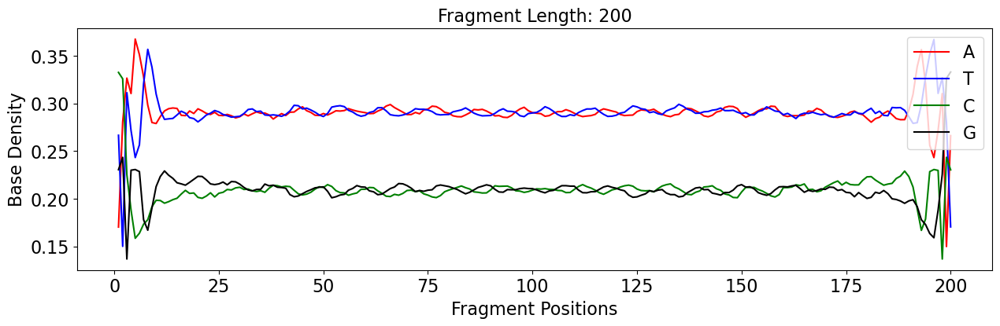

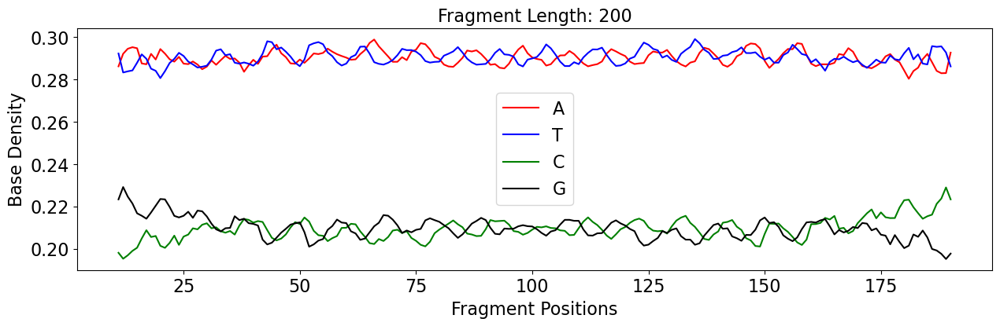

.....................................................................................................................


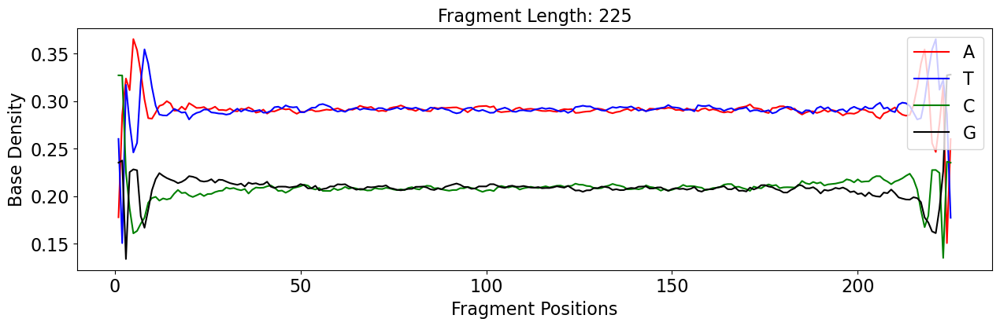

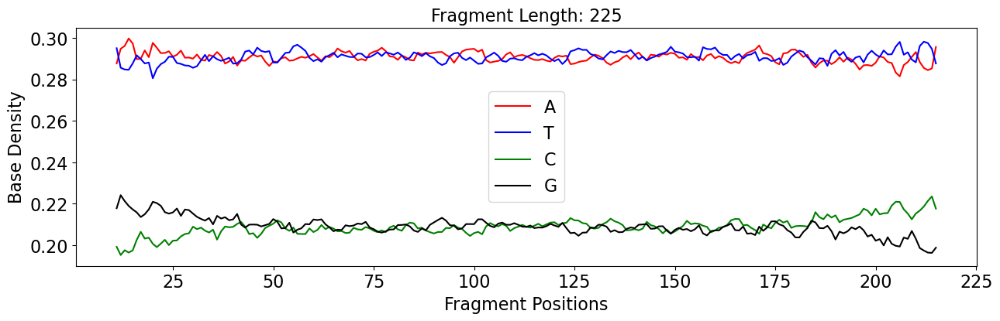

.....................................................................................................................


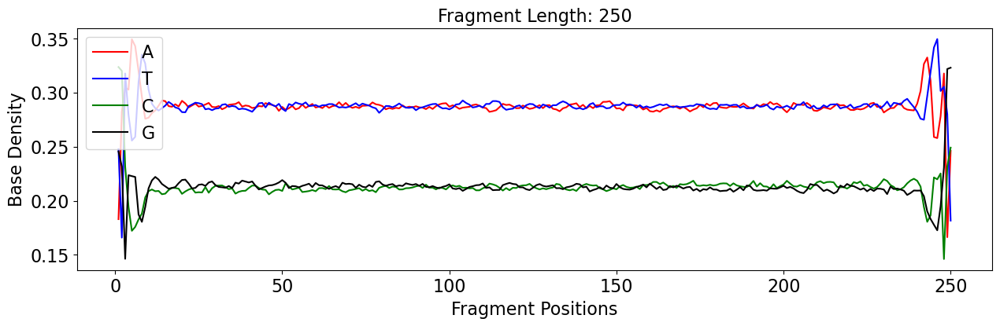

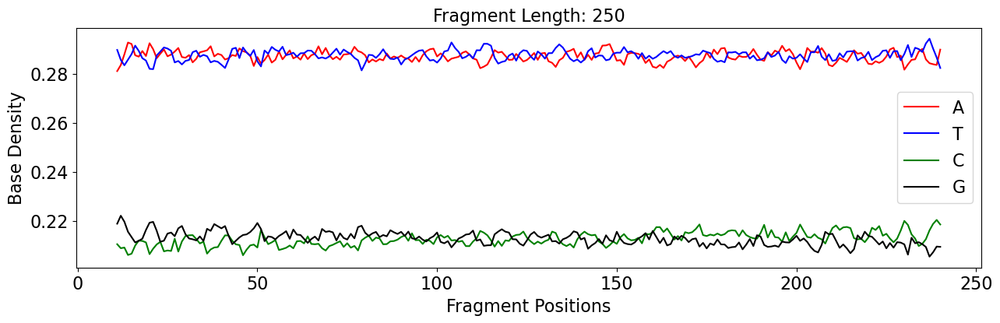

.....................................................................................................................


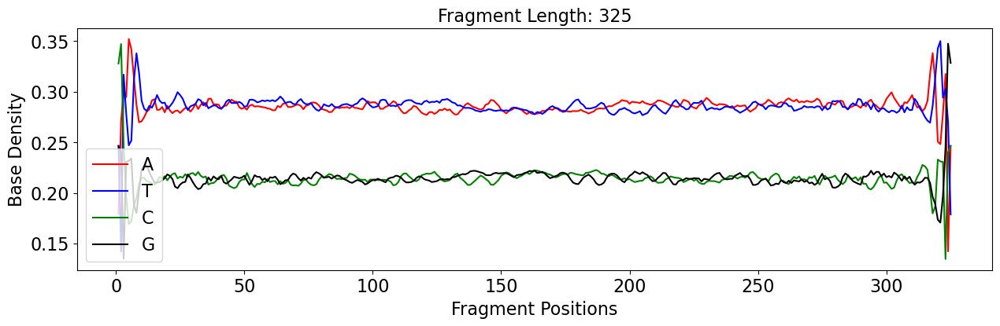

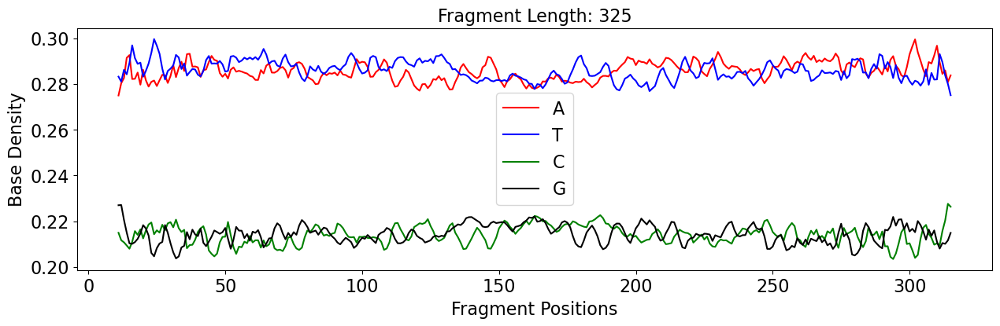

.....................................................................................................................


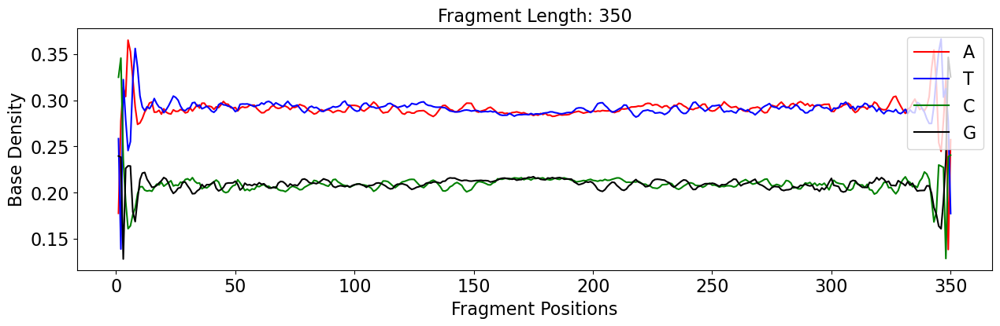

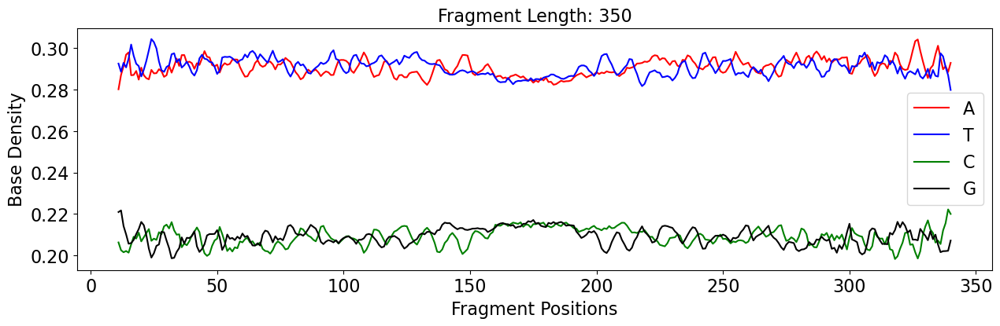

.....................................................................................................................


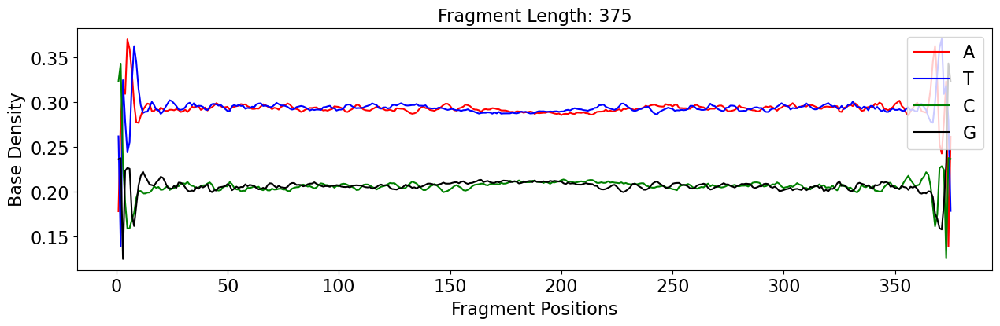

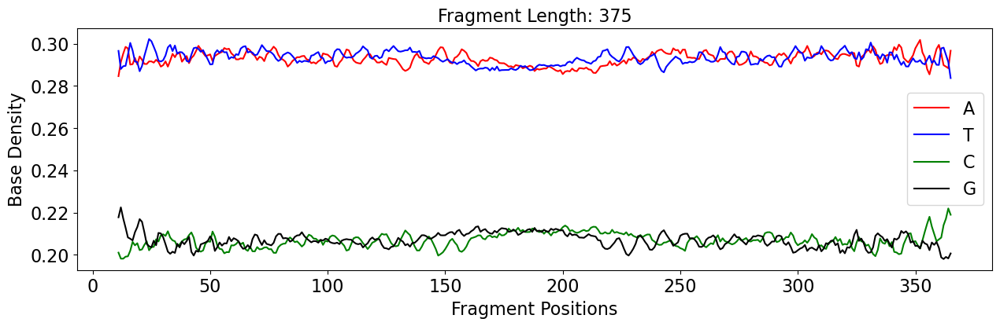

.....................................................................................................................


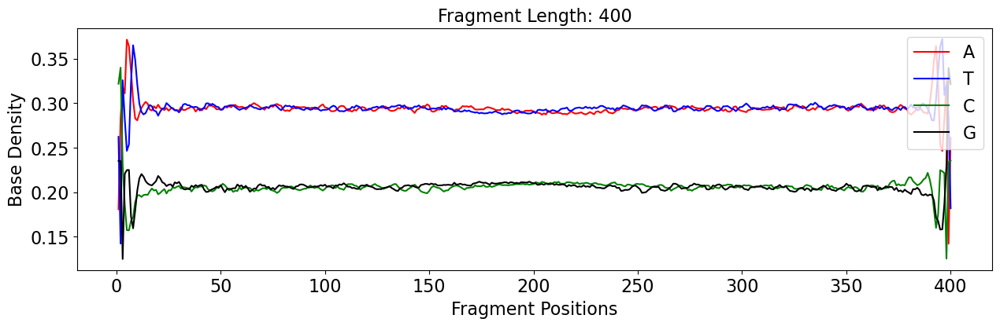

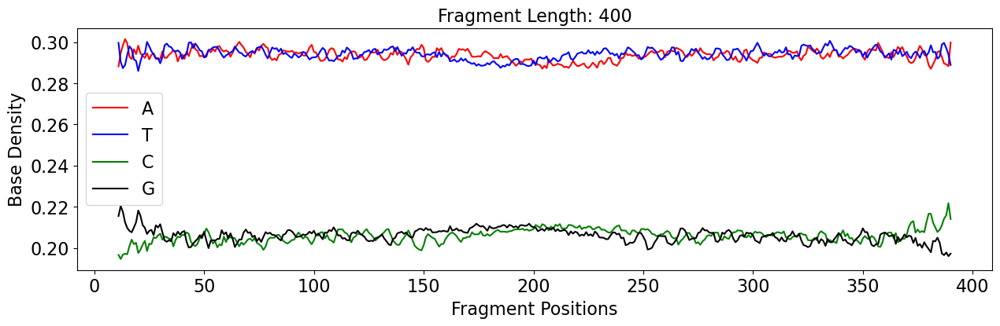

.....................................................................................................................


In [15]:
lengths = [51, 75, 100, 125, 150, 175, 200, 225, 250, 325, 350, 375, 400]
ind_to_lens = {}
for i in range(len(lengths)):
    ind_to_lens[i] = lengths[i]
ind_to_bases = {0:'A', 1:'T', 2:'C', 3:'G'}


def plot_position_freq_no_lag(sample, len_ind):
    global ind_to_lens, ind_to_bases
    base_to_colors = {'A': 'red', 'T': 'blue', 'C': 'green', 'G': 'black'}
    len_freqs = sample[len_ind, :, :] # (400, 4)
    length = ind_to_lens[len_ind]
    X = [i for i in range(1, length+1)]
    Y = len_freqs[:length, :]
    Y = Y / np.sum(Y, axis=1)[:, np.newaxis]
    plt.figure(figsize=(15, 4))
    for i in range(Y.shape[1]):
        y = Y[:, i]
        base_char = ind_to_bases[i]
        plt.plot(X, y, label=base_char, color=base_to_colors[base_char])
    plt.xlabel('Fragment Positions', fontsize=16)
    plt.ylabel('Base Density', fontsize=16)
    plt.title(f'Fragment Length: {length}', fontsize=16)
    plt.tick_params(axis='both', labelsize=16)
    plt.legend(fontsize=16)
    plt.show()
    

def plot_position_freq_lagged(sample, len_ind, left_lag, right_lag):
    global ind_to_lens, ind_to_bases
    base_to_colors = {'A': 'red', 'T': 'blue', 'C': 'green', 'G': 'black'}
    len_freqs = sample[len_ind, :, :] # (400, 4)
    length = ind_to_lens[len_ind]
    X = [i for i in range(1+left_lag, length+1-right_lag)]
    Y = len_freqs[left_lag: length-right_lag, :]
    Y = Y / np.sum(Y, axis=1)[:, np.newaxis]
    plt.figure(figsize=(15, 4))
    for i in range(Y.shape[1]):
        y = Y[:, i]
        base_char = ind_to_bases[i]
        plt.plot(X, y, label=base_char, color=base_to_colors[base_char])
    plt.xlabel('Fragment Positions', fontsize=16)
    plt.ylabel('Base Density', fontsize=16)
    plt.title(f'Fragment Length: {length}', fontsize=16)
    plt.tick_params(axis='both', labelsize=16)
    plt.legend(fontsize=16)
    plt.show()

    
def main_func(sample_name):
    sample_file = f'{root_folder}/GC_Bias_Analysis/fragment_end_bias/{sample_name}.npy'
    sample = np.load(sample_file)
    for i in range(len(lengths)):
        plot_position_freq_no_lag(sample, i)
        plot_position_freq_lagged(sample, i, 10, 10)
        print('.....................................................................................................................')
        
# possible sample names: WHC556.sort, WHC565.sort, WHC1384, WHC1395
main_func('WHC1384')

# Suppl Fig 2

NCC_CRC-986_100215-CW-T-ready


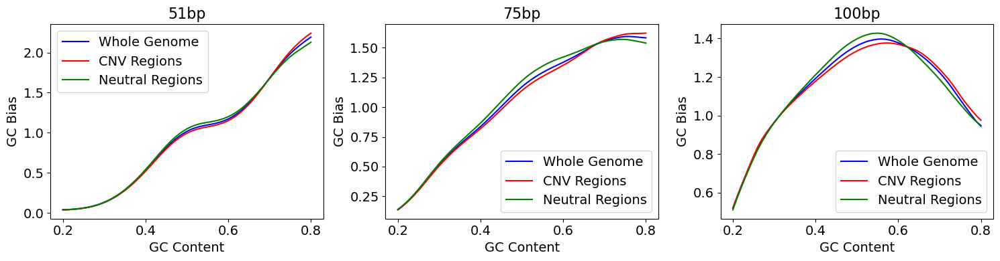

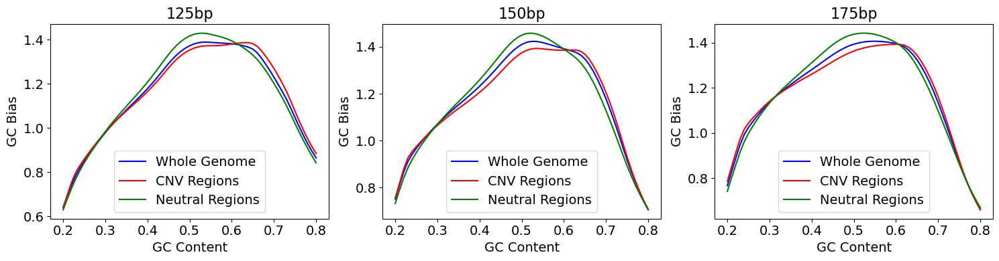

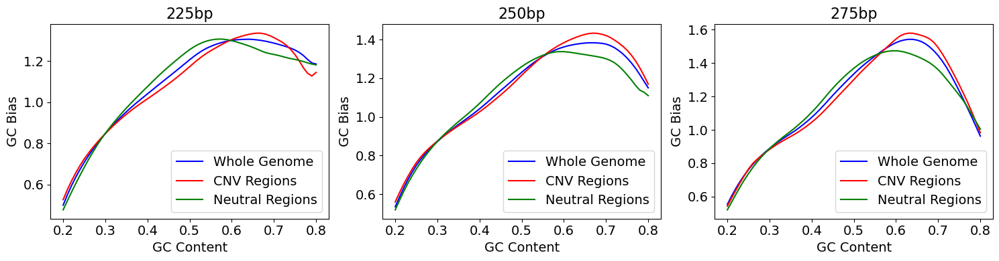

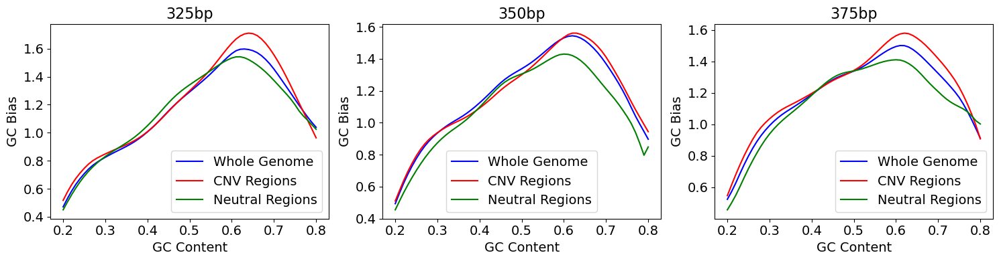

.................................................................................................................


In [24]:
def process_sample_length_level(sample_file):
    raw_sample = np.load(sample_file)
    processed_sample = np.zeros( raw_sample.shape )
    for i in range(raw_sample.shape[0]):
        processed_sample[i, :] = interpolate_zero_elements(np.copy(raw_sample[i, :]))
    return processed_sample


def process_ref_length_level(sample):
    raw_sample = np.sum(sample, axis=0)
    processed_sample = np.zeros( raw_sample.shape )
    for i in range(raw_sample.shape[0]):
        processed_sample[i, :] = interpolate_zero_elements(np.copy(raw_sample[i, :]))
    return processed_sample


lower_cnt, upper_cnt = 10, 90
thr = 3
lag = 10
len_group_dic = {51: [51, 55],
                     52: [51, 55],
                     399: [396, 400],
                     400: [396, 400]}
for length in range(53, 399):
    len_group_dic[length] = [length-2, length+2]


def remove_outlier(arr):
    high = np.percentile(arr, 100-thr)
    low = np.percentile(arr, thr)
    arr = np.where(arr>high, high, arr)
    arr = np.where(arr<low, low, arr)
    return arr


def construct_GC_bias(sample_lengths, ref_lengths, X):
    sample = np.sum(sample_lengths, axis=0)
    ref = np.sum(ref_lengths, axis=0)
    safe_ref = ref + 1
    GC_array = sample / safe_ref
    GC_array = GC_array[lower_cnt: upper_cnt+1]
    GC_array = remove_outlier(GC_array)
    GC_array = GC_array / np.mean(GC_array)
    lowess = sm.nonparametric.lowess(GC_array, X, frac=0.2)
    GC_array = lowess[:, 1]
    GC_array = GC_array / np.mean(GC_array)
    return GC_array


def plot_len_GC_bias(sample_len_GC_array, ref_len_GC_array, frag_len, label, color, ax):
    global len_group_dic 
    X = [float(i/100) for i in range(lower_cnt, upper_cnt+1)]
    start_len_ind = len_group_dic[frag_len][0] - 51
    end_len_ind = len_group_dic[frag_len][1] - 51
    Y = construct_GC_bias(sample_len_GC_array[start_len_ind: end_len_ind+1], ref_len_GC_array[start_len_ind: end_len_ind+1], X)
    Y = Y[lag: -lag]
    min_thr = min(1/20, np.percentile(Y, 1))
    Y[Y<min_thr] = min_thr
    ax.plot(X[lag:-lag], Y, label=label, color=color)


def main_func(sample_name):
    length_group_list = [[51, 75, 100], [125, 150, 175], [225, 250, 275], [325, 350, 375]]
    folder = f'{root_folder}/GC_Bias_Analysis/cancer_GC_experiments'
    print(sample_name)
    global ref_GC_array
    ref_len_GC_array = process_ref_length_level(ref_GC_array)
    whole_sample = process_sample_length_level(f'{folder}/whole_genome/{sample_name}.npy')
    cnv_sample = process_sample_length_level(f'{folder}/cnv_regions/{sample_name}.npy')
    neutral_sample = process_sample_length_level(f'{folder}/neutral_regions/{sample_name}.npy')
    for len_group in length_group_list:
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        for i in range(len(len_group)):
            plot_len_GC_bias(whole_sample, ref_len_GC_array, len_group[i], 'Whole Genome', 'blue', axes[i])
            plot_len_GC_bias(cnv_sample, ref_len_GC_array, len_group[i], 'CNV Regions', 'red', axes[i])
            plot_len_GC_bias(neutral_sample, ref_len_GC_array, len_group[i], 'Neutral Regions', 'green', axes[i])
            axes[i].set_title(f'{len_group[i]}bp', fontsize=16)
            axes[i].set_xlabel('GC Content', fontsize=14)
            axes[i].set_ylabel('GC Bias', fontsize=14)
            axes[i].tick_params(axis='both', labelsize=14)
            axes[i].legend(fontsize=14)
        plt.tight_layout()
        plt.show()
    print('.................................................................................................................')
        

main_func('NCC_CRC-986_100215-CW-T-ready')

# Suppl Fig 3

healthy_invitro WHC1389


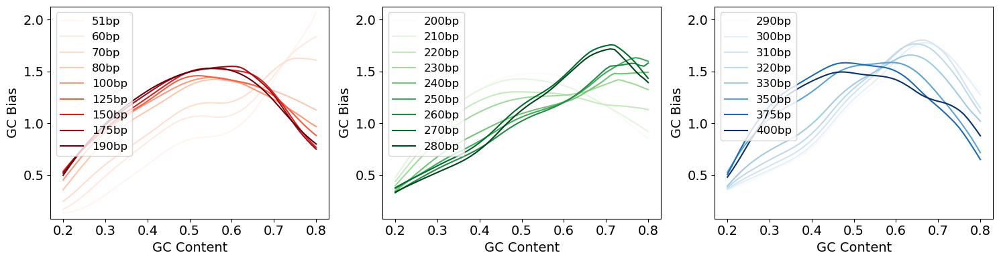

.................................................................................................................
crc_gis NCC_CRC-512_051015-CW-T-ready


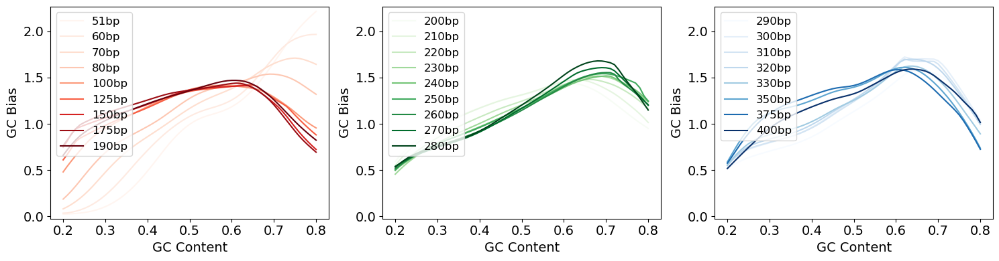

.................................................................................................................
brca_gis D7


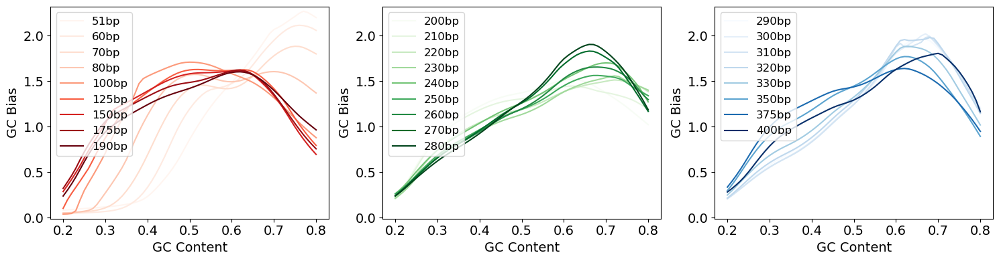

.................................................................................................................


In [30]:
lower_cnt, upper_cnt = 10, 90
thr = 3
lag = 10


len_group_dic = {51: [51, 55],
                     52: [51, 55],
                     399: [396, 400],
                     400: [396, 400]}
for length in range(53, 399):
    len_group_dic[length] = [length-2, length+2]
    

def process_length_level(sample):
    raw_sample = np.sum(sample, axis=0)
    processed_sample = np.zeros( raw_sample.shape )
    for i in range(raw_sample.shape[0]):
        processed_sample[i, :] = interpolate_zero_elements(np.copy(raw_sample[i, :]))
    return processed_sample


def remove_outlier(arr):
    high = np.percentile(arr, 100-thr)
    low = np.percentile(arr, thr)
    arr = np.where(arr>high, high, arr)
    arr = np.where(arr<low, low, arr)
    return arr


def construct_GC_bias(sample_lengths, ref_lengths, X):
    sample = np.sum(sample_lengths, axis=0)
    ref = np.sum(ref_lengths, axis=0)
    safe_ref = ref + 1
    GC_array = sample / safe_ref
    
    GC_array = GC_array[lower_cnt: upper_cnt+1]
    GC_array = remove_outlier(GC_array)
    GC_array = GC_array / np.mean(GC_array)
    
    lowess = sm.nonparametric.lowess(GC_array, X, frac=0.2)
    GC_array = lowess[:, 1]
    GC_array = GC_array / np.mean(GC_array)
    return GC_array


def plot_len_GC_bias(sample_len_GC_array, frag_len, ref_len_GC_array, color, ax):
    global len_group_dic 
    X = [float(i/100) for i in range(lower_cnt, upper_cnt+1)]
    start_len_ind = len_group_dic[frag_len][0] - 51
    end_len_ind = len_group_dic[frag_len][1] - 51
    Y = construct_GC_bias(sample_len_GC_array[start_len_ind: end_len_ind+1], ref_len_GC_array[start_len_ind: end_len_ind+1], X)
    Y = Y[lag: -lag]
    min_thr = min(1/20, np.percentile(Y, 1))
    Y[Y<min_thr] = min_thr
    ax.plot(X[lag:-lag], Y, label=f'{frag_len}bp', color=color)
    return np.min(Y), np.max(Y)
    
    
def main_func(cohort, sample_name):
    print(cohort, sample_name)
    color_list = ['Reds', 'Greens', 'Blues']
    length_lists = [[51, 60, 70, 80, 100, 125, 150, 175, 190], [200, 210, 220, 230, 240, 250, 260, 270, 280],
                         [290, 300, 310, 320, 330, 350, 375, 400]]
    global ref_GC_array
    ref_len_GC_array = process_length_level(ref_GC_array)
    sample = np.load(f'{root_folder}/GC_Bias_Analysis/single_position_analysis_22_350_101_samples/{cohort}/{sample_name}.npy')
    processed_sample = process_length_level(sample)
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    min_bias, max_bias = 10, -10
    for i in range(len(length_lists)):
        cmap = plt.get_cmap(color_list[i])
        lengths = length_lists[i]
        norm = mcolors.Normalize(vmin=min(lengths), vmax=max(lengths))
        for length in lengths:
            color = cmap(norm(length))
            temp_min, temp_max = plot_len_GC_bias(processed_sample, length, ref_len_GC_array, color, axes[i])
            min_bias = min(temp_min, min_bias)
            max_bias = max(temp_max, max_bias)
        axes[i].set_xlabel('GC Content', fontsize=14)
        axes[i].set_ylabel('GC Bias', fontsize=14)
        axes[i].legend(fontsize=12)
        axes[i].tick_params(axis='both', labelsize=14)
    for i in range(3):
        axes[i].set_ylim([min_bias-0.05, max_bias+0.05])
    plt.tight_layout()
    plt.show()
    print('.................................................................................................................')
    
        
main_func('healthy_invitro', 'WHC1389')
main_func('crc_gis', 'NCC_CRC-512_051015-CW-T-ready')
main_func('brca_gis', 'D7')

# Suppl Fig 4

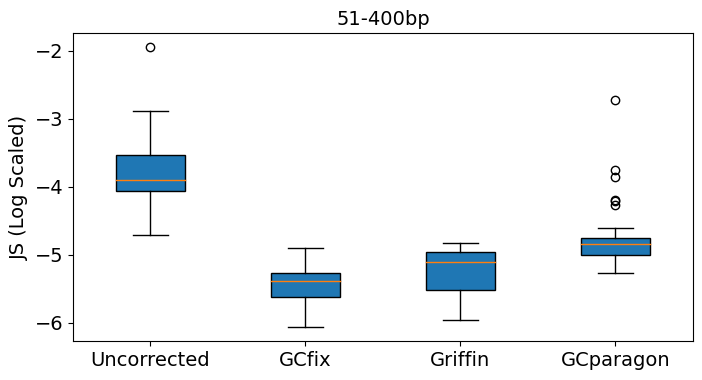

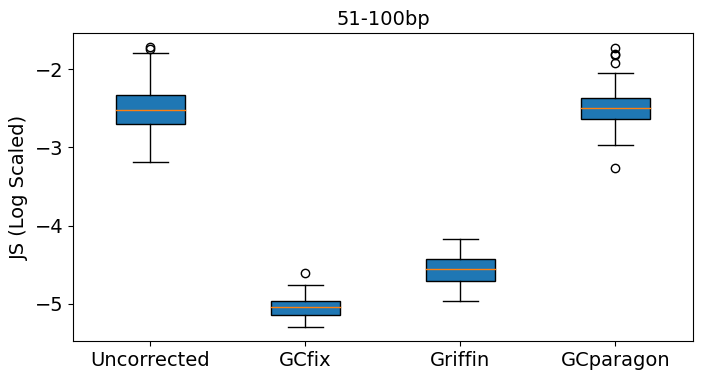

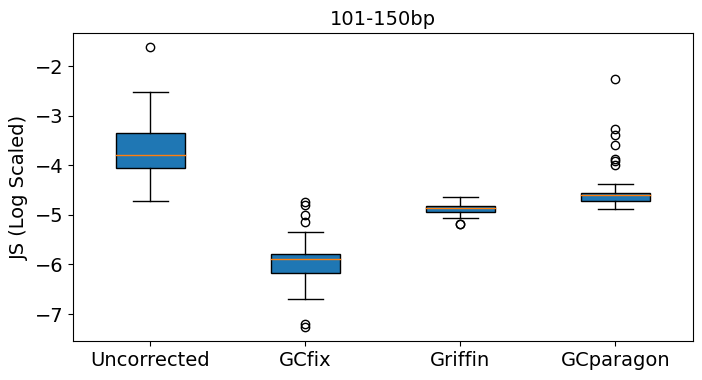

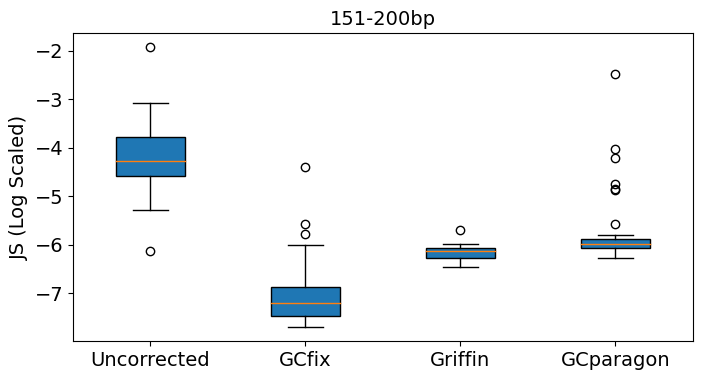

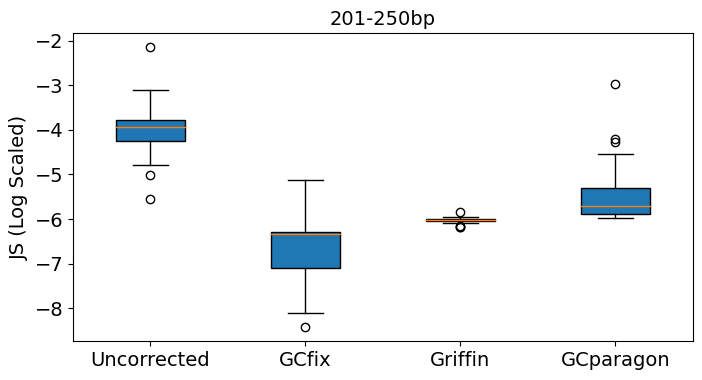

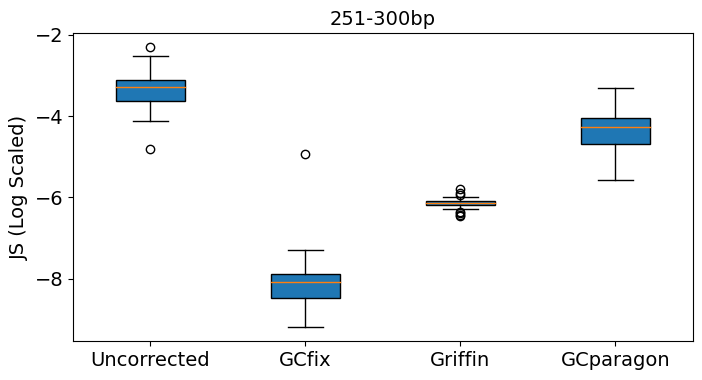

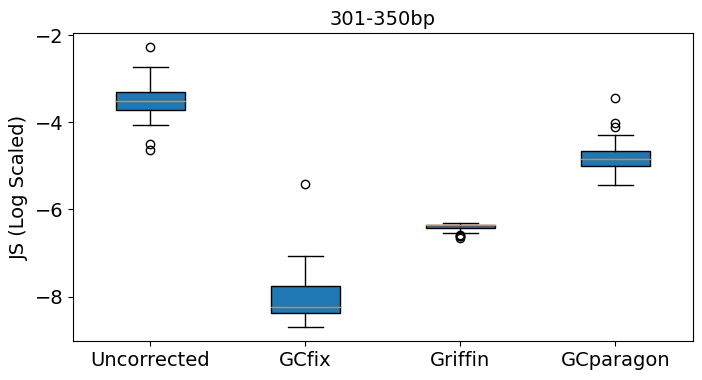

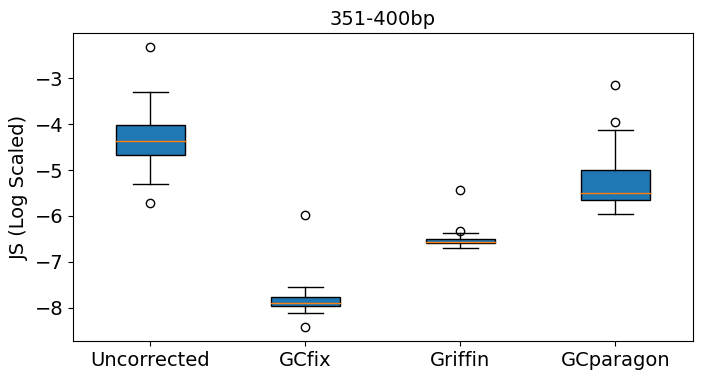

In [35]:
len_groups = [[51, 400], [51, 100], [101, 150], [151, 200], [201, 250], [251, 300], [301, 350], [351, 400]]
methods = ['Original', 'Proposed', 'Griffin', 'GCparagon']

def load_JS(METHOD, len_group):
    dic_path = f'{root_folder}/Performance_Metrics/deepWGS_original/{METHOD}/reference_JS_divergence.pkl'
    cohorts = ['BRCA_gis', 'CRC_gis', 'healthy_c2i', 'healthy_invitro']
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    JS_list = []
    for cohort in cohorts:
        files = os.listdir(f'{root_folder}/Performance_Metrics/Samples/{cohort}/')
        sample_names = [file_[:-4] for file_ in files]
        for sample_name in sample_names:
            key = f'{sample_name}: {len_group[0]}-{len_group[1]}'
            JS_list.append(np.log2(dic[key]))
    return JS_list
    

def compare_JS(len_group):
    data = []
    for method in methods:
        data.append( load_JS(method, len_group) )
    title = f'{len_group[0]}-{len_group[1]}bp'
    plt.figure(figsize=(8, 4))
    labels = ['Uncorrected', 'GCfix', 'Griffin', 'GCparagon']
    plt.boxplot(data, patch_artist=True, vert=True, labels=labels)
    plt.title(title, fontsize=14)
    plt.ylabel('JS (Log Scaled)', fontsize=14)
    plt.tick_params(axis='both', labelsize=14)
    plt.show()

for len_group in len_groups:
    compare_JS(len_group)

# Suppl Fig 5

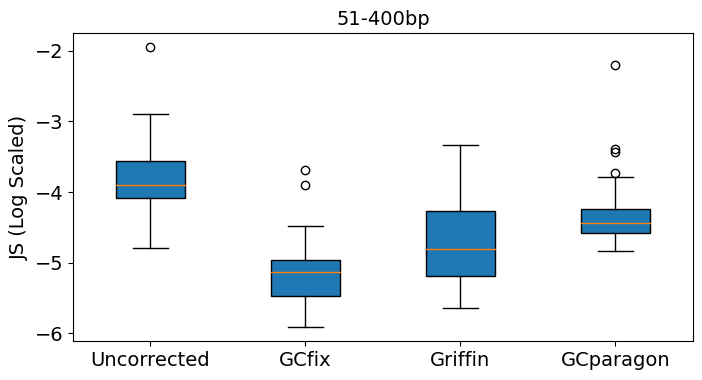

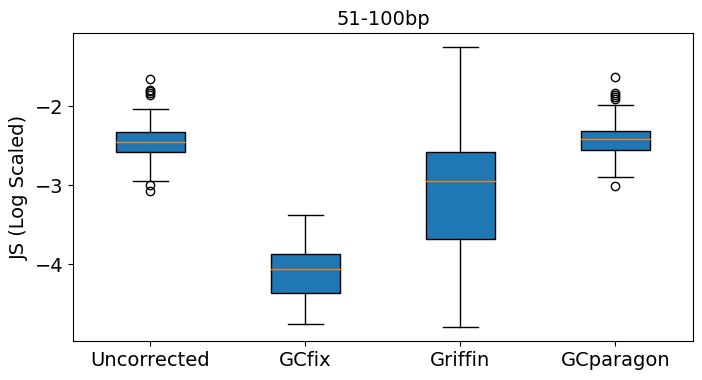

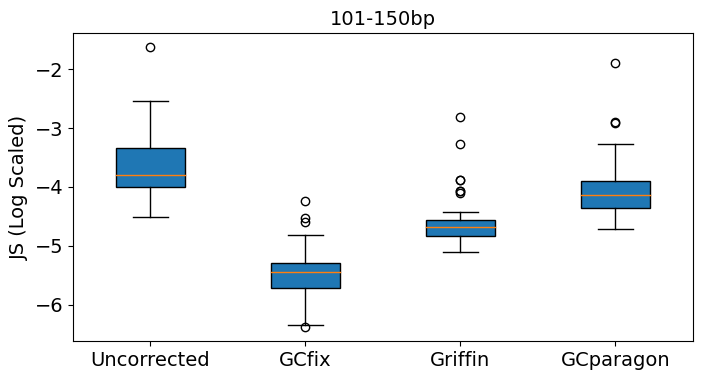

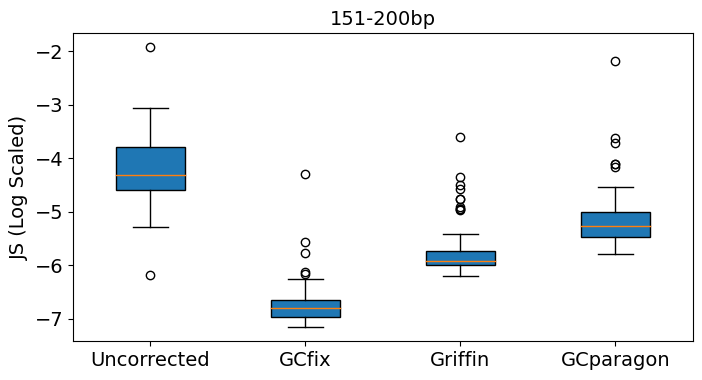

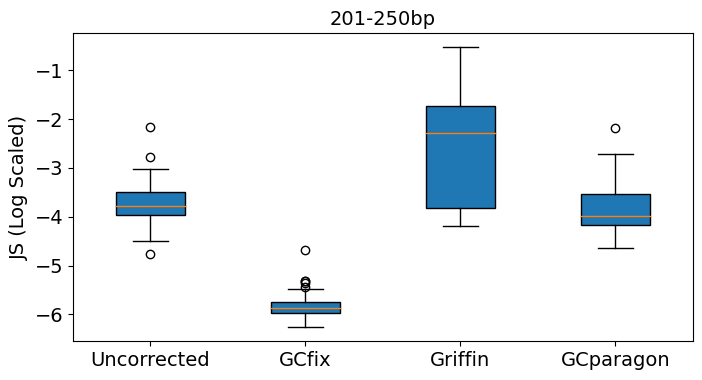

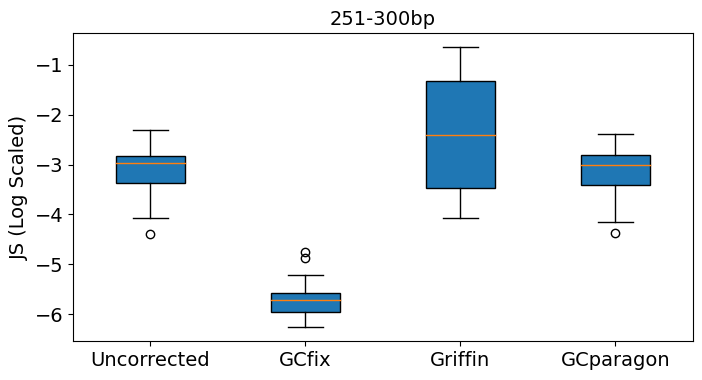

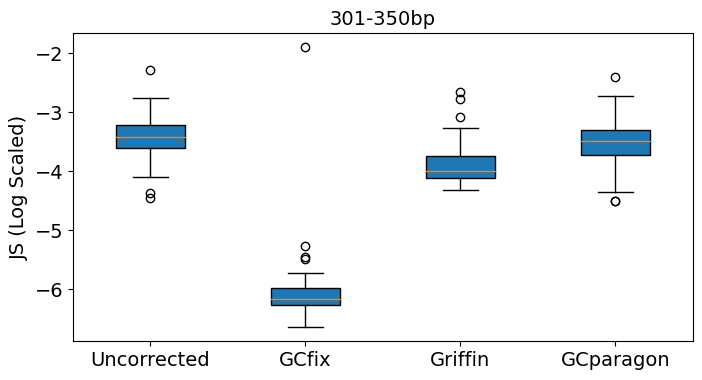

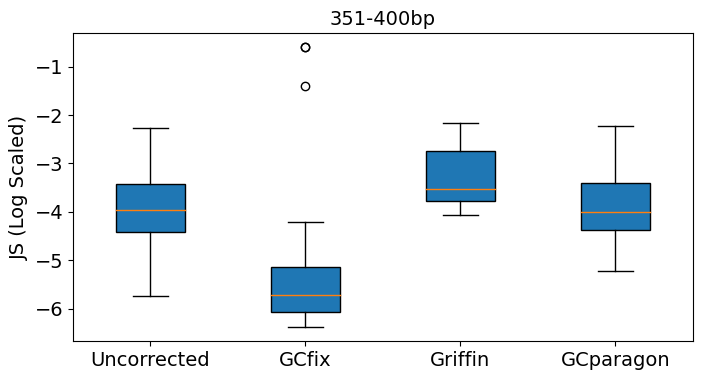

In [36]:
len_groups = [[51, 400], [51, 100], [101, 150], [151, 200], [201, 250], [251, 300], [301, 350], [351, 400]]
methods = ['Original', 'Proposed', 'Griffin', 'GCparagon']

def load_JS(METHOD, len_group):
    dic_path = f'{root_folder}/Performance_Metrics/lpWGS_0.1X_1Mb/{METHOD}/reference_JS_divergence.pkl'
    cohorts = ['BRCA_gis', 'CRC_gis', 'healthy_c2i', 'healthy_invitro']
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    JS_list = []
    for cohort in cohorts:
        files = os.listdir(f'{root_folder}/Performance_Metrics/Samples/{cohort}/')
        sample_names = [file_[:-4] for file_ in files]
        for sample_name in sample_names:
            key = f'{sample_name}: {len_group[0]}-{len_group[1]}'
            JS_list.append(np.log2(dic[key]))
    return JS_list
    

def compare_JS(len_group):
    data = []
    for method in methods:
        data.append( load_JS(method, len_group) )
    title = f'{len_group[0]}-{len_group[1]}bp'
    plt.figure(figsize=(8, 4))
    labels = ['Uncorrected', 'GCfix', 'Griffin', 'GCparagon']
    plt.boxplot(data, patch_artist=True, vert=True, labels=labels)
    plt.title(title, fontsize=14)
    plt.ylabel('JS (Log Scaled)', fontsize=14)
    plt.tick_params(axis='both', labelsize=14)
    plt.show()

for len_group in len_groups:
    compare_JS(len_group)

# Suppl Fig 6

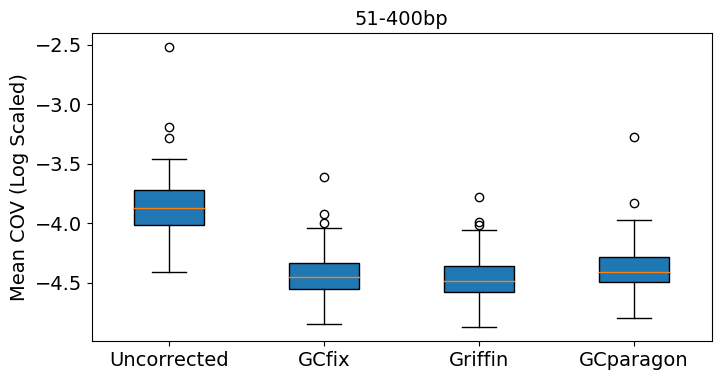

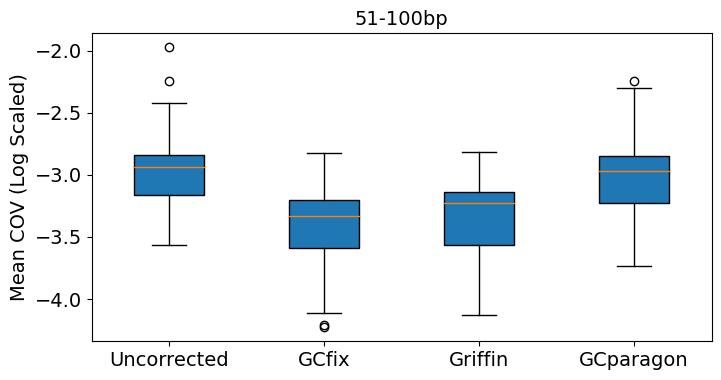

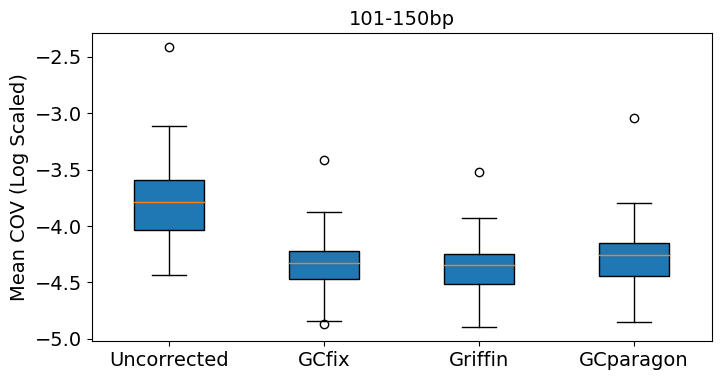

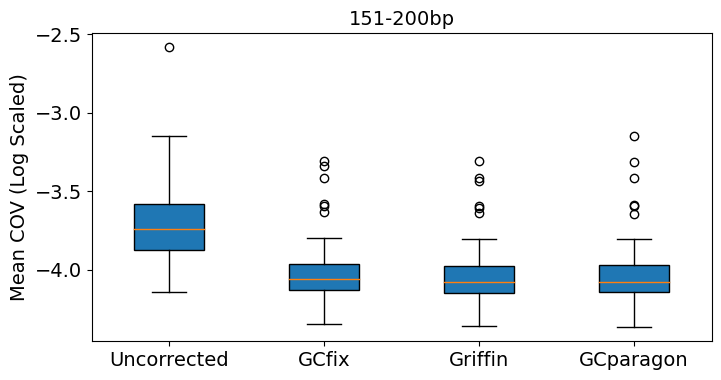

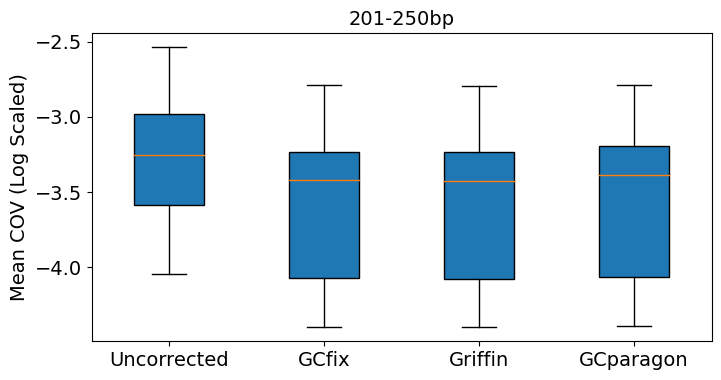

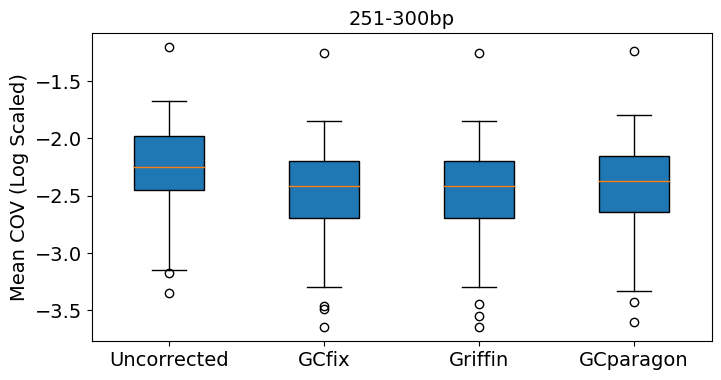

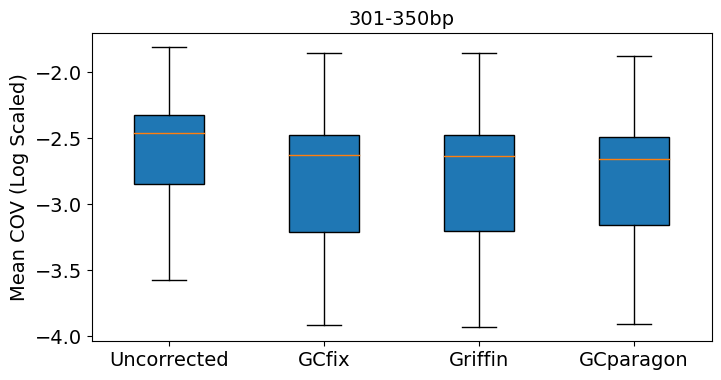

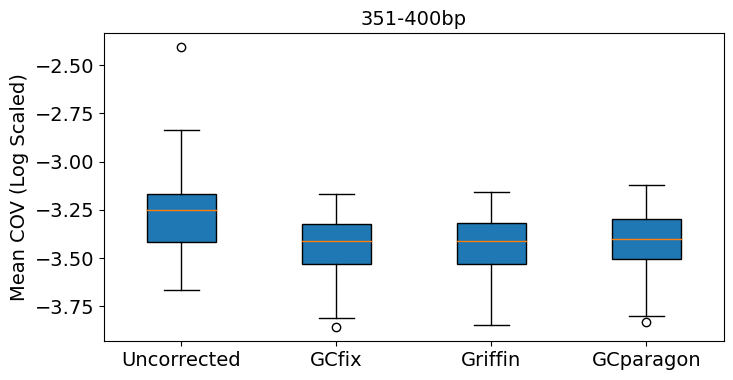

In [39]:
len_groups = [[51, 400], [51, 100], [101, 150], [151, 200], [201, 250], [251, 300], [301, 350], [351, 400]]
methods = [ 'Original', 'Proposed', 'Griffin', 'GCparagon']

def load_CV(METHOD, group_index):
    dic_path = f'{root_folder}/Performance_Metrics/deepWGS_original/{METHOD}/CV.pkl'
    cohorts = ['BRCA_gis', 'CRC_gis', 'healthy_c2i', 'healthy_invitro']
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    CV_list = []
    for cohort in cohorts:
        files = os.listdir(f'{root_folder}/Performance_Metrics/Samples/{cohort}/')
        sample_names = [file_[:-4] for file_ in files]
        for sample_name in sample_names:
            mean_CV = np.mean( dic[sample_name][group_index] )
            CV_list.append(np.log2(mean_CV))
    return CV_list


def compare_CV(group_index):
    data = []
    for method in methods:
        data.append( load_CV(method, group_index) )
    title = f'{len_groups[group_index][0]}-{len_groups[group_index][1]}bp'
    plt.figure(figsize=(8, 4))
    labels = ['Uncorrected', 'GCfix', 'Griffin', 'GCparagon']
    plt.boxplot(data, patch_artist=True, vert=True, labels=labels)
    plt.title(title, fontsize=14)
    plt.ylabel('Mean COV (Log Scaled)', fontsize=14)
    plt.tick_params(axis='both', labelsize=14)
    plt.show()

for i in range(len(len_groups)):
    compare_CV(i)

# Suppl Fig 7

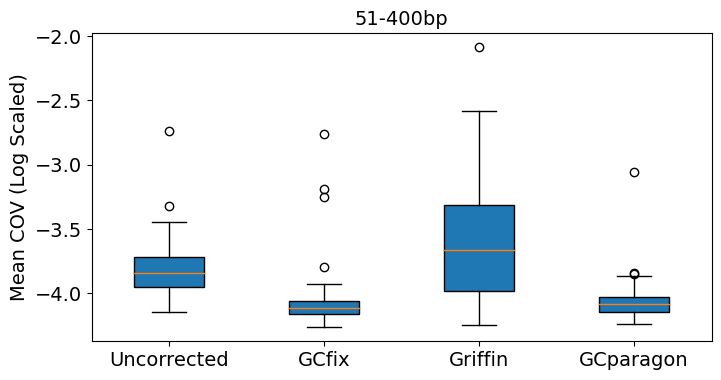

In [42]:
methods = ['Original', 'Proposed', 'Griffin', 'GCparagon']

def load_CV(METHOD):
    dic_path = f'{root_folder}/Performance_Metrics/lpWGS_0.1X_1Mb/{METHOD}/CV.pkl'
    cohorts = ['BRCA_gis', 'CRC_gis', 'healthy_c2i', 'healthy_invitro']
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    CV_list = []
    for cohort in cohorts:
        files = os.listdir(f'{root_folder}/Performance_Metrics/Samples/{cohort}/')
        sample_names = [file_[:-4] for file_ in files]
        for sample_name in sample_names:
            mean_CV = np.mean( dic[sample_name] )
            CV_list.append(np.log2(mean_CV))
    return CV_list

data = []
for method in methods:
    data.append( load_CV(method) )
plt.figure(figsize=(8, 4))
labels = ['Uncorrected', 'GCfix', 'Griffin', 'GCparagon']
plt.boxplot(data, patch_artist=True, vert=True, labels=labels)
plt.title('51-400bp', fontsize=14)
plt.ylabel('Mean COV (Log Scaled)', fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.show()

# Suppl Fig 8

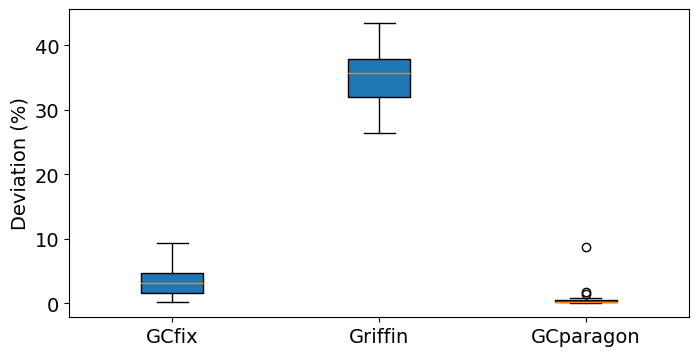

In [45]:
methods = ['Proposed', 'Griffin', 'GCparagon']

def load_deviations(METHOD):
    dic_path = f'{root_folder}/Performance_Metrics/deepWGS_original/{METHOD}/fragment_no_deviation.pkl'
    cohorts = ['BRCA_gis', 'CRC_gis', 'healthy_c2i', 'healthy_invitro']
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    deviations = []
    for cohort in cohorts:
        files = os.listdir(f'{root_folder}/Performance_Metrics/Samples/{cohort}/')
        sample_names = [file_[:-4] for file_ in files]
        for sample_name in sample_names:
            deviations.append(dic[sample_name])
    return deviations

data = []
for method in methods:
    data.append( load_deviations(method) )
plt.figure(figsize=(8, 4))
labels = ['GCfix', 'Griffin', 'GCparagon']
plt.boxplot(data, patch_artist=True, vert=True, labels=labels)
plt.ylabel('Deviation (%)', fontsize=14)
plt.tick_params(axis='both', labelsize=14)
plt.show()

# Suppl Fig 9

In [10]:
performance_folder = f'{root_folder}/Performance_Metrics'

cov_folders = ['lpWGS_0.1X_1Mb', 'lpWGS_1X', 'lpWGS_2X', 'deepWGS_10X']
methods = ['Original', 'Proposed', 'Single_Length']
method_dic = {'Original': 'Original', 'Proposed': 'GCfix', 'Single_Length': 'GCfix_GC_only'}
methods_marker_dic = {'Original': 'D', 'Proposed': 'o', 'Single_Length': '^'}
methods_color_dic = {'Original': 'm', 'Proposed': 'b', 'Single_Length': 'r'}
cohorts = ['BRCA_gis', 'CRC_gis', 'healthy_c2i', 'healthy_invitro']

X = np.log10(np.array([0.1, 1, 2, 10])).tolist()
X_labels = ['0.1X', '1X', '2X', '10X']

all_sample_list = []
main_folder = f'{performance_folder}/Samples/'
for cohort in cohorts:
    files = os.listdir(f'{main_folder}/{cohort}/')
    for file_ in files:
        all_sample_list.append(file_[:-4])

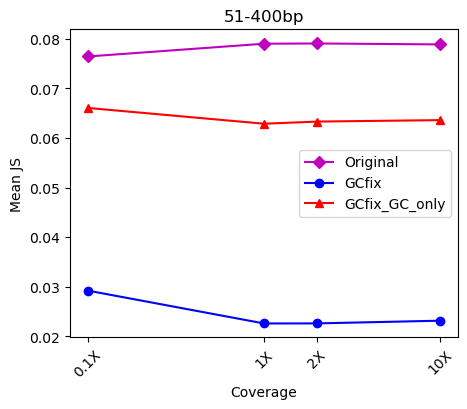

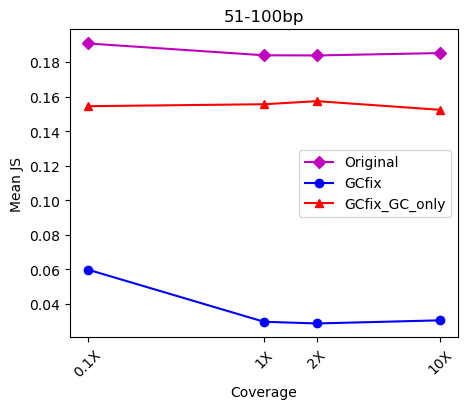

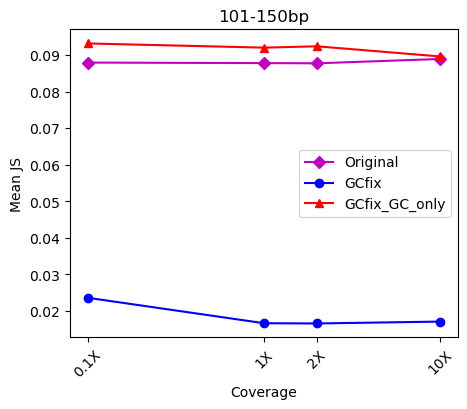

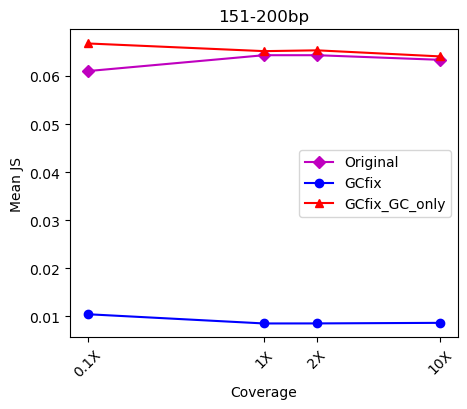

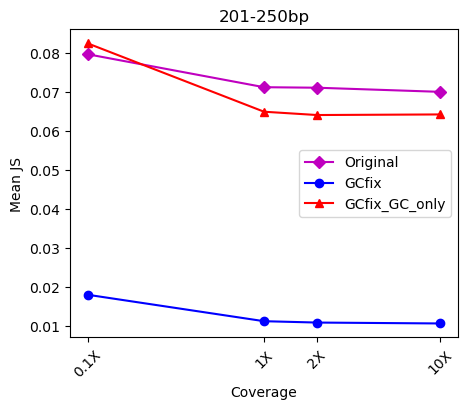

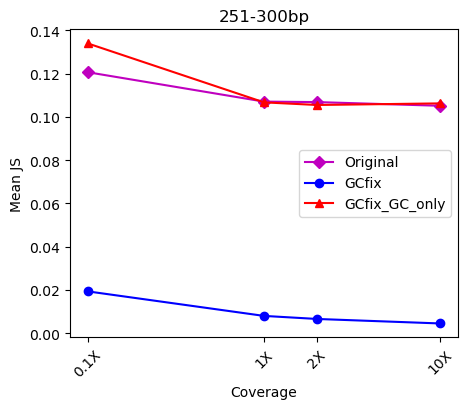

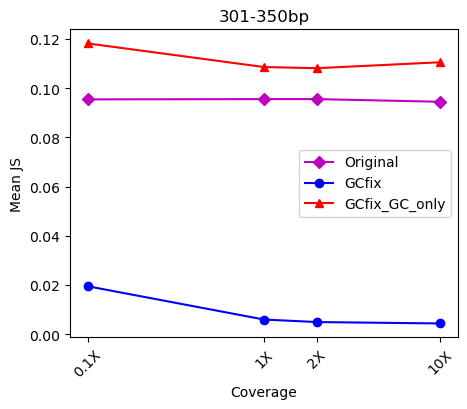

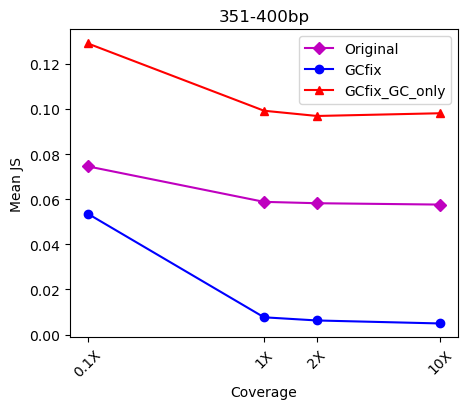

In [11]:
len_groups = [[51, 400], [51, 100], [101, 150], [151, 200], [201, 250], [251, 300], [301, 350], [351, 400]]

def load_JS(dic_path, len_group_str):
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    JS_list = []
    for sample in all_sample_list:
        key = f'{sample}: {len_group_str}'
        JS_list.append(dic[key])
    return np.mean(JS_list)

def plot_method_JS(METHOD, len_group_index):
    Y = []
    len_start, len_end = len_groups[len_group_index][0], len_groups[len_group_index][1]
    len_group_str = f'{len_start}-{len_end}'
    for cov_folder in cov_folders:
        dic_path = f'{performance_folder}/{cov_folder}/{METHOD}/reference_JS_divergence.pkl'
        Y.append( load_JS(dic_path, len_group_str) )
    color = methods_color_dic[METHOD]
    marker = methods_marker_dic[METHOD]
    plt.plot(X, Y, marker=marker, color=color, label=method_dic[METHOD])

def plot_len_group_JS(len_group_index):
    plt.figure(figsize=(5, 4))
    for method in methods:
        plot_method_JS(method, len_group_index)
    plt.xticks(X, X_labels, rotation=45)
    plt.xlabel('Coverage')
    plt.ylabel('Mean JS')
    plt.title(f'{len_groups[len_group_index][0]}-{len_groups[len_group_index][1]}bp')
    plt.legend()
    len_start, len_end = len_groups[len_group_index][0], len_groups[len_group_index][1]
    # plt.savefig(f'subfigures/{len_start}__{len_end}bp.png', dpi=300)
    plt.show()

for i in range(len(len_groups)):
    plot_len_group_JS(i)

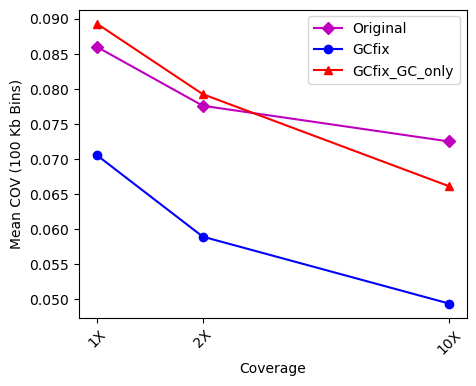

In [12]:
def load_CV(dic_path, cov_folder):
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    CV_list = []
    for sample in all_sample_list:
        if ('deep' in cov_folder) and ('Single_Length' not in dic_path):
            CV_list.append( np.mean(dic[sample][0]) )
        else:
            CV_list.append( np.mean(dic[sample]) )
    return np.mean(CV_list)

def plot_method_CV(METHOD):
    Y = []
    for cov_folder in cov_folders[1:]:
        dic_path = f'{performance_folder}/{cov_folder}/{METHOD}/CV.pkl'
        Y.append( load_CV(dic_path, cov_folder) )
    color = methods_color_dic[METHOD]
    marker = methods_marker_dic[METHOD]
    plt.plot(X[1:], Y, marker=marker, color=color, label=method_dic[METHOD])

plt.figure(figsize=(5, 4))
for method in methods:
    plot_method_CV(method)
plt.xticks(X[1:], X_labels[1:], rotation=45)
plt.xlabel('Coverage')
plt.ylabel('Mean COV (100 Kb Bins)')
plt.legend()
# plt.savefig(f'subfigures/COV_summary.png', dpi=300)
plt.show()

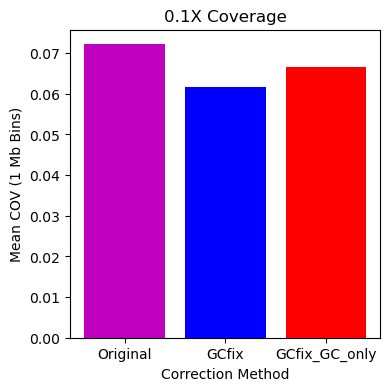

In [13]:
def load_CV(dic_path):
    dic = {}
    with open(dic_path, 'rb') as f:
        dic = pickle.load(f)
    CV_list = []
    for sample in all_sample_list:
        CV_list.append( np.mean(dic[sample]) )
    return np.mean(CV_list)

CVs, X_values, colors = [], [], []
for method in methods:
    dic_path = f'{performance_folder}/{cov_folders[0]}/{method}/CV.pkl'
    CVs.append( load_CV(dic_path) )
    X_values.append( method_dic[method] )
    colors.append( methods_color_dic[method] )
    
plt.figure(figsize=(4, 4))
plt.bar(X_values, CVs, color=colors)
plt.xlabel('Correction Method')
plt.ylabel('Mean COV (1 Mb Bins)')
plt.title('0.1X Coverage')

# Display the plot
# plt.savefig(f'subfigures/COV_summary_0.1X.png', dpi=300)
plt.show()

# Suppl Fig 10

In [17]:
correction_preds = pd.read_csv(f'{root_folder}/ichorCNA/correction_preds.csv').values.tolist()
no_correction_preds = pd.read_csv(f'{root_folder}/ichorCNA/no_correction_preds.csv').values.tolist()
vaf_list = pd.read_csv(f'{root_folder}/ichorCNA/max_vaf.csv').values.tolist()

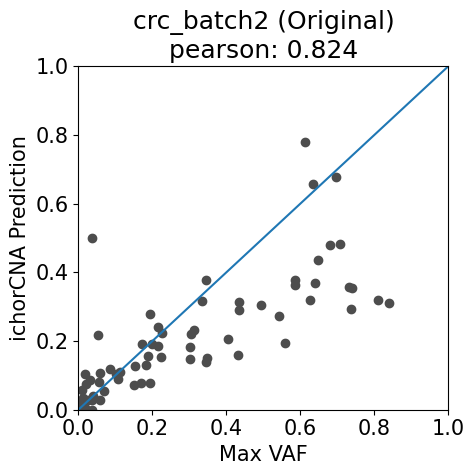

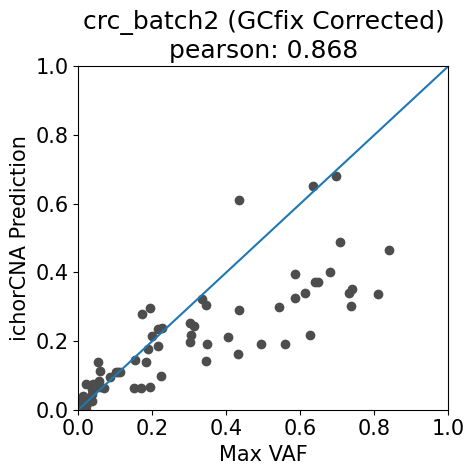

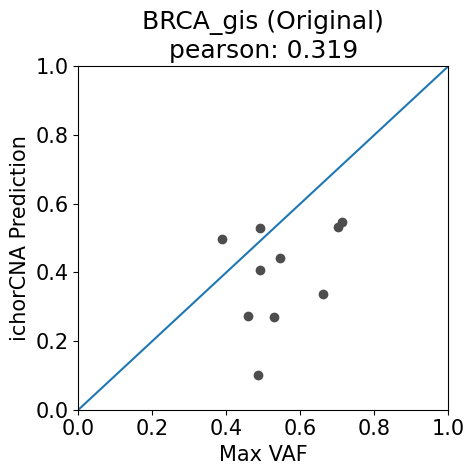

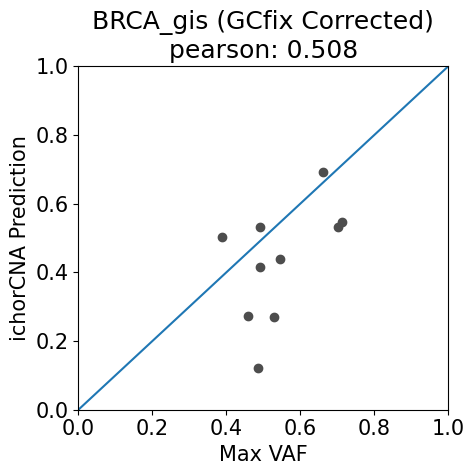

In [19]:
def plot_correlation(x, y, cohort_name, correction_str):
    f, ax = plt.subplots(figsize=(5, 5))
    ax.scatter(x, y, c=".3")
    ax.plot([0, 1], [0, 1], transform=ax.transAxes)
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.xlabel("Max VAF")
    plt.ylabel("ichorCNA Prediction")
    pearson_corr = round( pearsonr(x, y)[0], 3 )
    title = f'{cohort_name} ({correction_str})\npearson: {pearson_corr}'
    plt.title(title)
    plt.show()


def find_match(sample_id):
    global vaf_list
    for sample in vaf_list:
        if (sample[0] in sample_id) or (sample_id in sample[0]):
            return sample[1]
    return -1

def plot_vaf_correlation(cohort_name, pred_list, correction_str):
    pred_tfs, max_vafs = [], []
    for sample in pred_list:
        #print(sample[0], cohort_name)
        if sample[0] == cohort_name:
            max_vaf = find_match(sample[1])
            if max_vaf != -1:
                pred_tfs.append(sample[-1])
                max_vafs.append(max_vaf)
    plot_correlation(max_vafs, pred_tfs, cohort_name, correction_str)
    
plot_vaf_correlation('crc_batch2', no_correction_preds, 'Original')
plot_vaf_correlation('crc_batch2', correction_preds, 'GCfix Corrected')
plot_vaf_correlation('BRCA_gis', no_correction_preds, 'Original')
plot_vaf_correlation('BRCA_gis', correction_preds, 'GCfix Corrected')

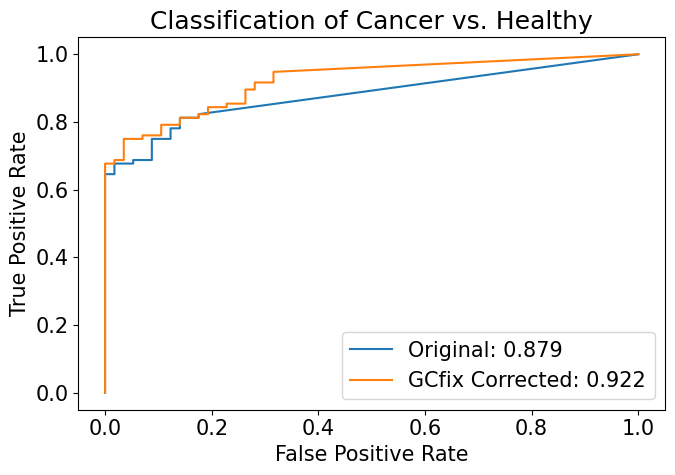

In [29]:
def plot_auROC(pred_list, correction_str):
    cancer_cnt, healthy_cnt = 0, 0
    cancer_tfs, healthy_tfs, pred_tfs = [], [], []
    for pred in pred_list:
        cohort, predicted = pred[0], pred[-1]
        if 'healthy' in cohort:
            healthy_cnt += 1
            healthy_tfs.append(predicted)
        else:
            cancer_cnt += 1
            cancer_tfs.append(predicted)
    pred_tfs.extend(cancer_tfs)
    pred_tfs.extend(healthy_tfs)
    trues = [1]*cancer_cnt + [0]*healthy_cnt
    fpr, tpr, _ = metrics.roc_curve(trues, pred_tfs)
    auc = round(metrics.roc_auc_score(trues, pred_tfs), 3)
    plt.plot(fpr, tpr, label=f'{correction_str}: {auc}')

plt.figure(figsize=(7, 5))
plot_auROC(no_correction_preds, 'Original')
plot_auROC(correction_preds, 'GCfix Corrected')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Classification of Cancer vs. Healthy')
plt.legend()
plt.show()

# Suppl Fig 11

In [ ]:
# See "Fig11_R_code" folder for the R code and relevant data to reproduce Suppl Fig S11

# Suppl Fig 12

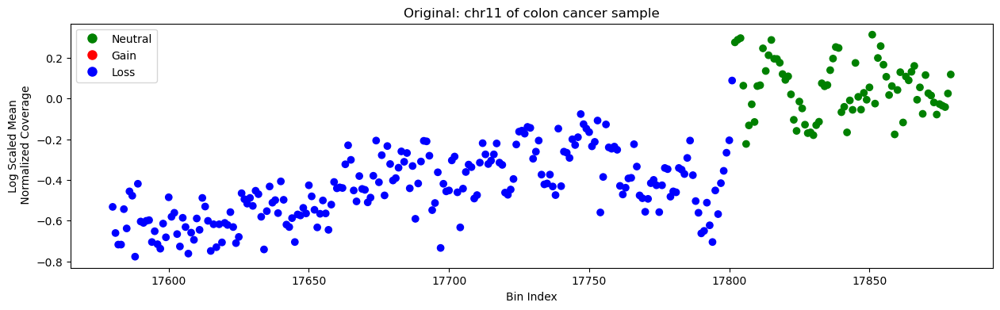

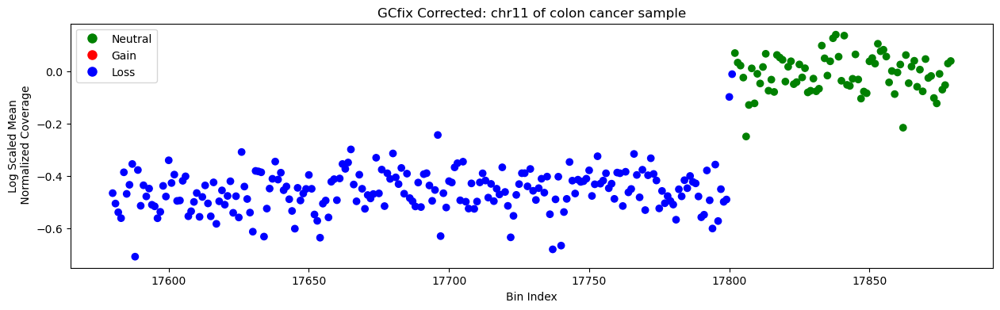

..................................................................................................................


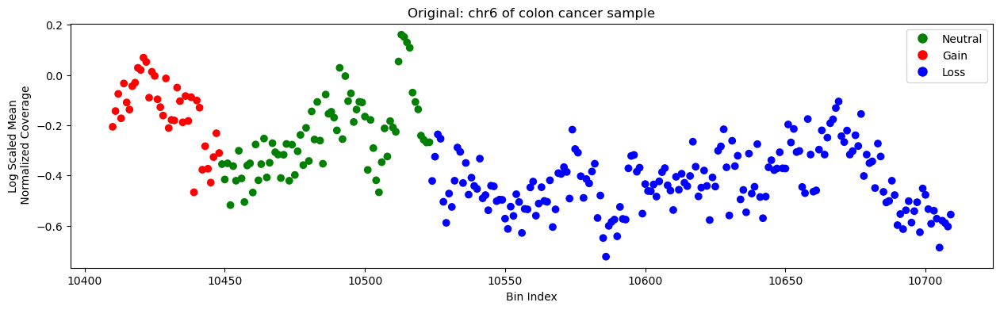

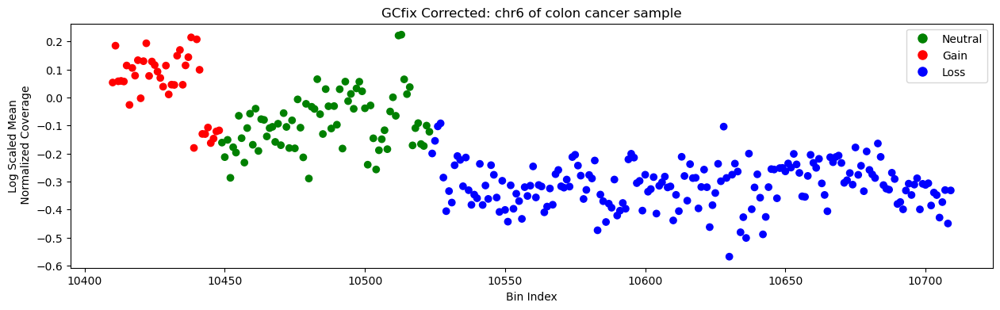

..................................................................................................................


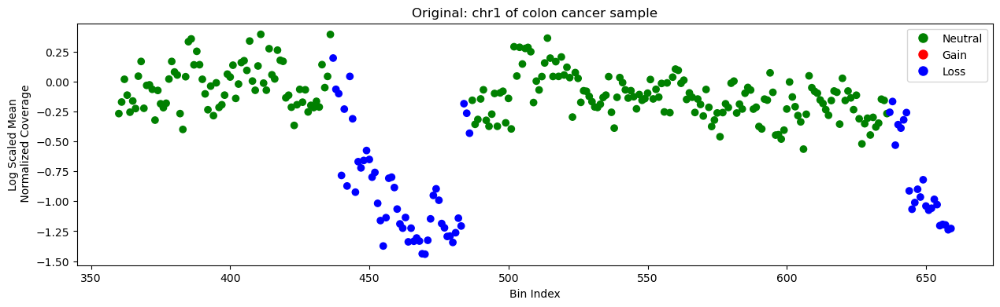

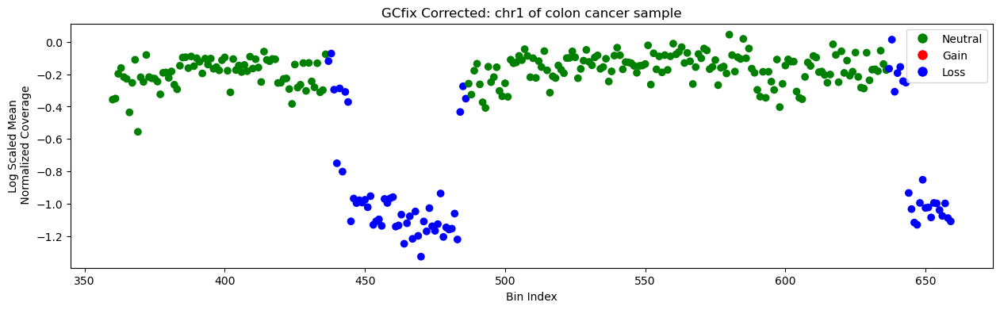

..................................................................................................................


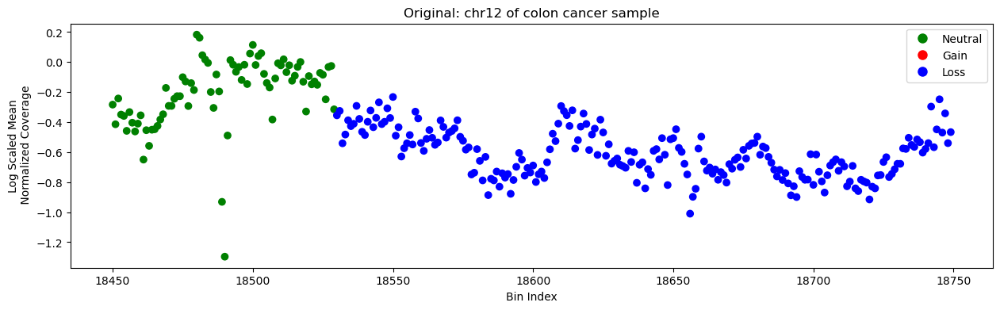

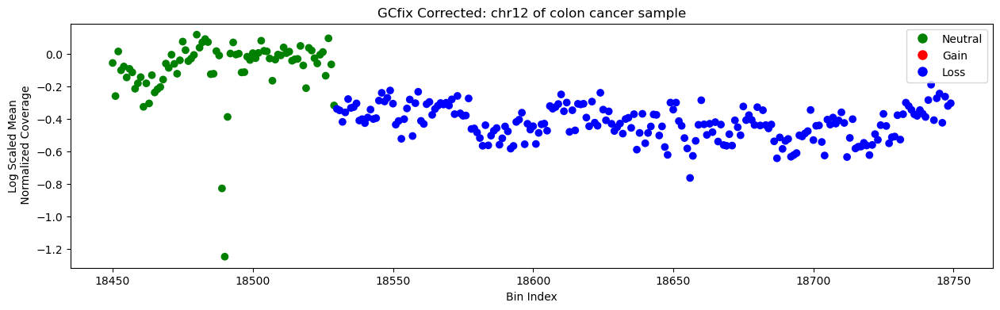

..................................................................................................................


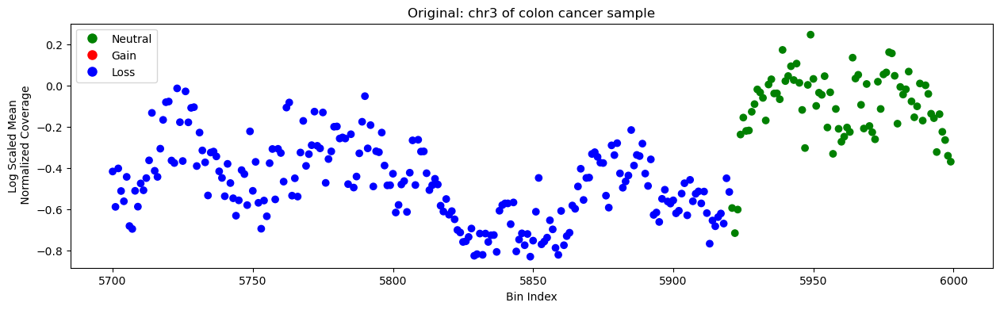

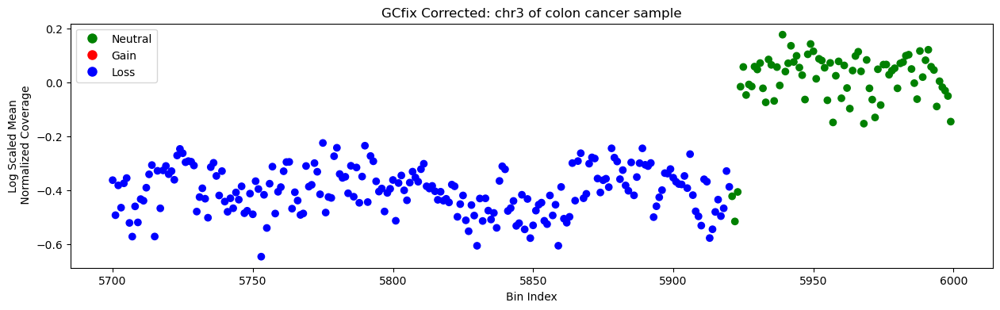

..................................................................................................................


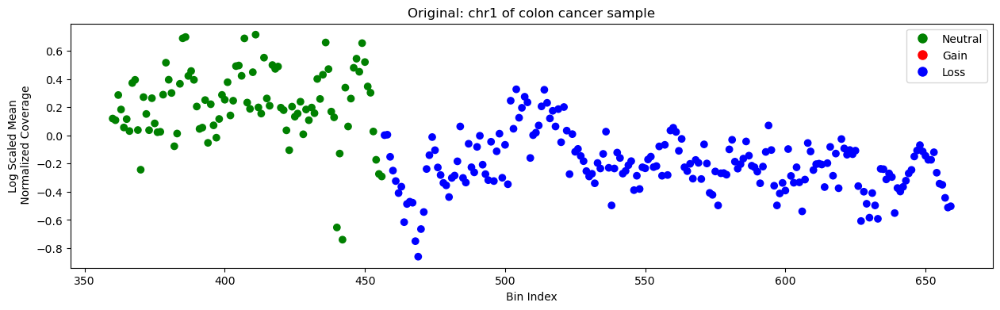

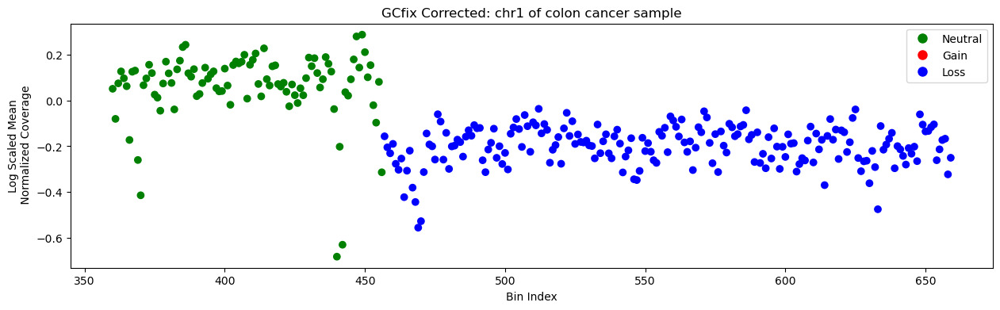

..................................................................................................................


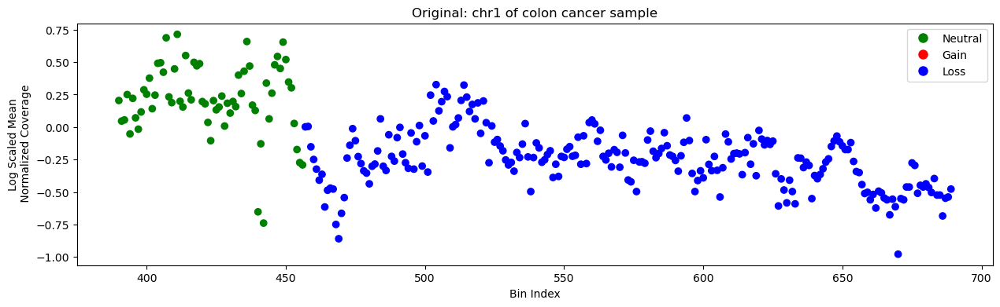

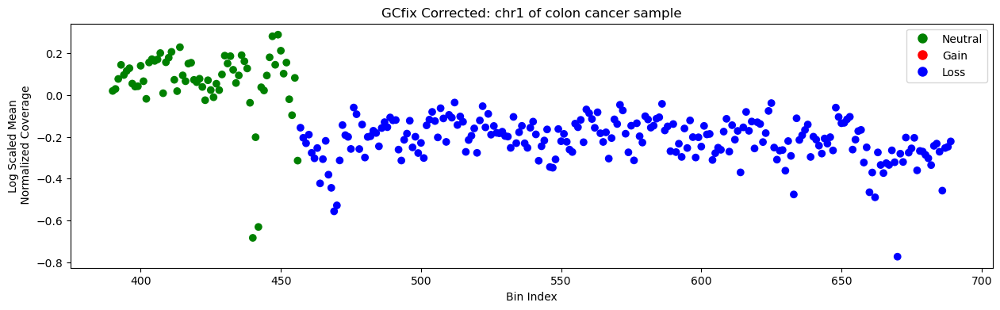

..................................................................................................................


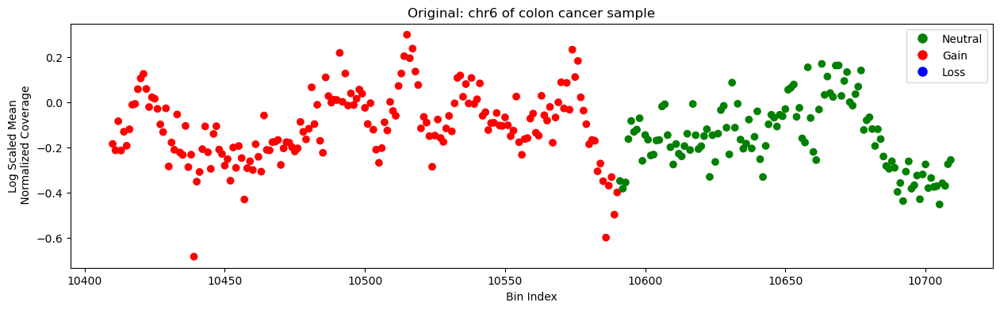

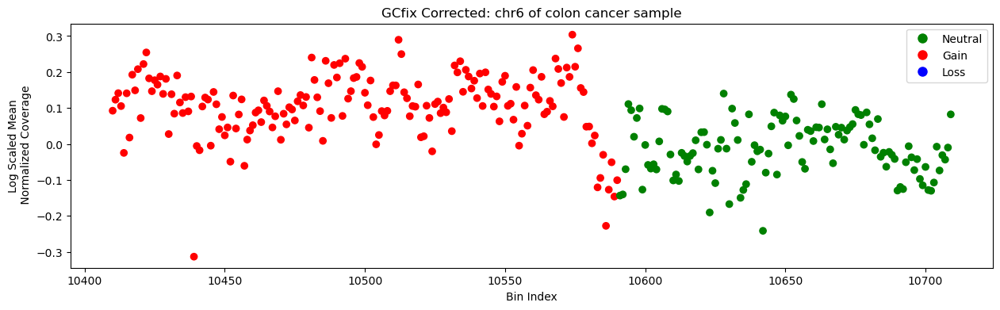

..................................................................................................................


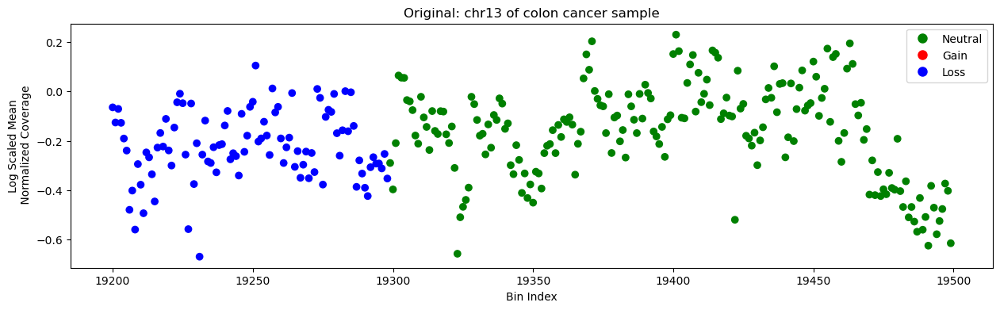

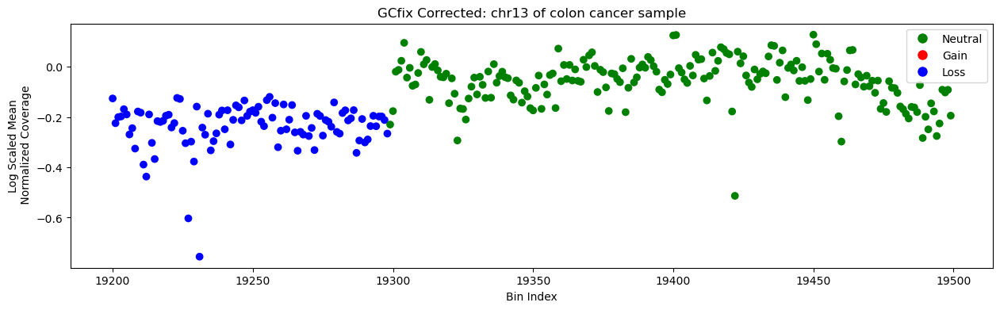

..................................................................................................................


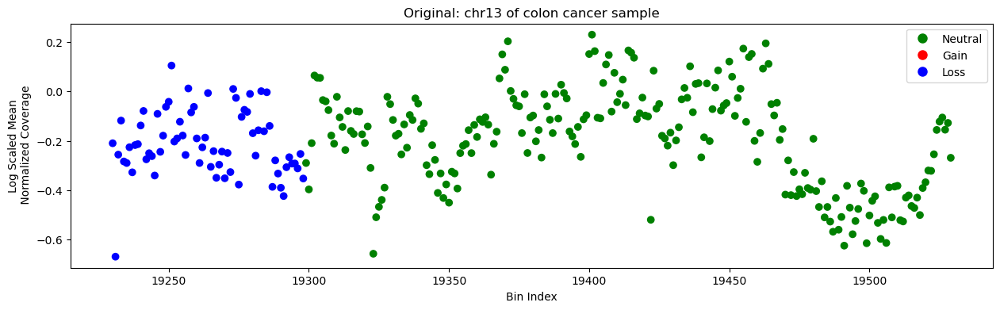

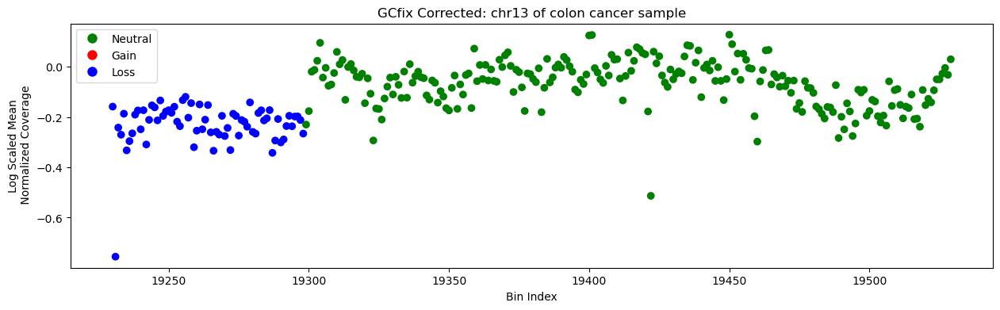

..................................................................................................................


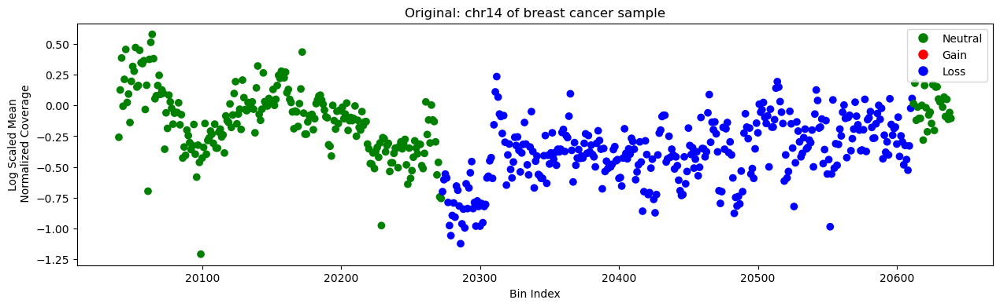

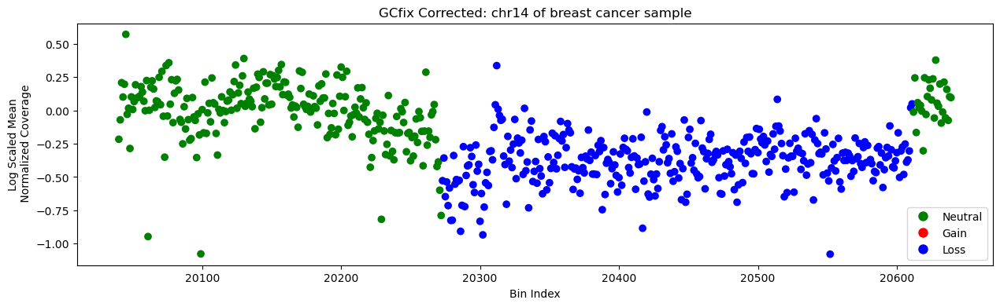

..................................................................................................................


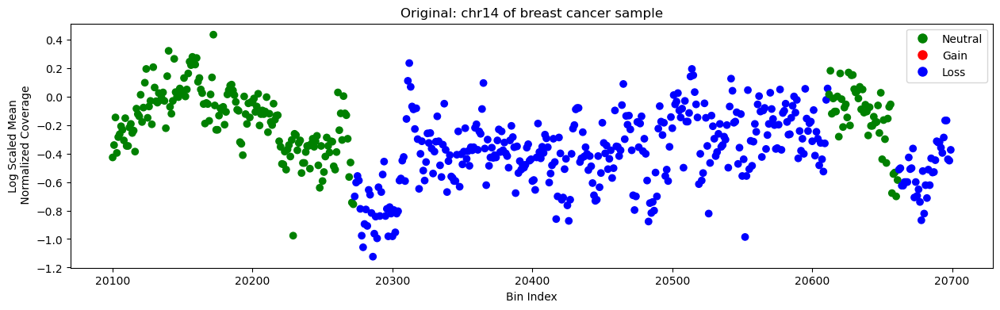

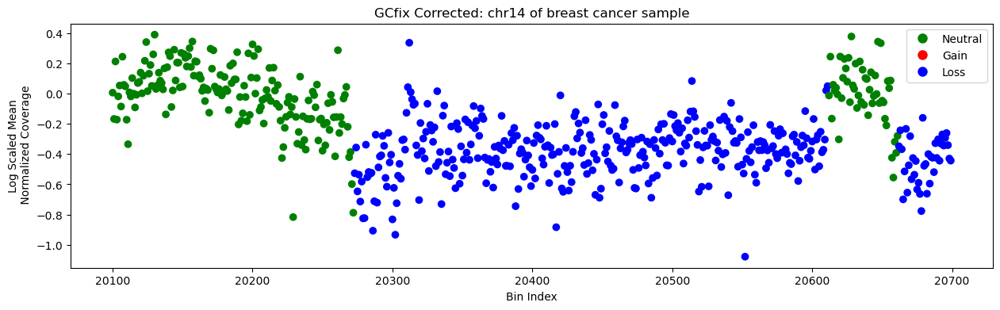

..................................................................................................................


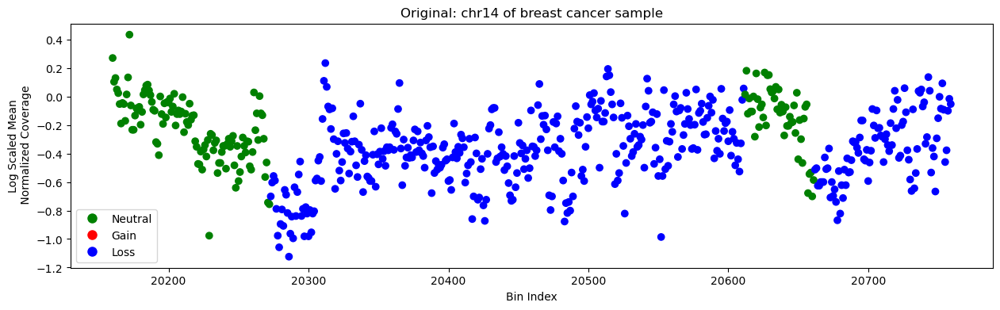

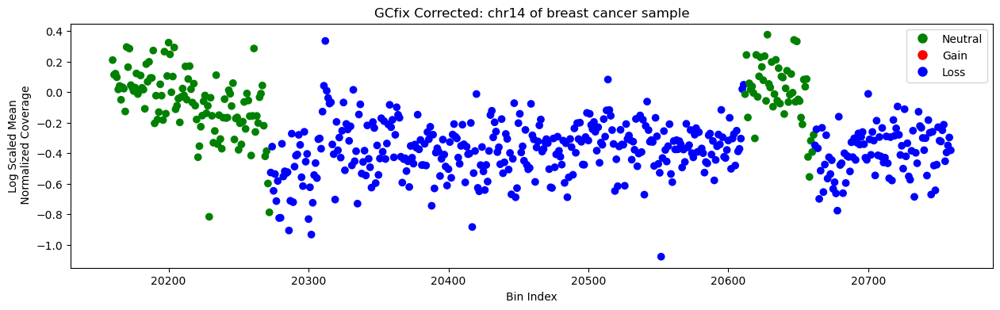

..................................................................................................................


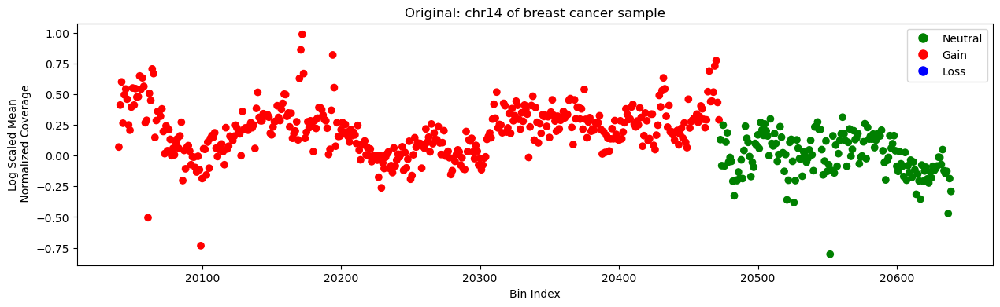

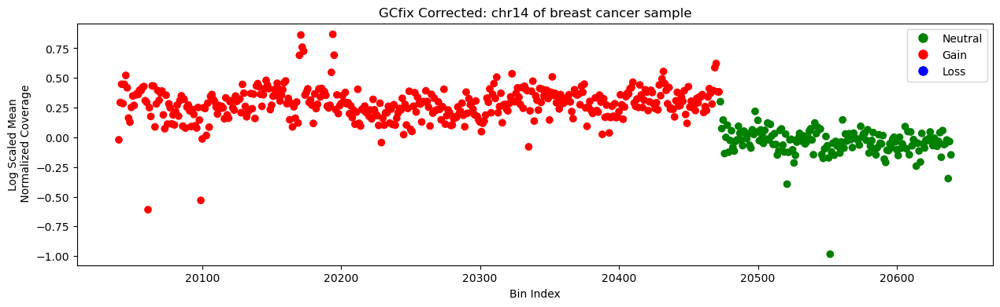

..................................................................................................................


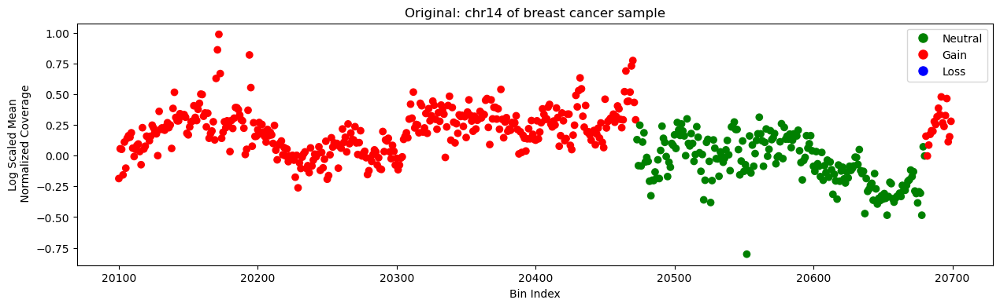

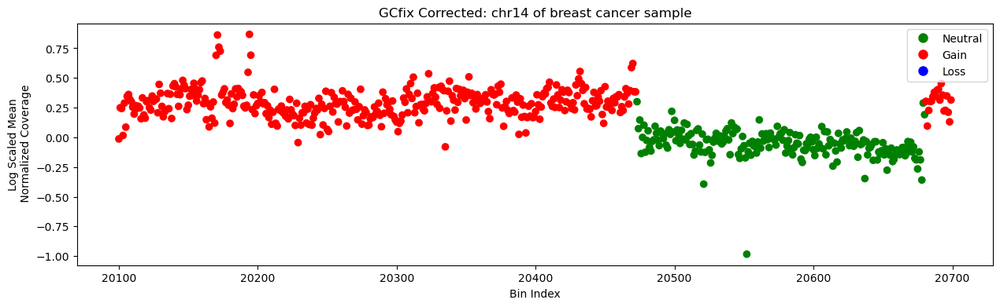

..................................................................................................................


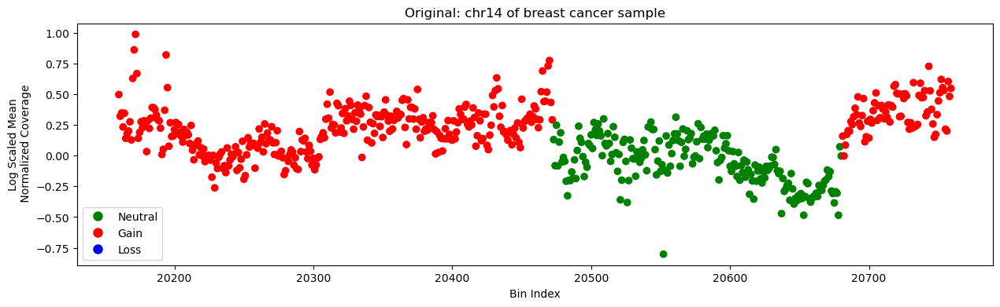

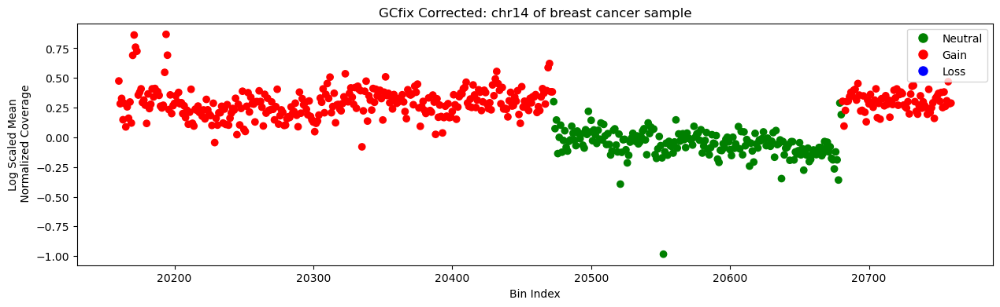

..................................................................................................................


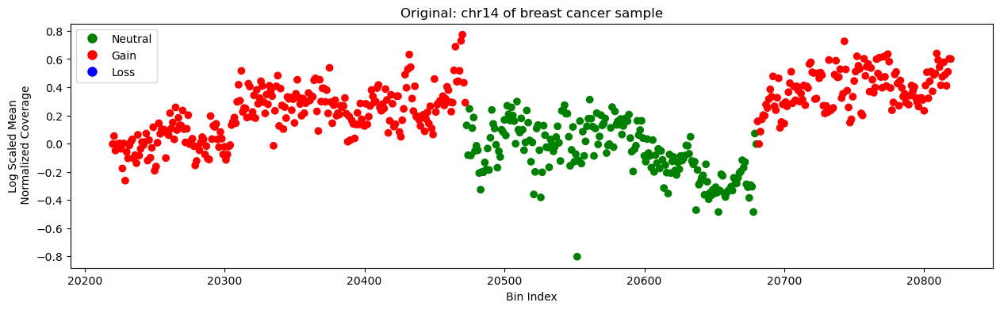

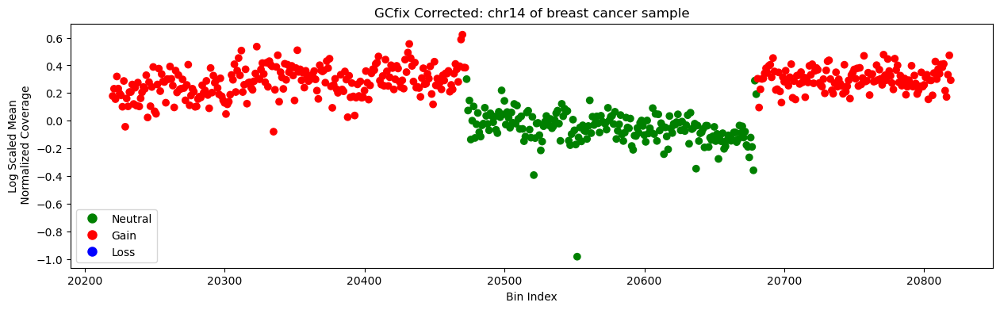

..................................................................................................................


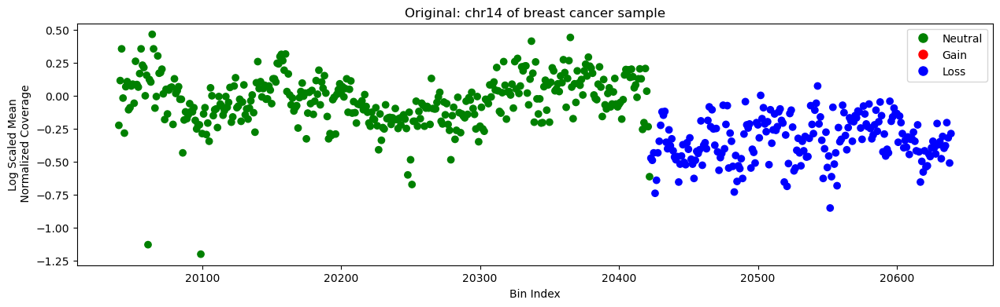

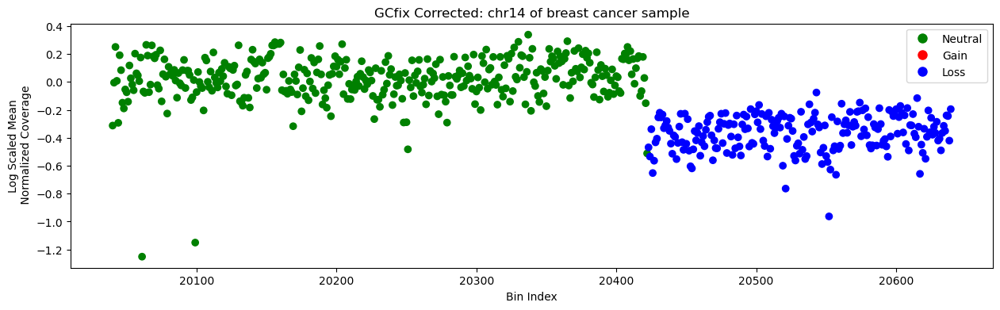

..................................................................................................................


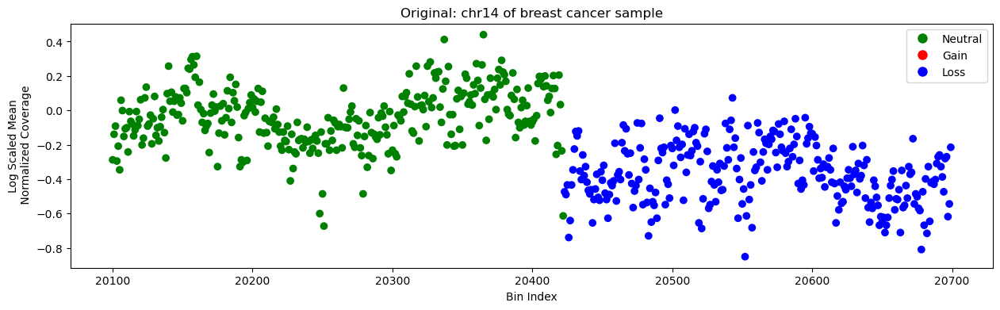

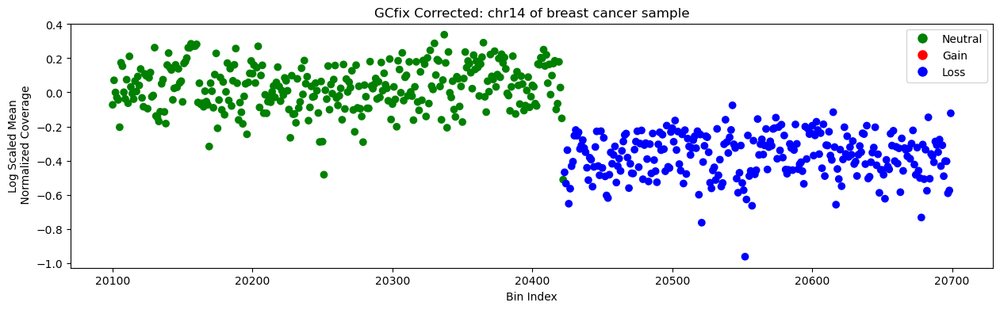

..................................................................................................................


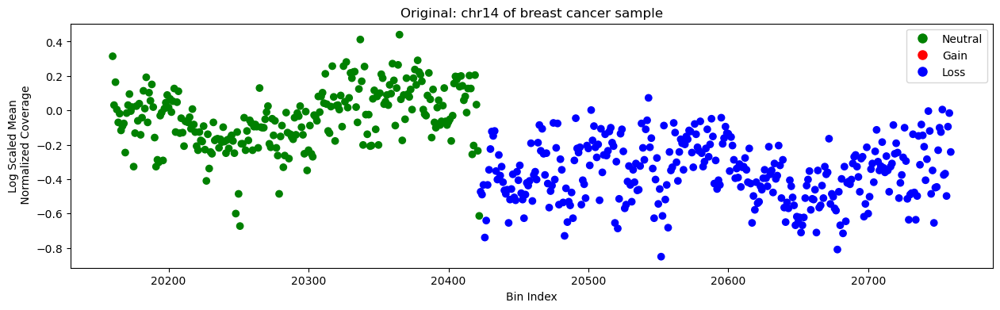

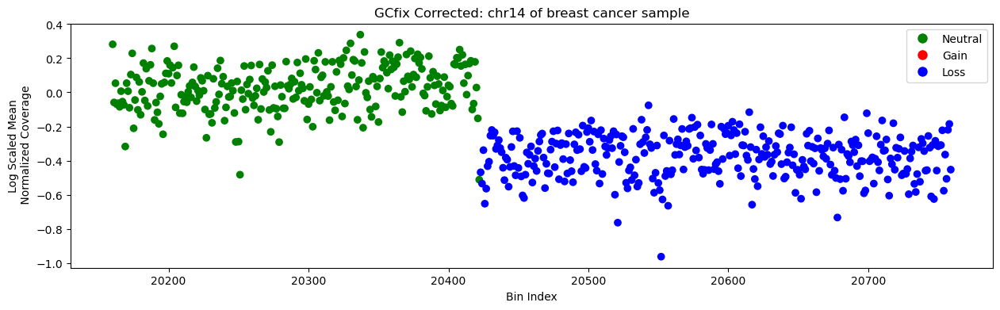

..................................................................................................................


In [16]:
# METHOD = 'GCparagon'
METHOD = 'Proposed'

count_thr = 50
crc_region_size_thr = 300
brca_region_size_thr = 600
region_size_frac_thr = 0.2
region_step_div = 10


def identify_interesting_regions(cohort, sample_name, window_size):
    bin_CNA_labels = pd.read_csv(f'{root_folder}/Bin_Label_CNA/{cohort}/{sample_name}.csv')['CNA_Label'].values.tolist()
    bin_CNA_chrs = pd.read_csv(f'{root_folder}/Bin_Label_CNA/{cohort}/{sample_name}.csv')['Contig'].values.tolist()
    interesting_windows = []
    step_size = int(window_size/region_step_div)
    thr = int(window_size * region_size_frac_thr)
    sample = np.load(f'{root_folder}/deepWGS_original_bin_coverage/Original/{cohort}/{sample_name}.npy')[:, 0]
    for i in range(0, len(bin_CNA_labels)-window_size+1, step_size):
        start, end = i, i+window_size-1
        start_chr, end_chr = bin_CNA_chrs[start], bin_CNA_chrs[end]
        min_count = np.min( sample[start : end+1] )
        if start_chr == end_chr and min_count>count_thr:
            window_CNA_labels = bin_CNA_labels[start : end+1]
            neutral_no = window_CNA_labels.count('Neutral')
            gain_no = window_CNA_labels.count('Gain')
            loss_no = window_CNA_labels.count('Loss')
            nan_no = window_size - (neutral_no + gain_no + loss_no)
            if nan_no==0 and ( (neutral_no>thr and gain_no>thr) or (neutral_no>thr and loss_no>thr) ):
                interesting_windows.append([cohort, sample_name, start_chr, start, end])
    return interesting_windows

def view_interesting_regions(cohort, window_size):
    files = os.listdir(f'{root_folder}/Bin_Label_CNA/{cohort}/')
    sample_names = [file_[:-4] for file_ in files]
    interesting_region_list = []
    for sample in sample_names:
        interesting_region_list.extend( identify_interesting_regions(cohort, sample, window_size) )
    if len(interesting_region_list)>10:
        interesting_region_list = interesting_region_list[:10]
    return interesting_region_list

def get_normalized_cov(coverage):
    mean_cov = np.mean(coverage)
    norm_cov = np.log2(coverage/mean_cov + 0.0001)
    return norm_cov

def get_plot(title, bin_coverages, bin_labels, start):
    X, Y, labels = [], [], []
    for i in range(len(bin_labels)):
        X.append(start)
        Y.append(bin_coverages[i])
        labels.append(bin_labels[i])
        start += 1
    colors = {'Neutral': 'green', 'Gain': 'red', 'Loss': 'blue'}
    c = [colors[label] for label in labels]

    plt.figure(figsize=(15, 4))
    scatter = plt.scatter(X, Y, c=c, label=labels)
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
               for label, color in colors.items()]
    plt.legend(handles=handles)
    plt.title(title)
    plt.xlabel('Bin Index')
    plt.ylabel('Log Scaled Mean\n Normalized Coverage')
    plt.show()

def plot_CNA(region):
    cohort, sample_name, contig, start_bin, end_bin = region[0], region[1], region[2], region[3], region[4]
    bin_CNA_labels = pd.read_csv(f'{root_folder}/Bin_Label_CNA/{cohort}/{sample_name}.csv')['CNA_Label'].values.tolist()
    original_file = f'{root_folder}/deepWGS_original_bin_coverage/Original/{cohort}/{sample_name}.npy'
    corrected_file = f'{root_folder}/deepWGS_original_bin_coverage/{METHOD}_Corrected/{cohort}/{sample_name}.npy'
    original_cov = get_normalized_cov( np.load(original_file)[:, 0] )[start_bin: end_bin+1]
    corrected_cov = get_normalized_cov( np.load(corrected_file)[:, 0] )[start_bin: end_bin+1]
    region_CNA_labels = bin_CNA_labels[start_bin: end_bin+1]
    sample_name = 'colon cancer sample' if cohort=='CRC_gis' else 'breast cancer sample'
    get_plot(f'Original: {contig} of {sample_name}', original_cov, region_CNA_labels, start_bin)
    get_plot(f'GCfix Corrected: {contig} of {sample_name}', corrected_cov, region_CNA_labels, start_bin)
    print('..................................................................................................................')

interesting_region_list = []
interesting_region_list.extend( view_interesting_regions('CRC_gis', crc_region_size_thr) )
interesting_region_list.extend( view_interesting_regions('BRCA_gis', brca_region_size_thr) )
for region in interesting_region_list:
    plot_CNA(region)

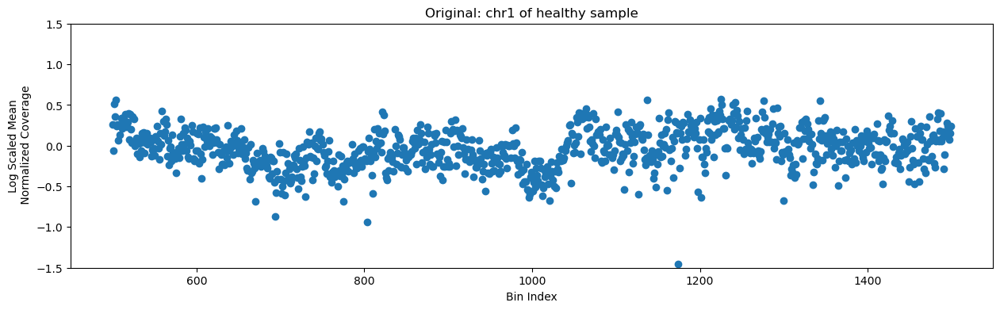

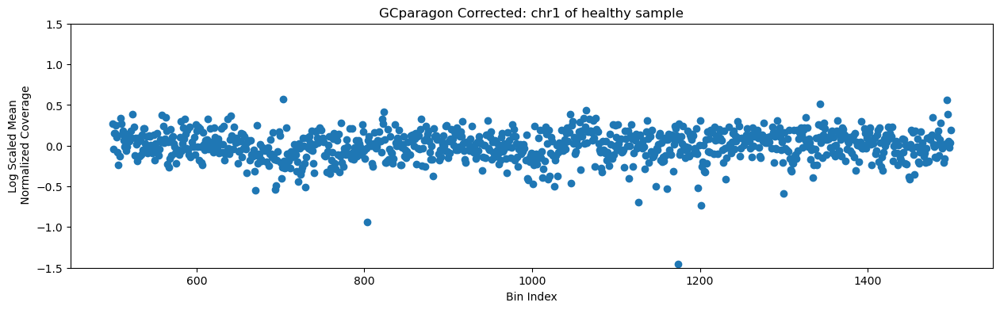

..................................................................................................................


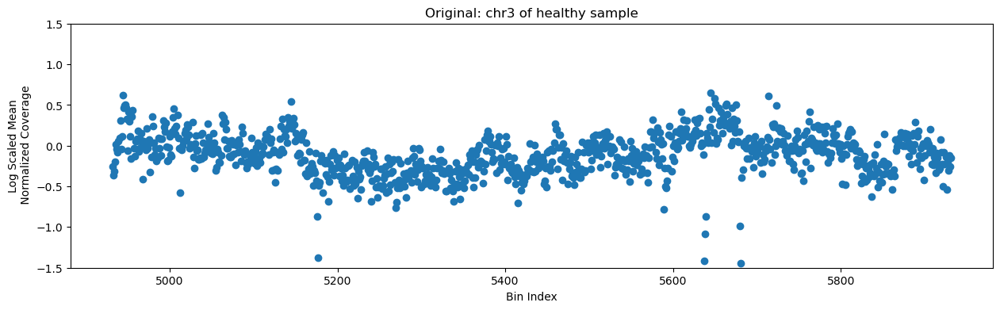

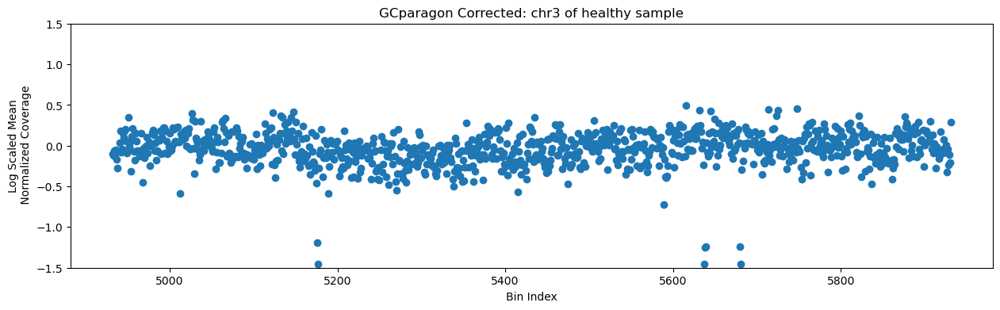

..................................................................................................................


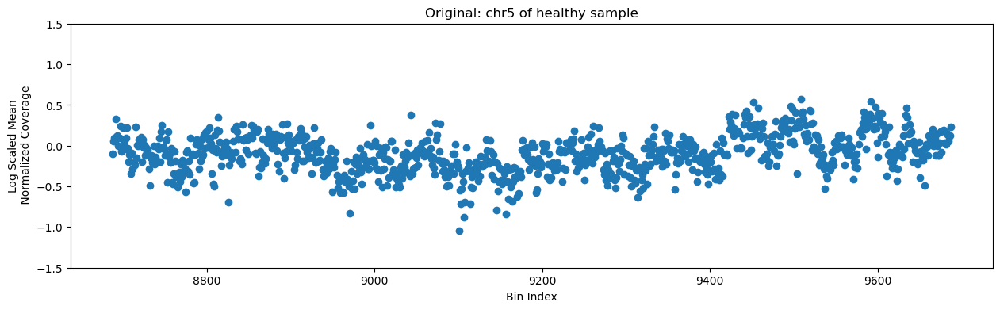

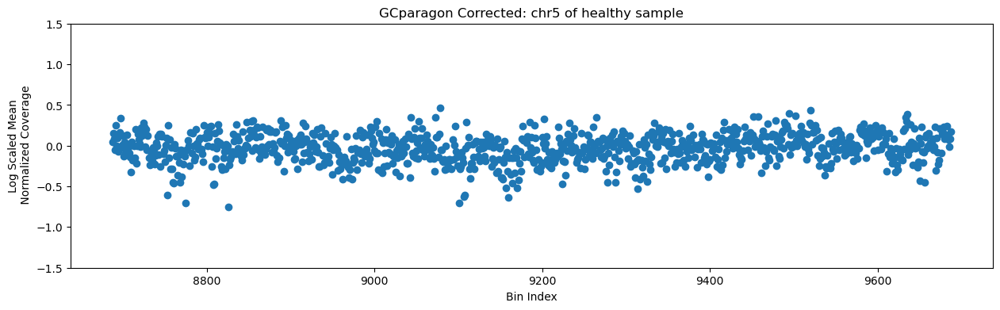

..................................................................................................................


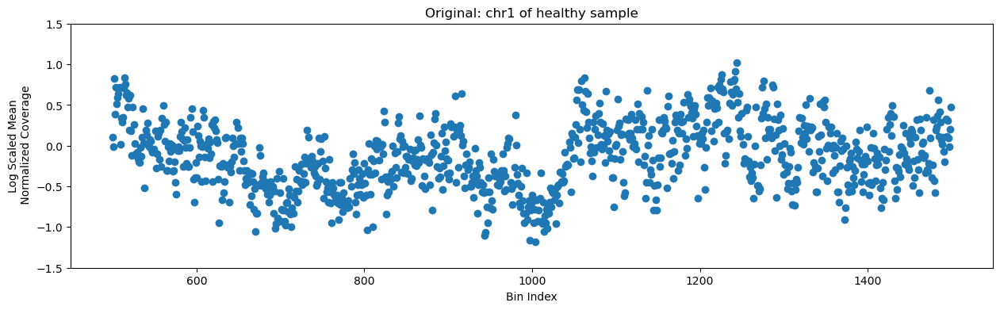

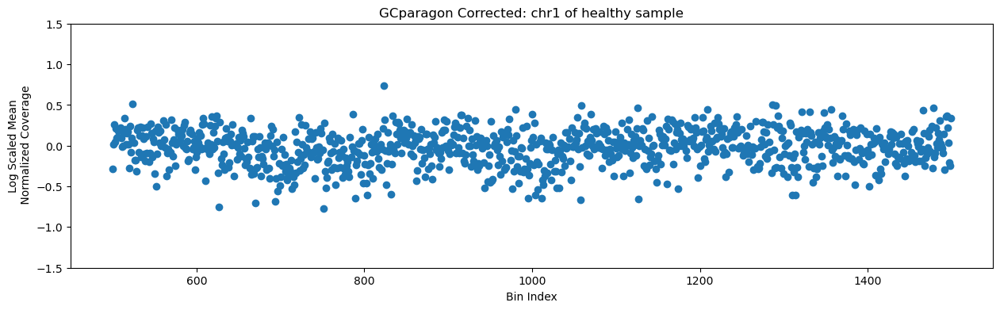

..................................................................................................................


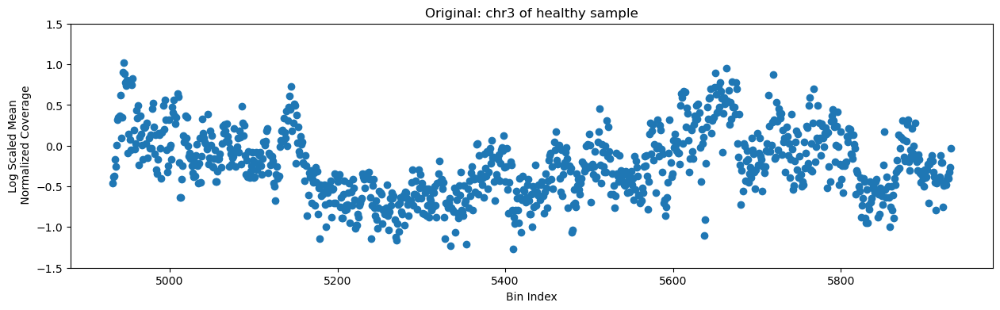

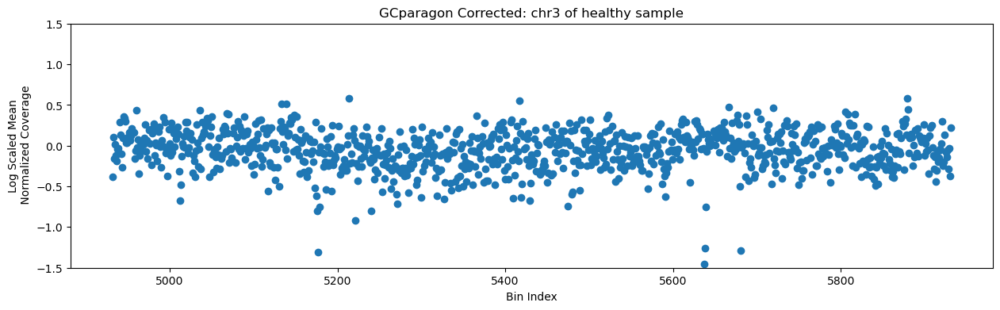

..................................................................................................................


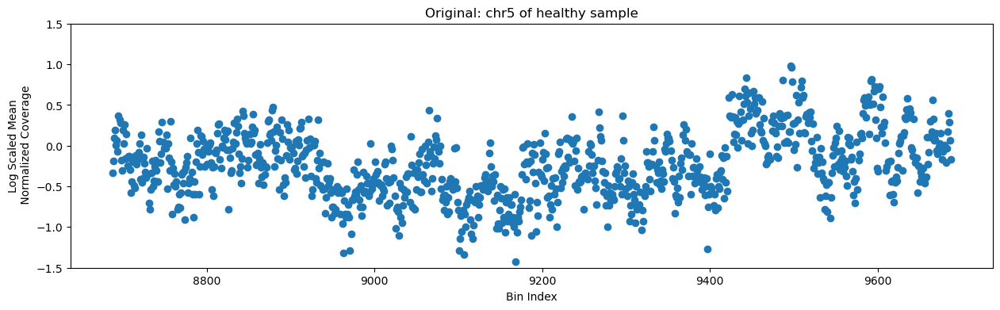

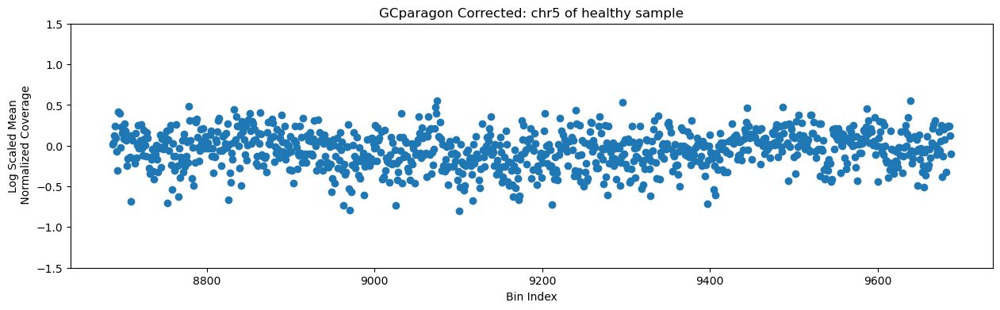

..................................................................................................................


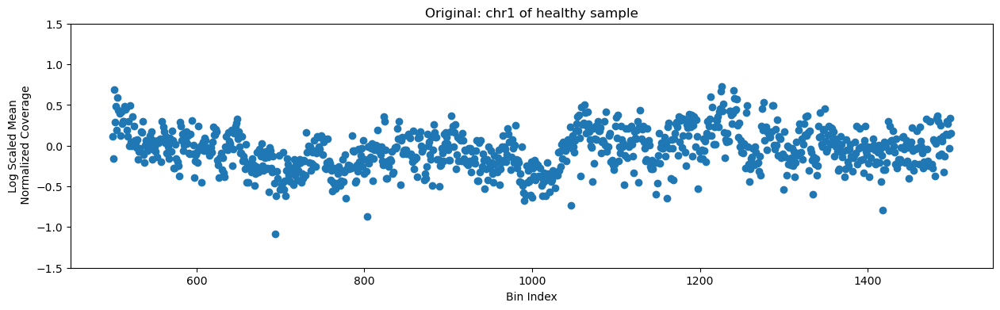

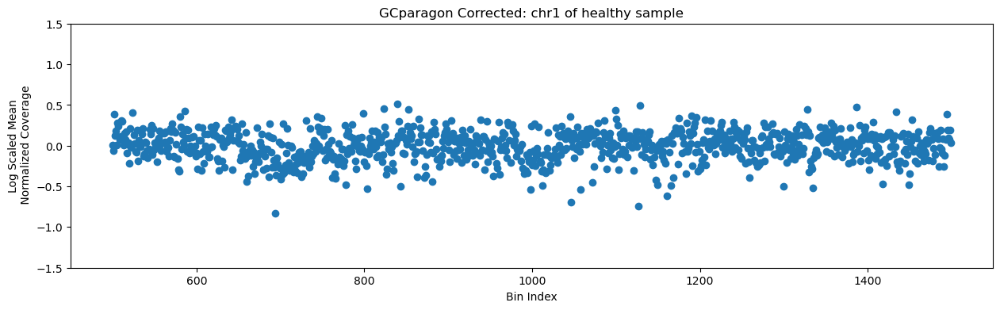

..................................................................................................................


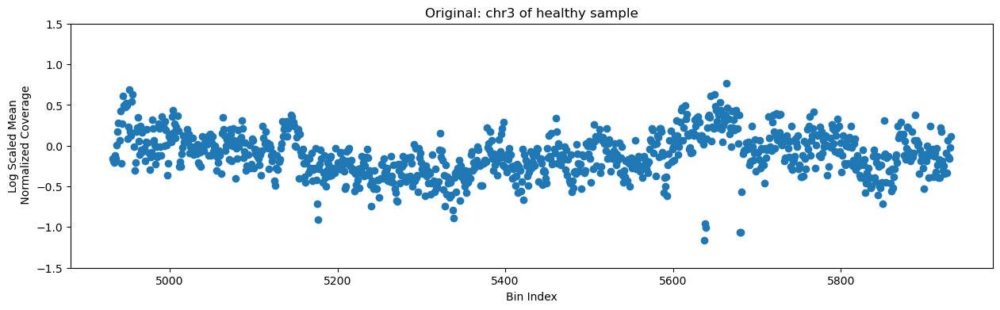

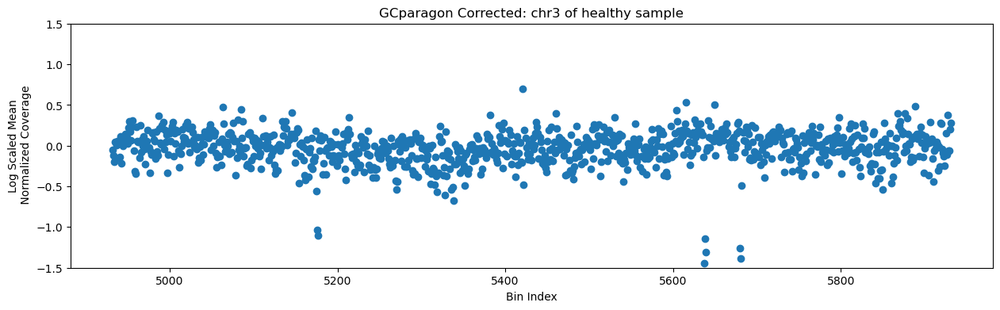

..................................................................................................................


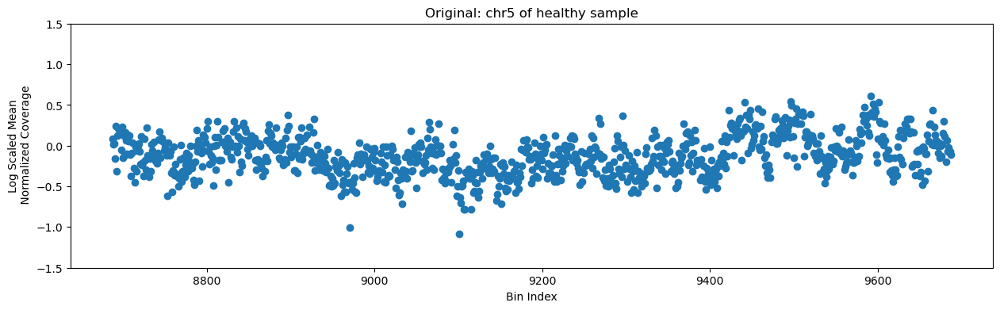

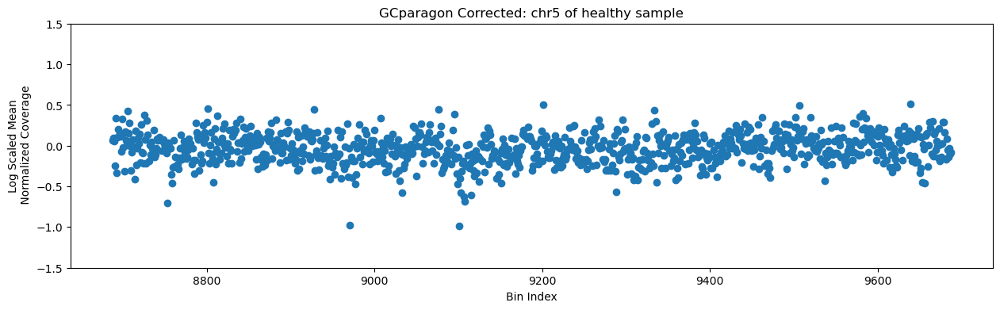

..................................................................................................................


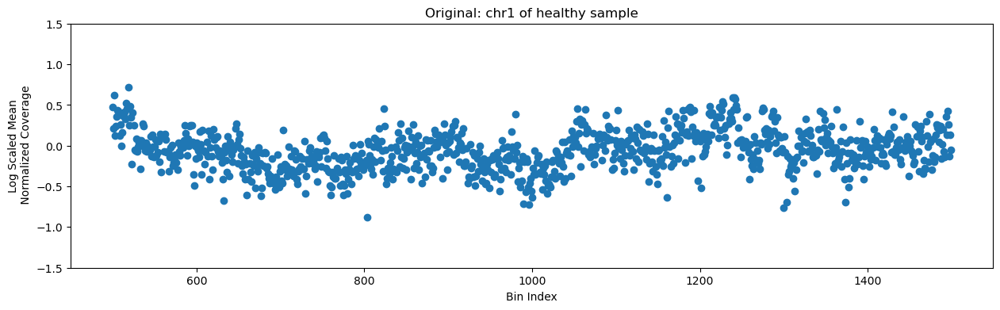

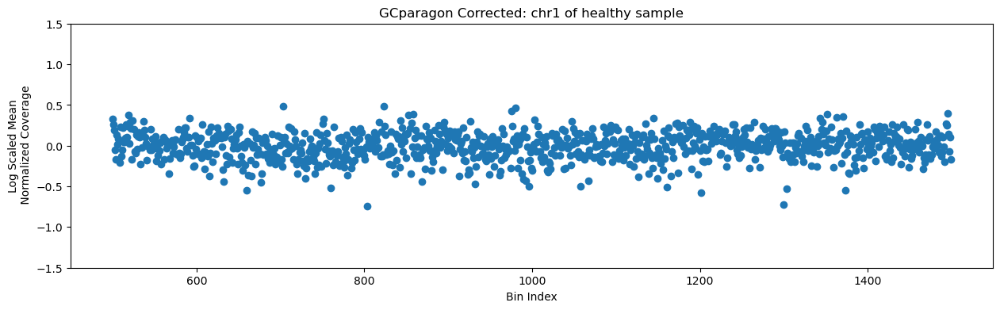

..................................................................................................................


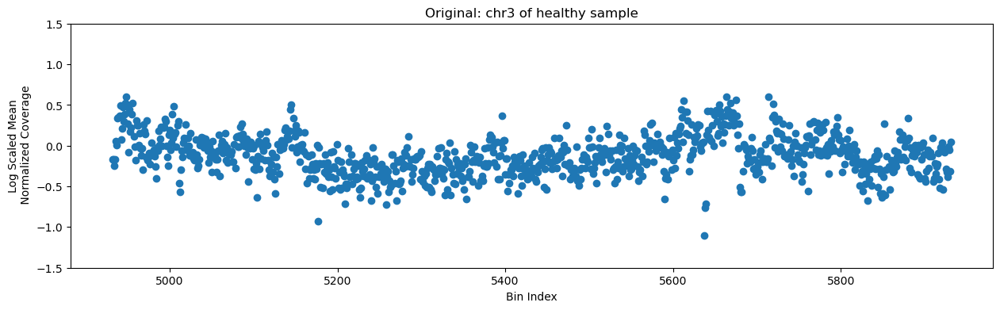

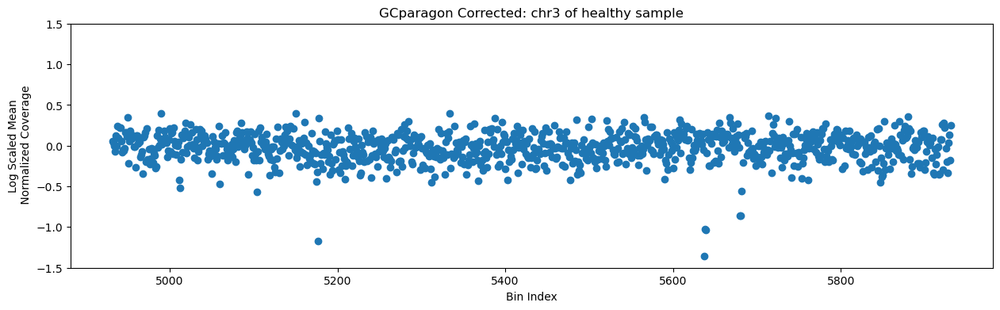

..................................................................................................................


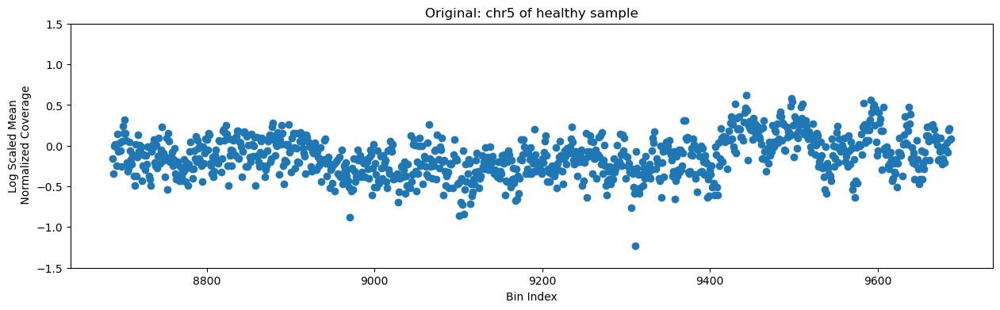

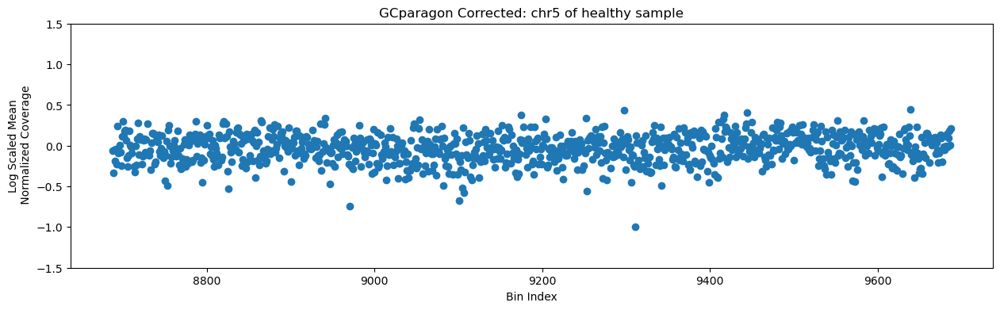

..................................................................................................................


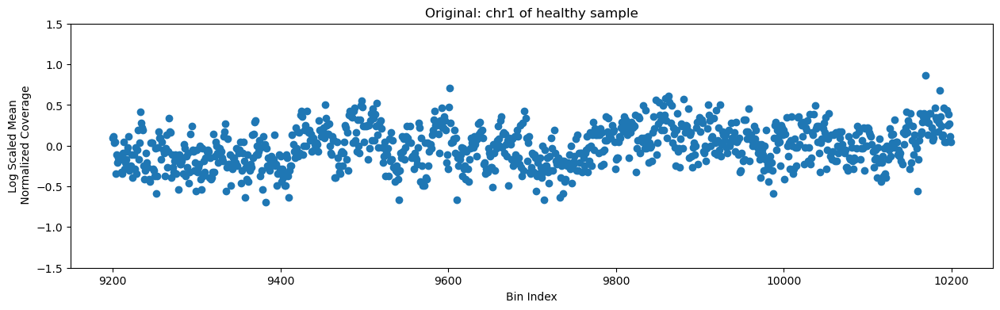

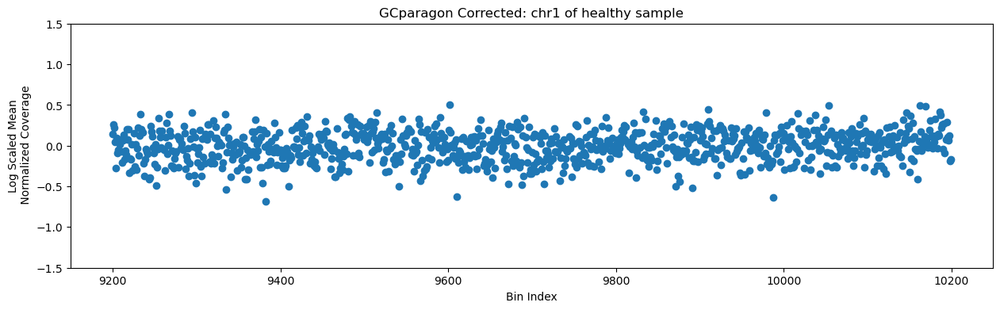

..................................................................................................................


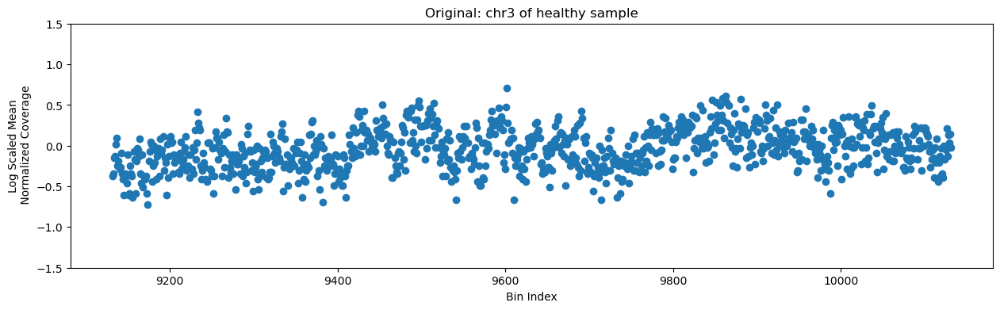

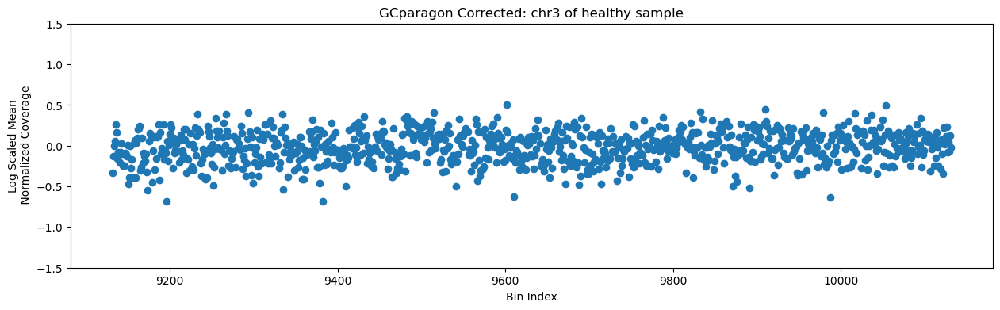

..................................................................................................................


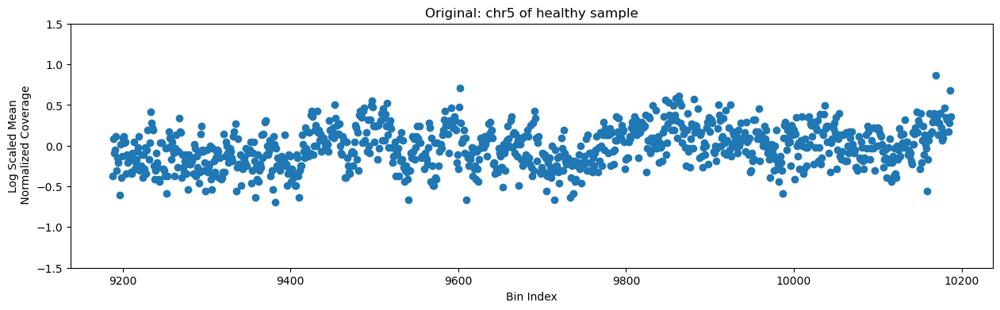

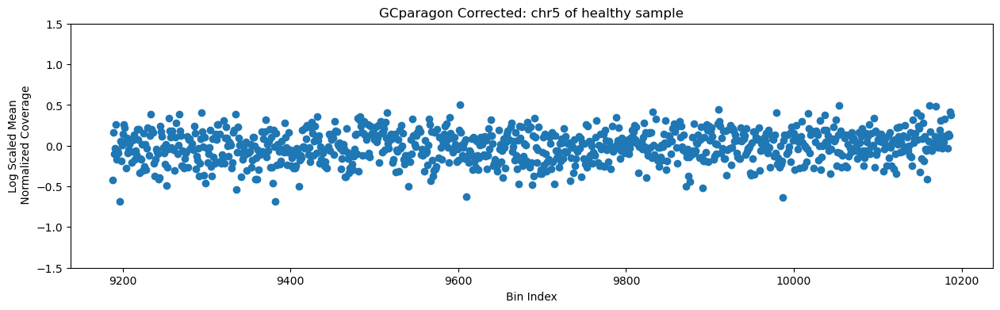

..................................................................................................................


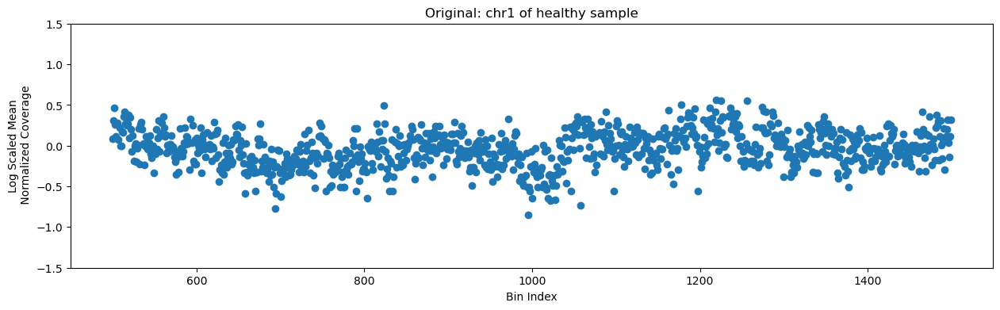

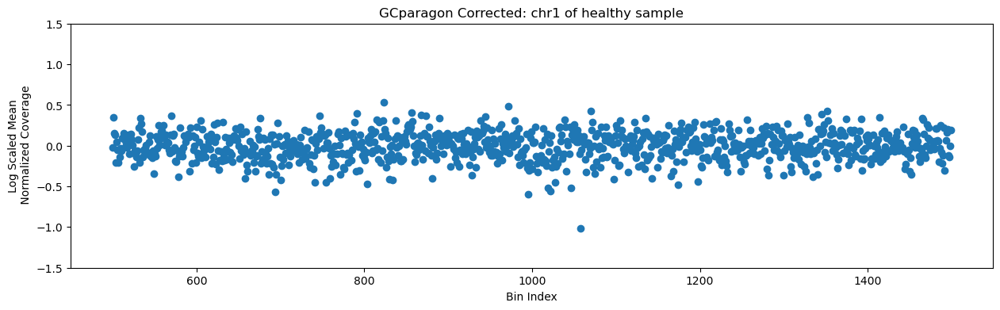

..................................................................................................................


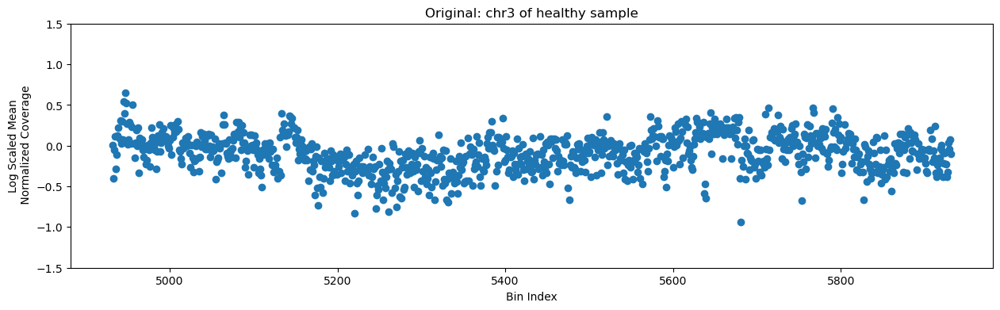

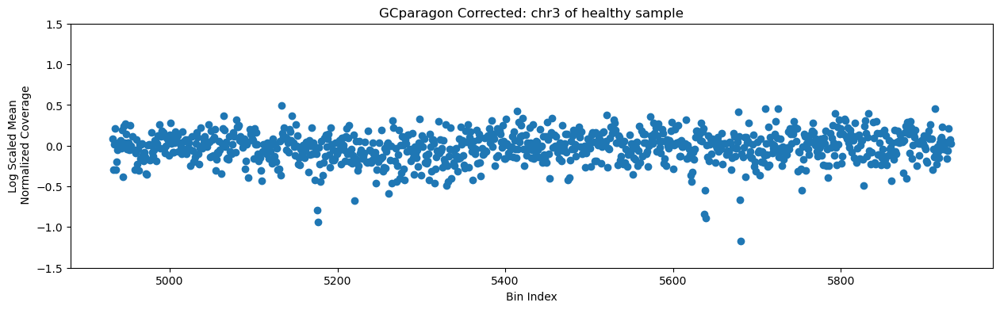

..................................................................................................................


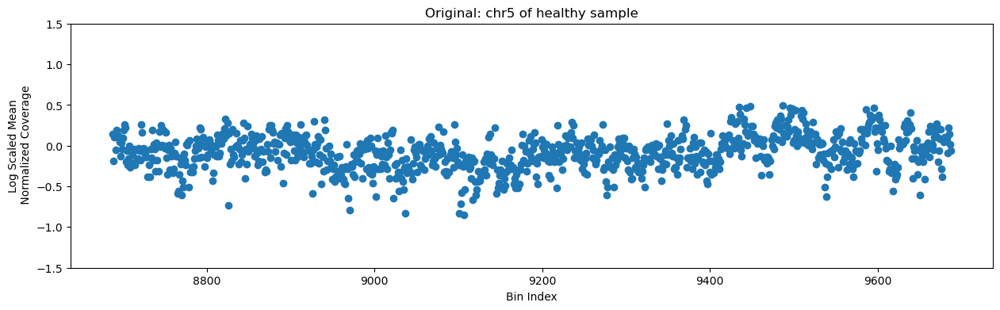

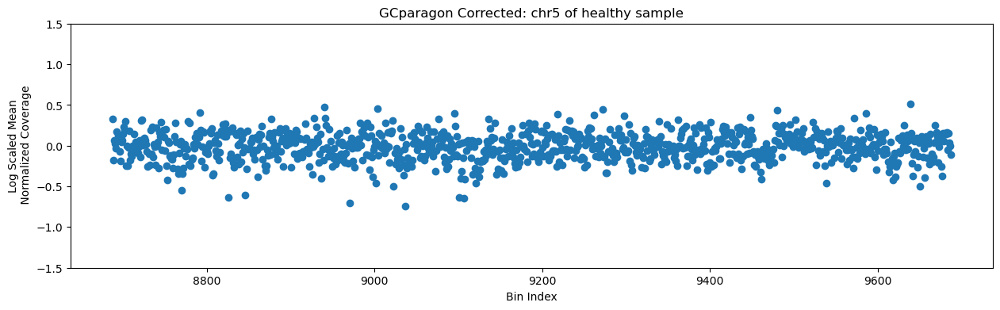

..................................................................................................................


In [19]:
# METHOD = 'GCparagon'
METHOD = 'Proposed'

bin_locations = pd.read_csv(f'{root_folder}/Bin_Label_CNA/100Kb.csv').values.tolist()
window_size = 1000
start_offset = 500
window_size_frac_thr = 0.1
count_thr = 50


def find_region(contig, sample):
    step_size = int(window_size * window_size_frac_thr)
    start = None
    for i in range(len(bin_locations)):
        if bin_locations[i][0]==contig:
            start = i + start_offset
            break
    for i in range(start, sample.shape[0], step_size):
        min_total_count = np.min( sample[i: i+window_size] )
        if min_total_count>count_thr:
            start = i
            end = i+window_size-1
            return start, end

def identify_interesting_regions(cohort, sample_name):
    contigs = ['chr1', 'chr3', 'chr5']
    sample = np.load(f'{root_folder}/deepWGS_original_bin_coverage/Original/{cohort}/{sample_name}.npy')[:, 0]
    interesting_windows = []
    for contig in contigs:
        start, end = find_region(contig, sample)
        interesting_windows.append([cohort, sample_name, contig, start, end])
    return interesting_windows

def view_interesting_regions(cohort):
    files = os.listdir(f'{root_folder}/deepWGS_original_bin_coverage/Original/{cohort}/')
    sample_names = [file_[:-4] for file_ in files[:3]]
    interesting_region_list = []
    for sample in sample_names:
        interesting_region_list.extend( identify_interesting_regions(cohort, sample) )
    return interesting_region_list

def get_normalized_cov(coverage):
    mean_cov = np.mean(coverage)
    norm_cov = np.log2(coverage/mean_cov + 0.0001)
    norm_cov[norm_cov > 1.45] = 1.45
    norm_cov[norm_cov < -1.45] = -1.45
    return norm_cov

def get_plot(title, bin_coverages, start, end):
    X, Y = [], []
    for i in range(start, end+1):
        X.append(i)
        Y.append(bin_coverages[i-start])
    plt.figure(figsize=(15, 4))
    scatter = plt.scatter(X, Y)
    plt.title(title)
    plt.xlabel('Bin Index')
    plt.ylabel('Log Scaled Mean\n Normalized Coverage')
    plt.ylim([-1.5, 1.5])
    plt.show()

def plot_CNA(region):
    cohort, sample_name, contig, start_bin, end_bin = region[0], region[1], region[2], region[3], region[4]
    original_file = f'{root_folder}/deepWGS_original_bin_coverage/Original/{cohort}/{sample_name}.npy'
    corrected_file = f'{root_folder}/deepWGS_original_bin_coverage/{METHOD}_Corrected/{cohort}/{sample_name}.npy'
    original_cov = get_normalized_cov( np.load(original_file)[:, 0] )[start_bin: end_bin+1]
    corrected_cov = get_normalized_cov( np.load(corrected_file)[:, 0] )[start_bin: end_bin+1]
    get_plot(f'Original: {contig} of healthy sample', original_cov, start_bin, end_bin)
    get_plot(f'GCparagon Corrected: {contig} of healthy sample', corrected_cov, start_bin, end_bin)
    print('..................................................................................................................')

interesting_region_list = []
interesting_region_list.extend( view_interesting_regions('healthy_c2i') )
interesting_region_list.extend( view_interesting_regions('healthy_invitro') )
for region in interesting_region_list:
    plot_CNA(region)

# Suppl Fig 13

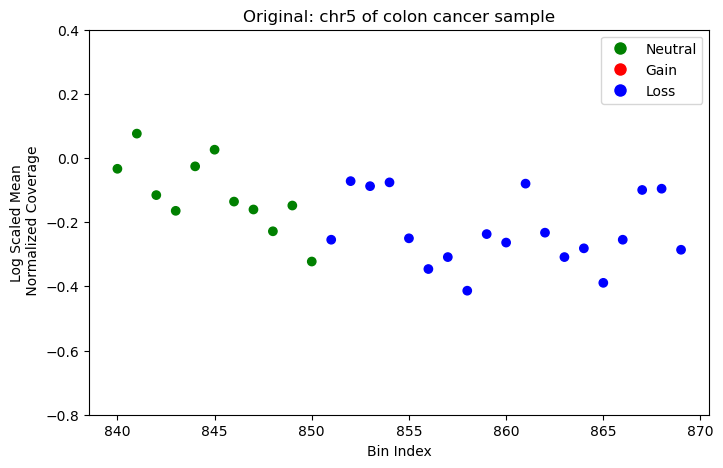

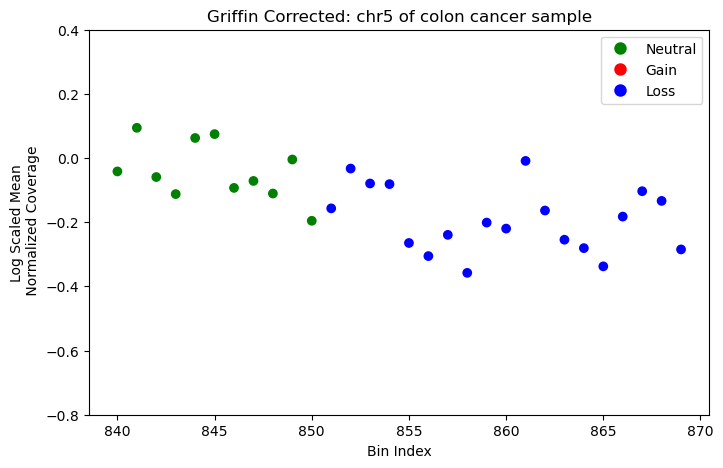

..................................................................................................................


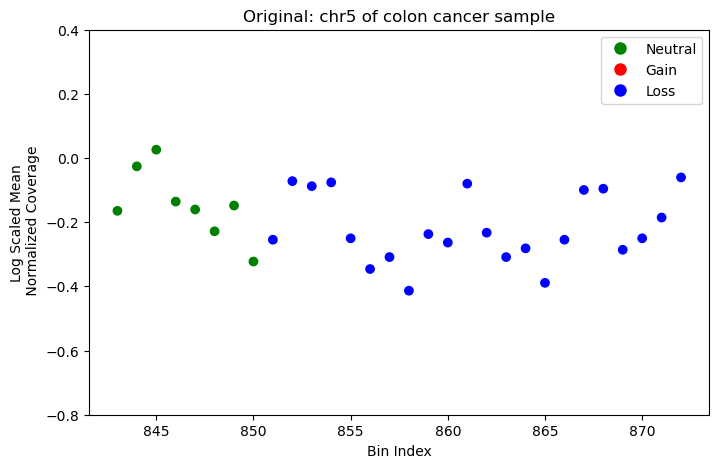

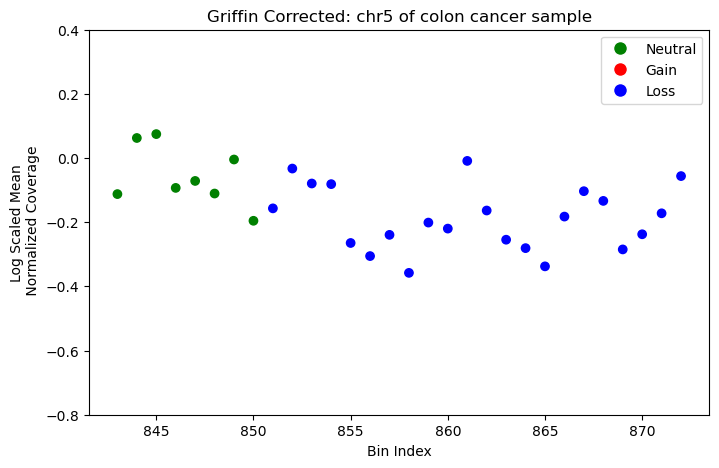

..................................................................................................................


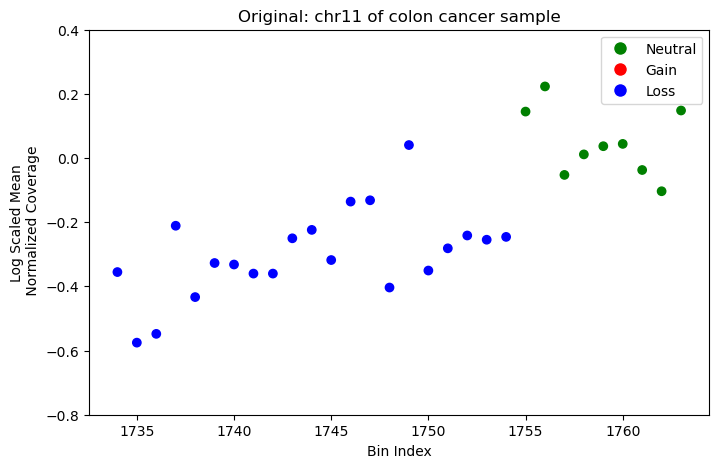

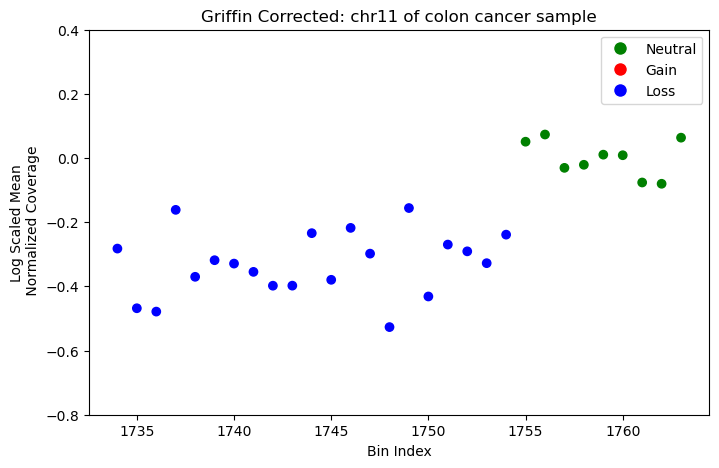

..................................................................................................................


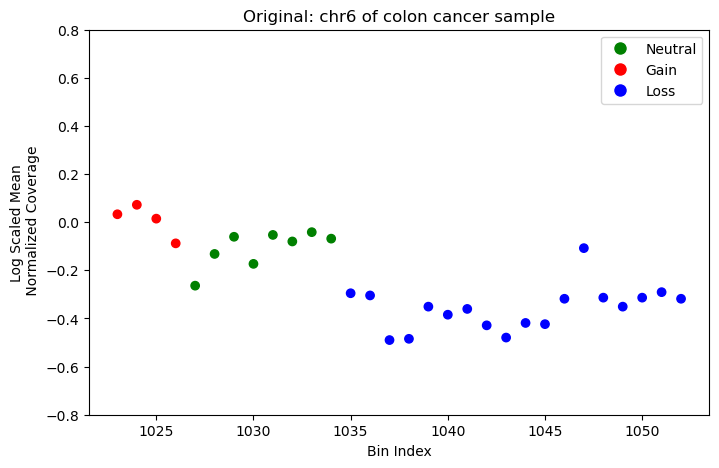

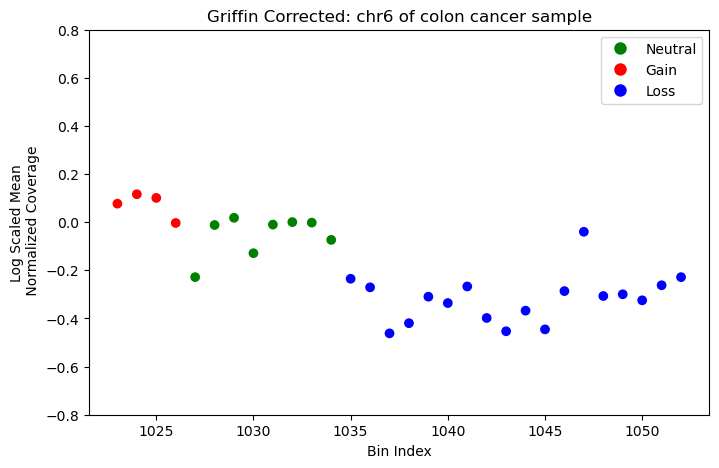

..................................................................................................................


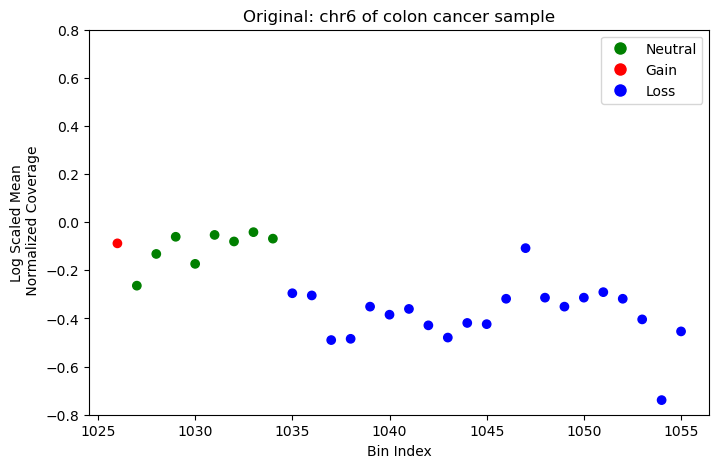

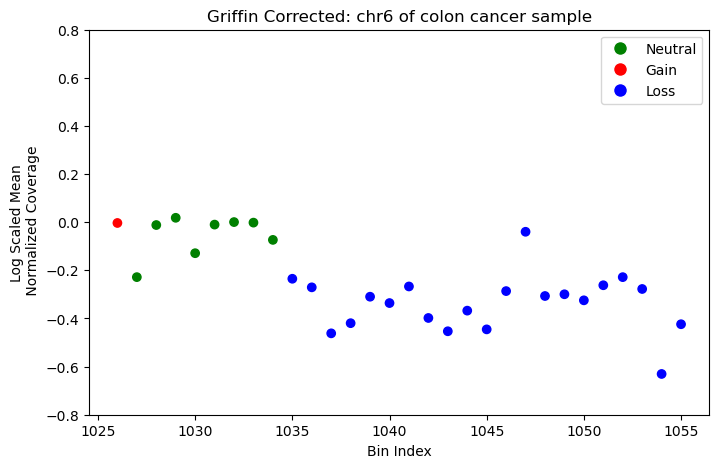

..................................................................................................................


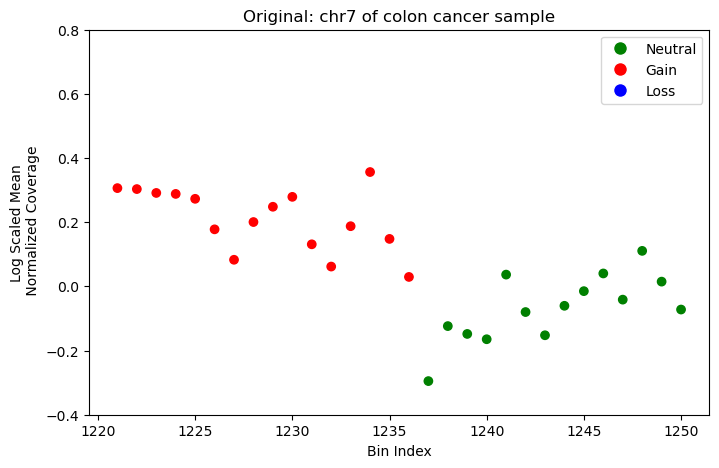

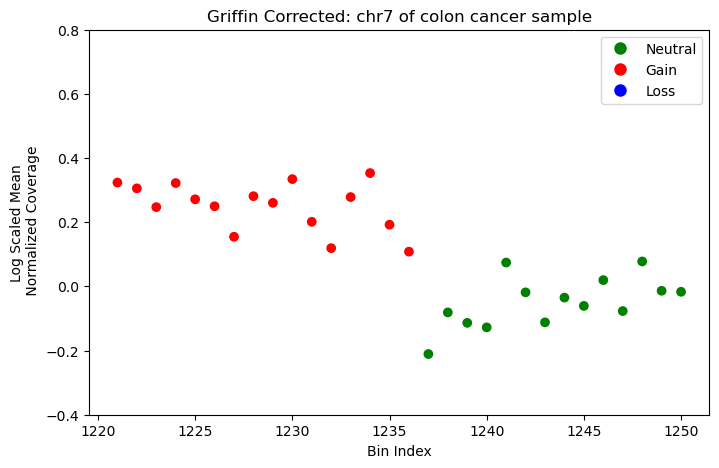

..................................................................................................................


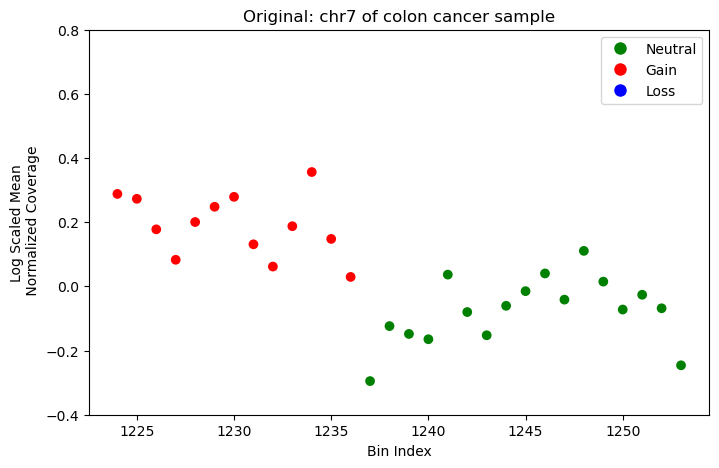

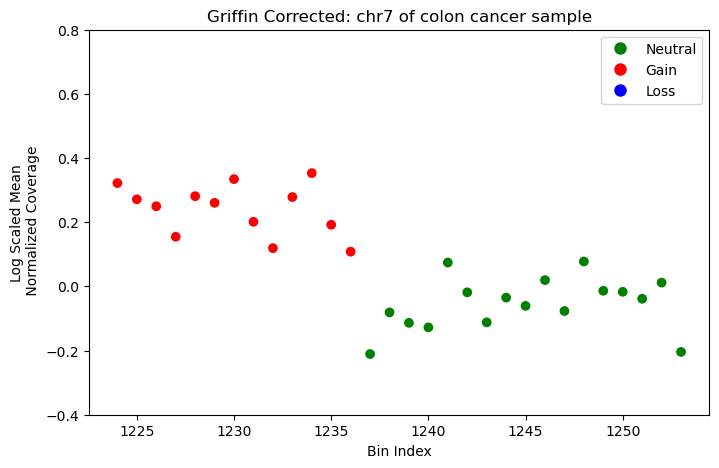

..................................................................................................................


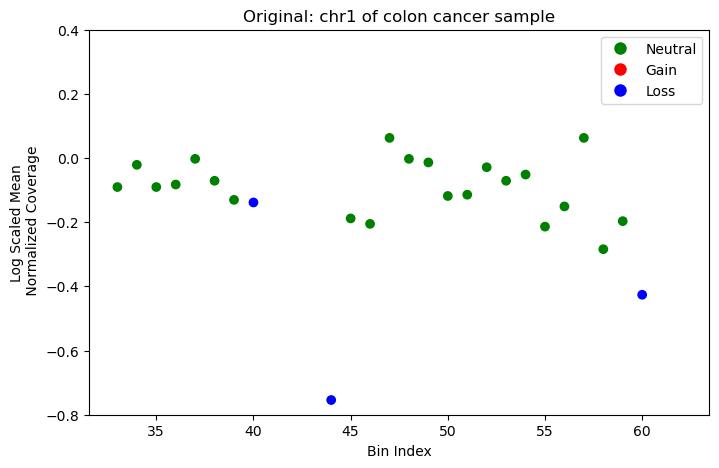

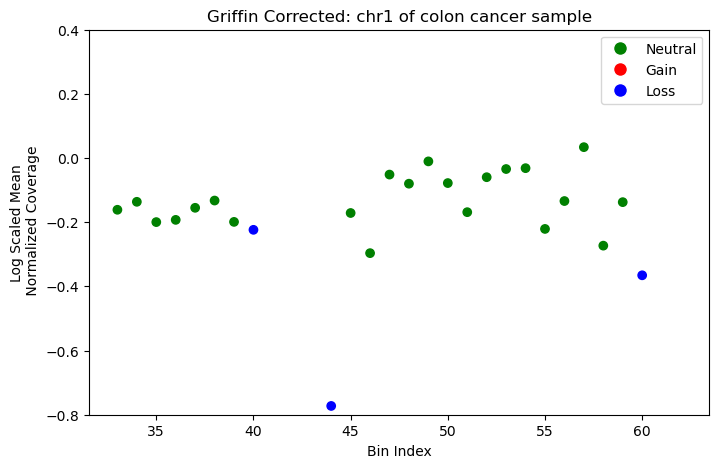

..................................................................................................................


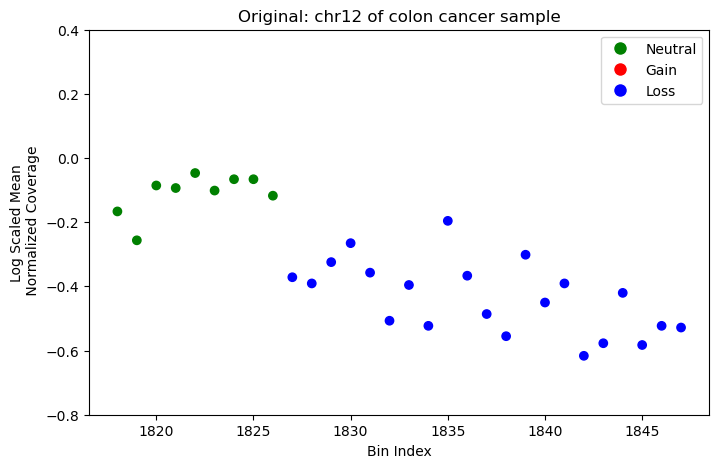

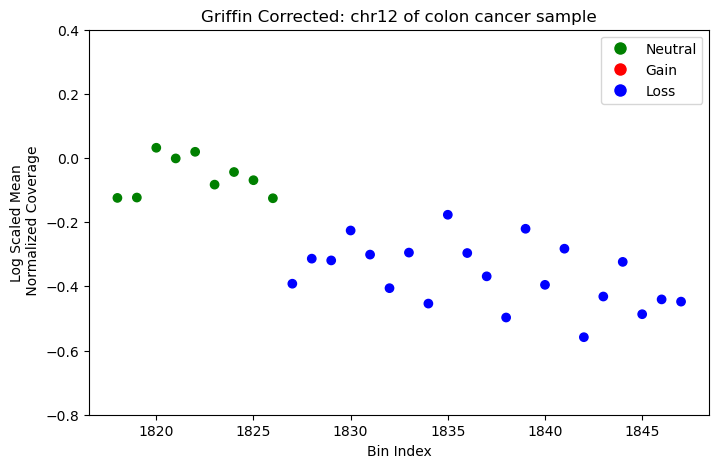

..................................................................................................................


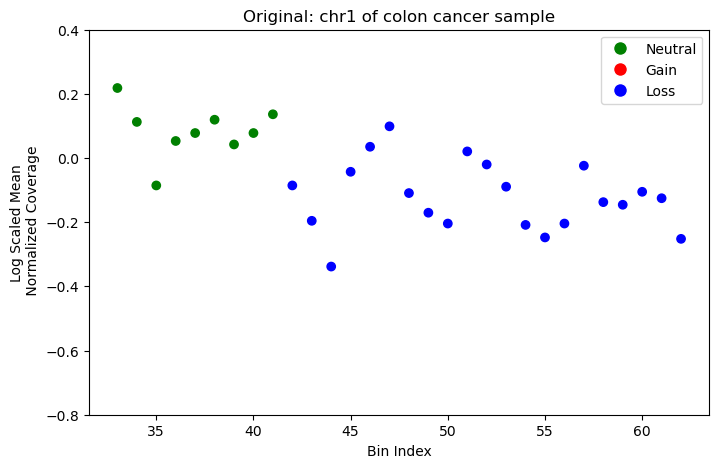

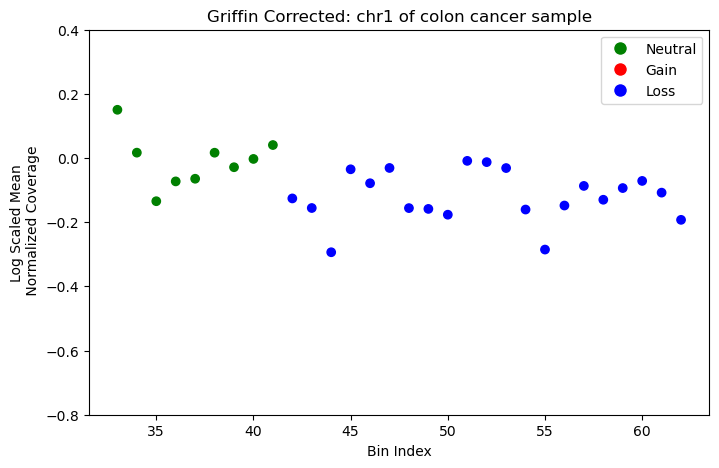

..................................................................................................................


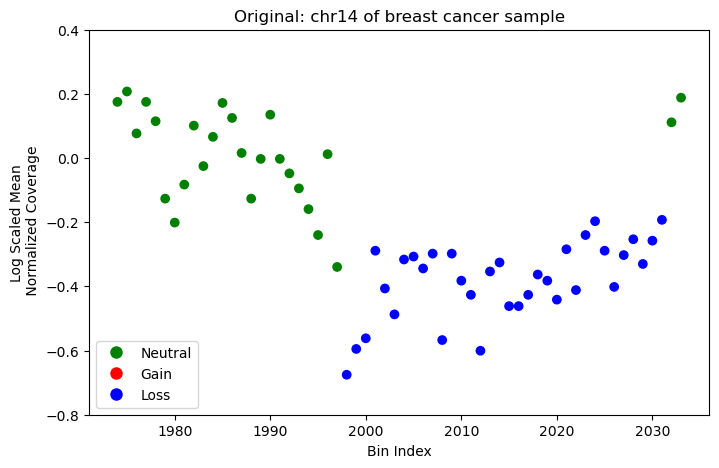

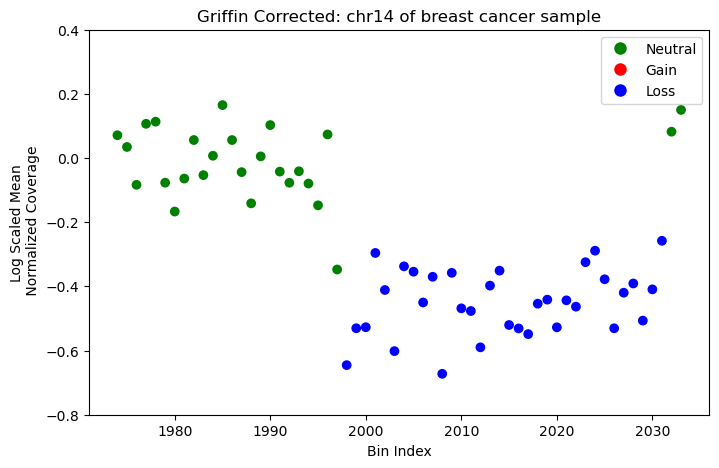

..................................................................................................................


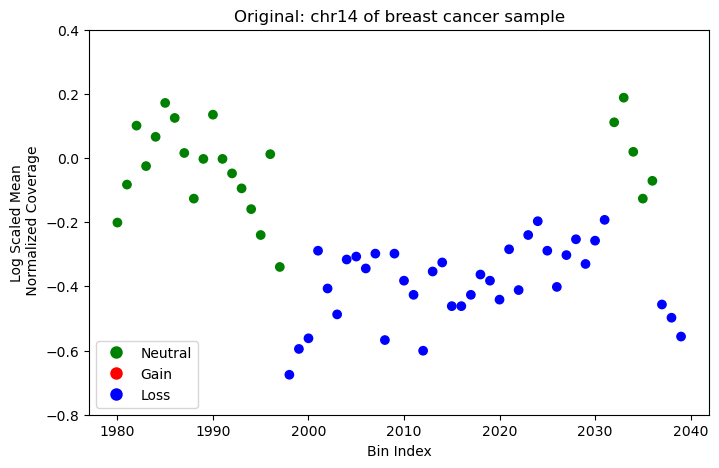

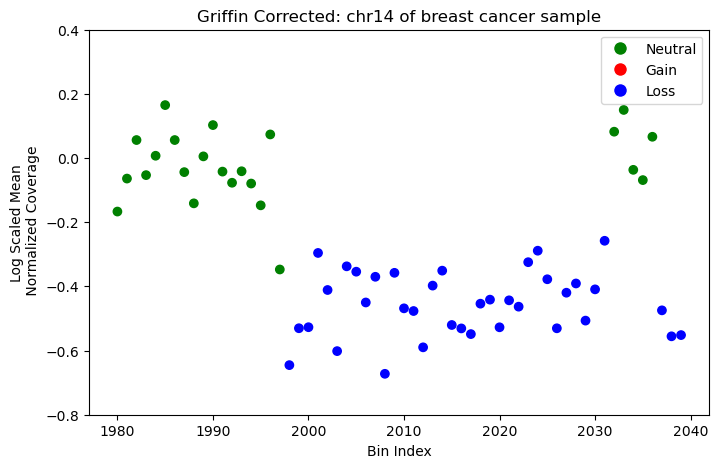

..................................................................................................................


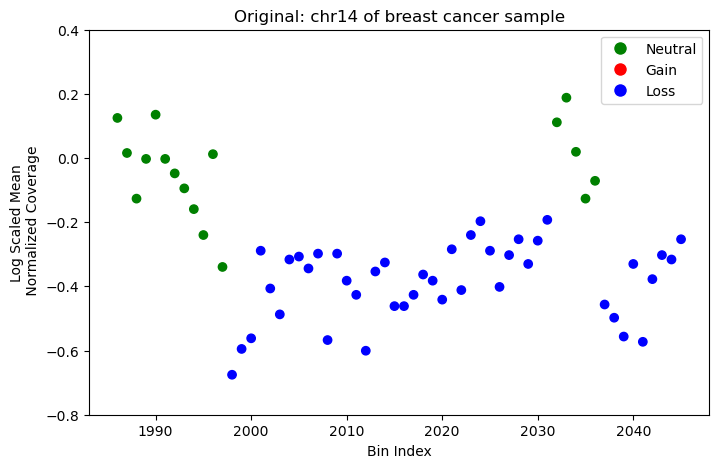

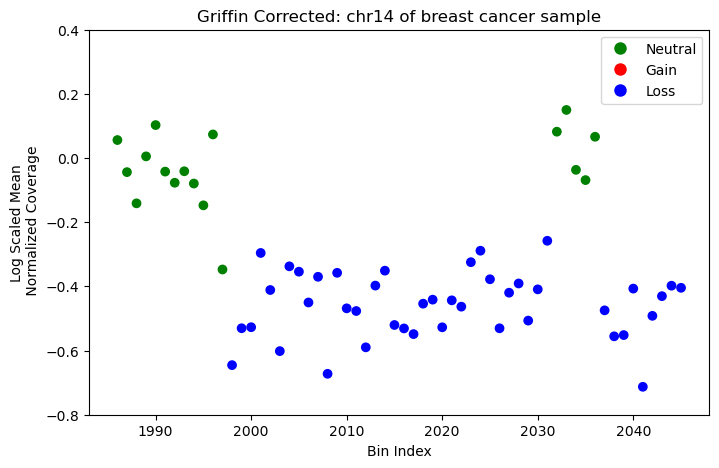

..................................................................................................................


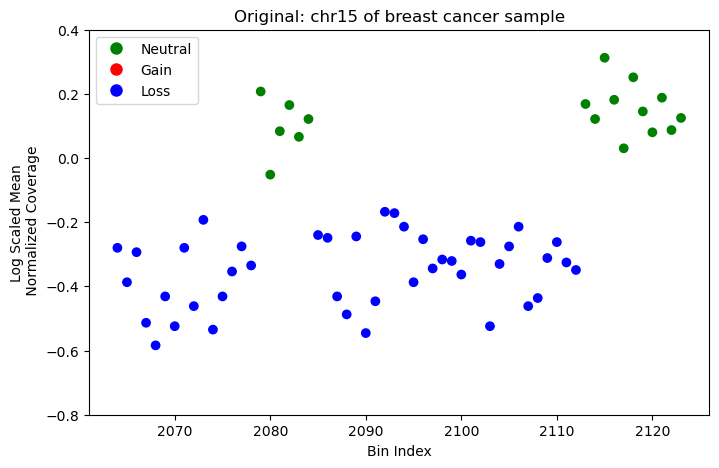

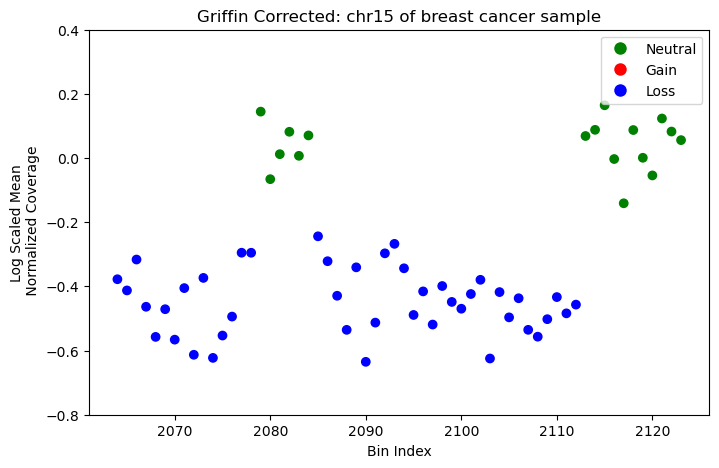

..................................................................................................................


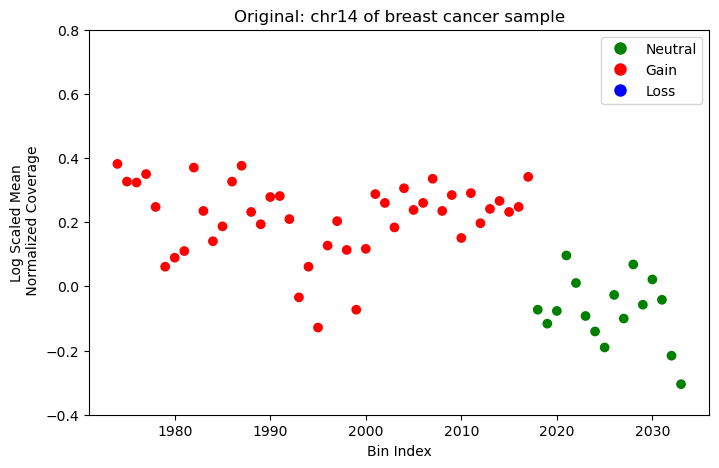

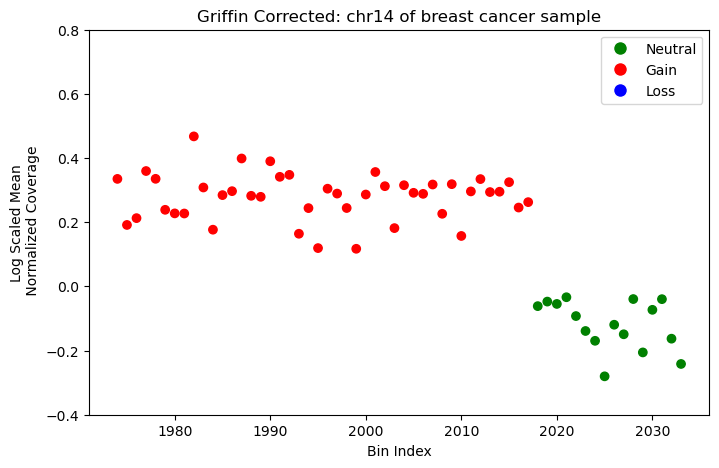

..................................................................................................................


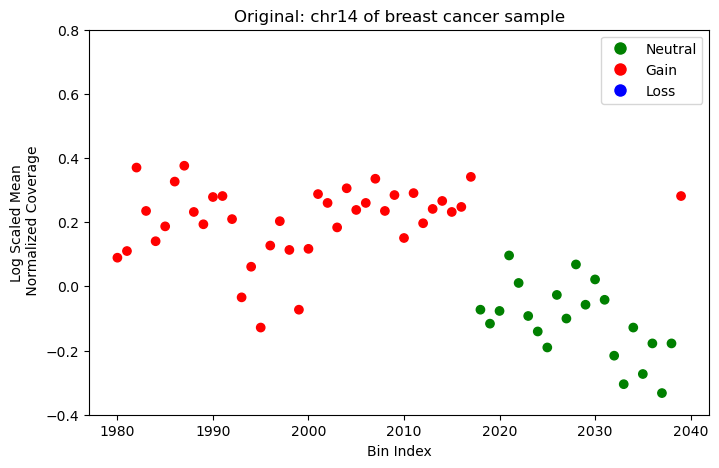

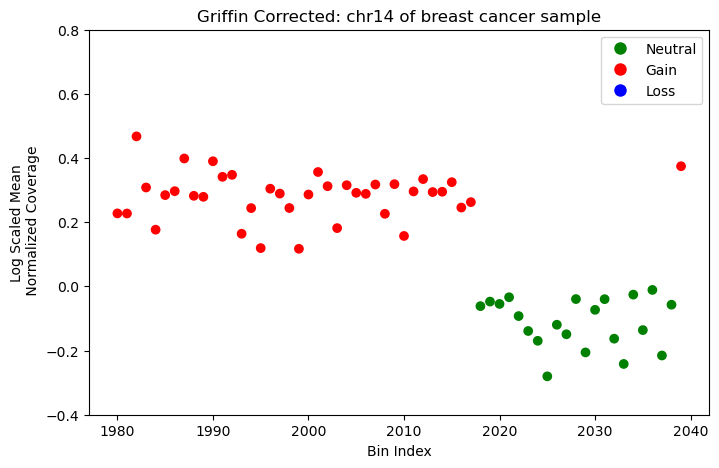

..................................................................................................................


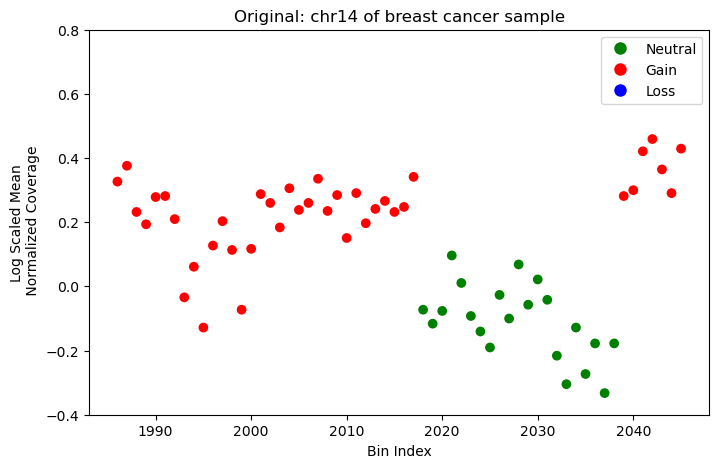

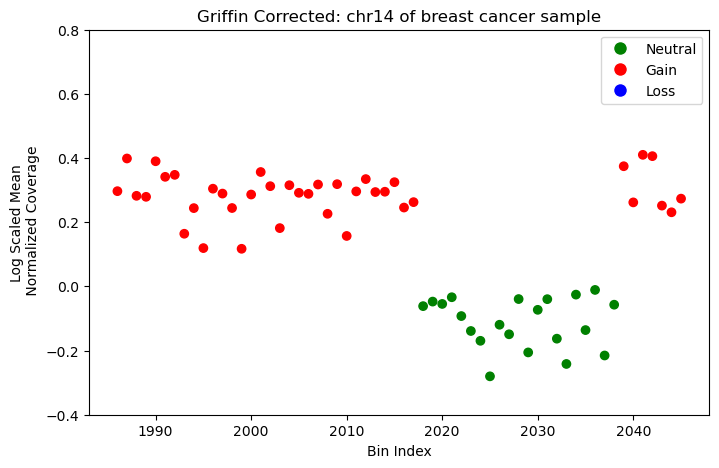

..................................................................................................................


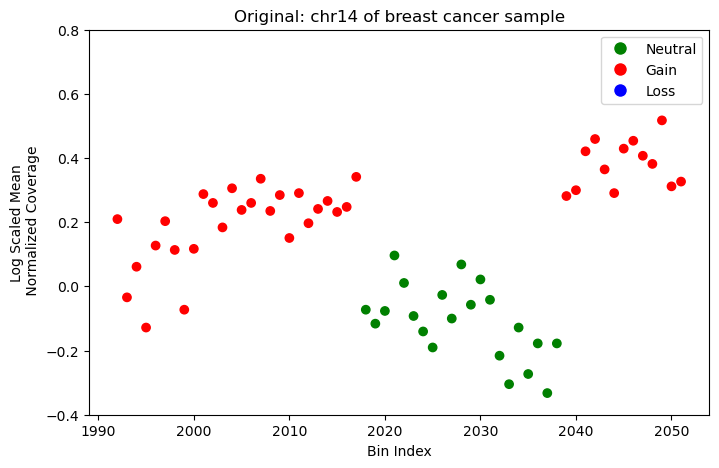

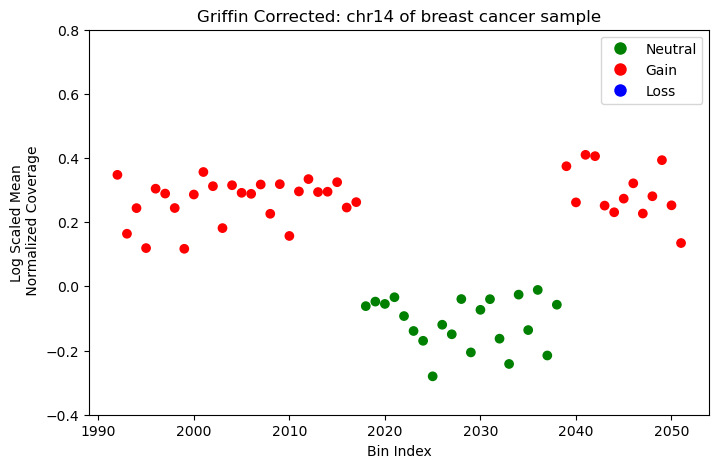

..................................................................................................................


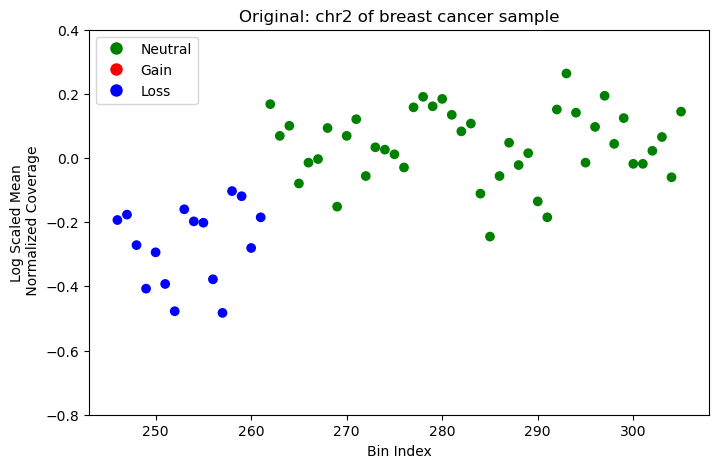

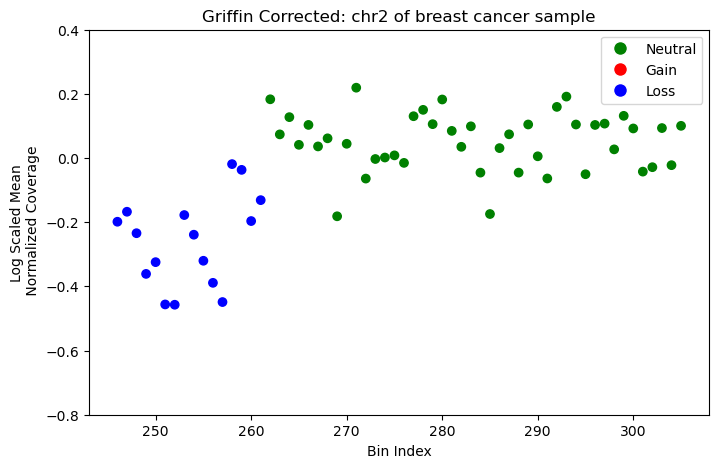

..................................................................................................................


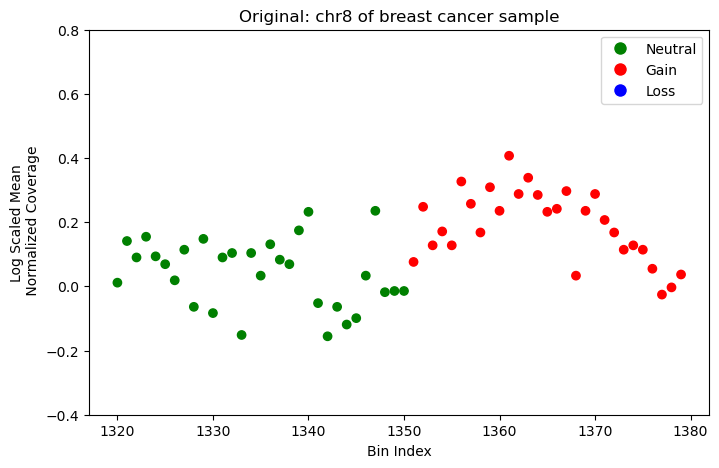

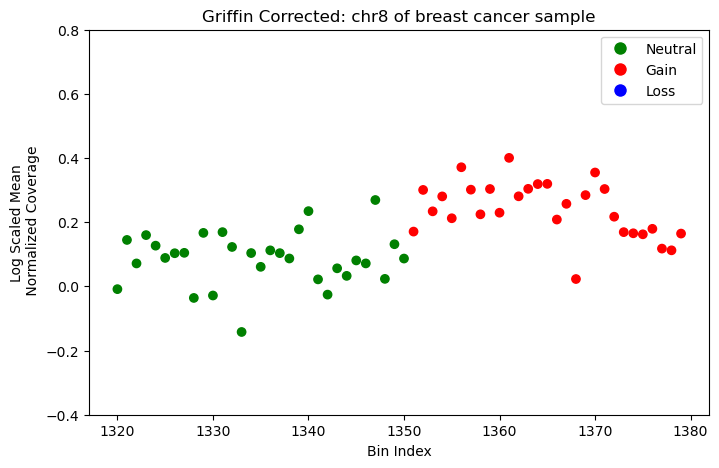

..................................................................................................................


In [23]:
#METHOD = 'Griffin'
METHOD = 'Proposed'

count_thr = 50
crc_region_size_thr = 30
brca_region_size_thr = 60
region_size_frac_thr = 0.2
region_step_div = 10

def identify_interesting_regions(cohort, sample_name, window_size):
    global count_thr
    bin_CNA_labels = pd.read_csv(f'{root_folder}/lpWGS_0.1X_1Mb/Bin_Label_CNA/{cohort}/{sample_name}.csv')['CNA_Label'].values.tolist()
    bin_CNA_chrs = pd.read_csv(f'{root_folder}/lpWGS_0.1X_1Mb/Bin_Label_CNA/{cohort}/{sample_name}.csv')['Contig'].values.tolist()
    interesting_windows = []
    step_size = int(window_size/region_step_div)
    thr = int(window_size * region_size_frac_thr)
    sample = np.load(f'{root_folder}/lpWGS_0.1X_1Mb/1Mb_2K_bins/Original/{cohort}/{sample_name}.npy')
    for i in range(0, len(bin_CNA_labels)-window_size+1, step_size):
        start, end = i, i+window_size-1
        start_chr, end_chr = bin_CNA_chrs[start], bin_CNA_chrs[end]
        min_count = np.min( sample[start : end+1] )
        if start_chr==end_chr and min_count>count_thr:
            window_CNA_labels = bin_CNA_labels[start : end+1]
            neutral_no = window_CNA_labels.count('Neutral')
            gain_no = window_CNA_labels.count('Gain')
            loss_no = window_CNA_labels.count('Loss')
            nan_no = window_size - (neutral_no + gain_no + loss_no)
            if nan_no==0 and ( (neutral_no>thr and gain_no>thr) or (neutral_no>thr and loss_no>thr) ):
                interesting_windows.append([cohort, sample_name, start_chr, start, end])
    return interesting_windows

def view_interesting_regions(cohort, window_size):
    files = os.listdir(f'{root_folder}/lpWGS_0.1X_1Mb/Bin_Label_CNA/{cohort}/')
    sample_names = [file_[:-4] for file_ in files]
    interesting_region_list = []
    for sample in sample_names:
        interesting_region_list.extend( identify_interesting_regions(cohort, sample, window_size) )
    if len(interesting_region_list)>10:
        interesting_region_list = interesting_region_list[:10]
    return interesting_region_list

def get_normalized_cov(coverage):
    mean_cov = np.mean(coverage)
    norm_cov = np.log2(coverage/mean_cov + 0.0001)
    return norm_cov

def get_plot(title, bin_coverages, bin_labels, start):
    X, Y, labels = [], [], []
    for i in range(len(bin_labels)):
        X.append(start)
        Y.append(bin_coverages[i])
        labels.append(bin_labels[i])
        start += 1
    colors = {'Neutral': 'green', 'Gain': 'red', 'Loss': 'blue'}
    c = [colors[label] for label in labels]

    plt.figure(figsize=(8, 5))
    scatter = plt.scatter(X, Y, c=c, label=labels)
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
               for label, color in colors.items()]
    plt.legend(handles=handles)
    plt.title(title)
    plt.xlabel('Bin Index')
    plt.ylabel('Log Scaled Mean\n Normalized Coverage')
    if ('Loss' in bin_labels) and ('Gain' in bin_labels):
        plt.ylim([-0.8, 0.8])
    elif 'Loss' in bin_labels:
        plt.ylim([-0.8, 0.4])
    elif 'Gain' in bin_labels:
        plt.ylim([-0.4, 0.8])
    plt.show()

def plot_CNA(region):
    cohort, sample_name, contig, start_bin, end_bin = region[0], region[1], region[2], region[3], region[4]
    bin_CNA_labels = pd.read_csv(f'{root_folder}/lpWGS_0.1X_1Mb/Bin_Label_CNA/{cohort}/{sample_name}.csv')['CNA_Label'].values.tolist()
    original_file = f'{root_folder}/lpWGS_0.1X_1Mb/1Mb_2K_bins/Original/{cohort}/{sample_name}.npy'
    corrected_file = f'{root_folder}/lpWGS_0.1X_1Mb/1Mb_2K_bins/{METHOD}_Corrected/{cohort}/{sample_name}.npy'
    original_cov = get_normalized_cov( np.load(original_file) )[start_bin: end_bin+1]
    corrected_cov = get_normalized_cov( np.load(corrected_file) )[start_bin: end_bin+1]
    region_CNA_labels = bin_CNA_labels[start_bin: end_bin+1]
    sample_name = 'colon cancer sample' if cohort=='CRC_gis' else 'breast cancer sample'
    get_plot(f'Original: {contig} of {sample_name}', original_cov, region_CNA_labels, start_bin)
    get_plot(f'Griffin Corrected: {contig} of {sample_name}', corrected_cov, region_CNA_labels, start_bin)
    print('..................................................................................................................')

interesting_region_list = []
interesting_region_list.extend( view_interesting_regions('CRC_gis', crc_region_size_thr) )
interesting_region_list.extend( view_interesting_regions('BRCA_gis', brca_region_size_thr) )
for region in interesting_region_list:
    plot_CNA(region)

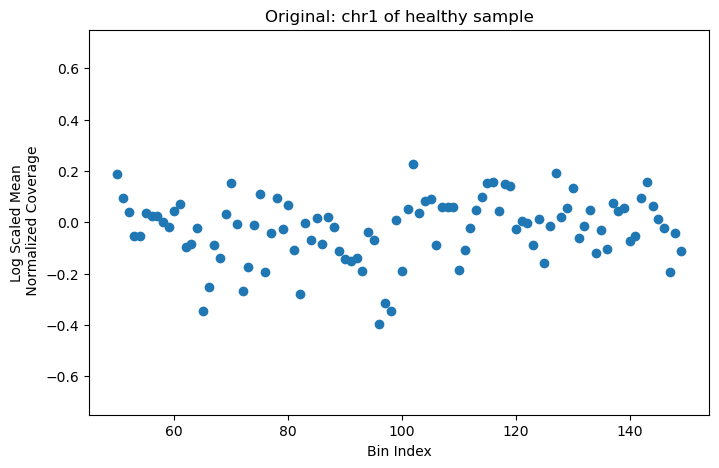

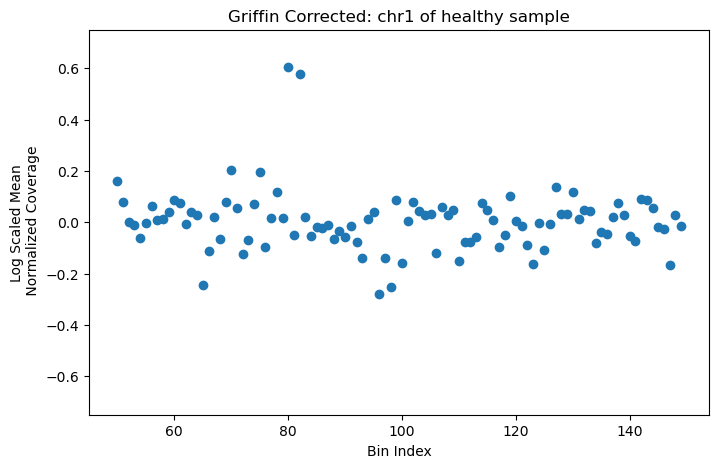

..................................................................................................................


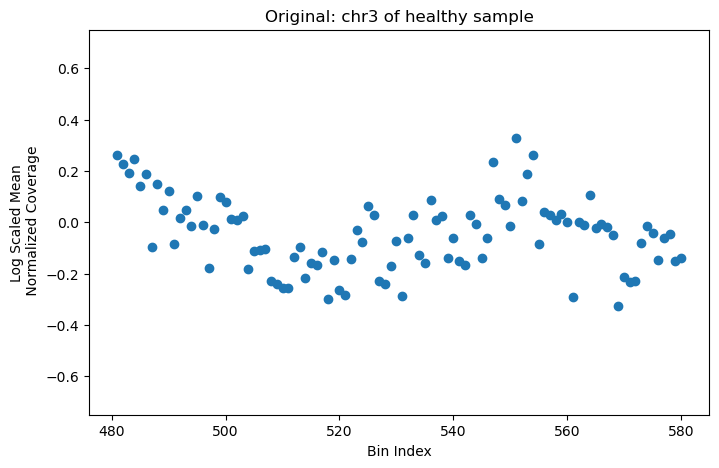

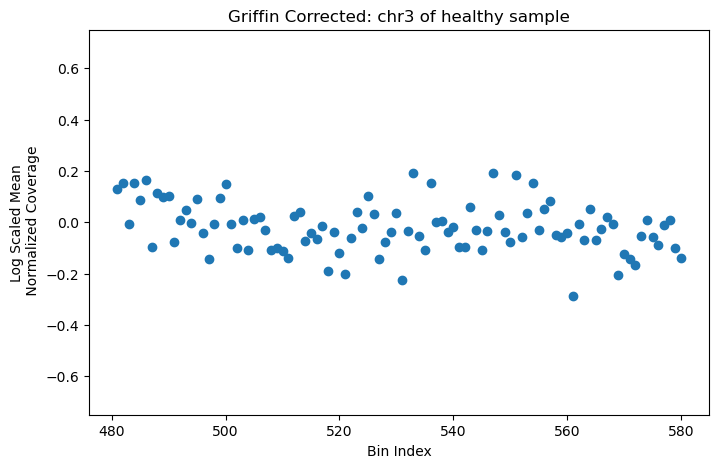

..................................................................................................................


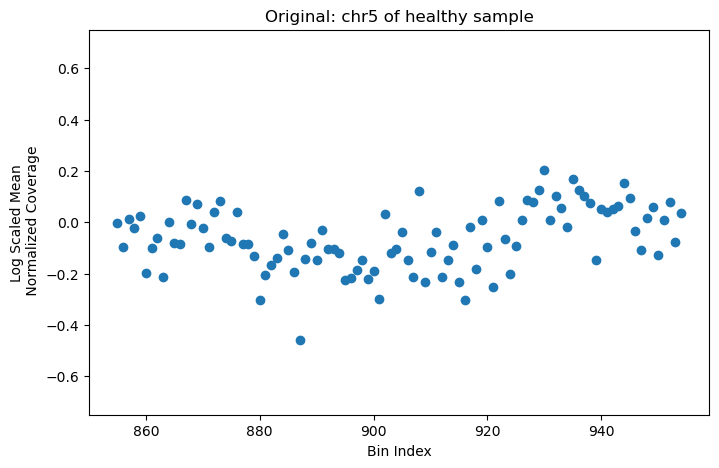

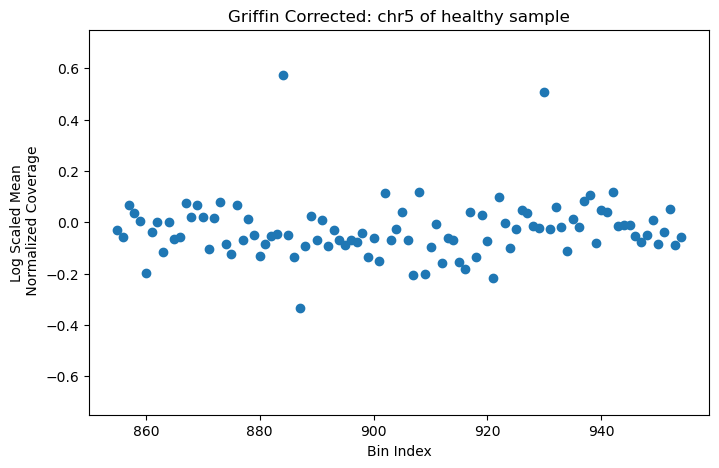

..................................................................................................................


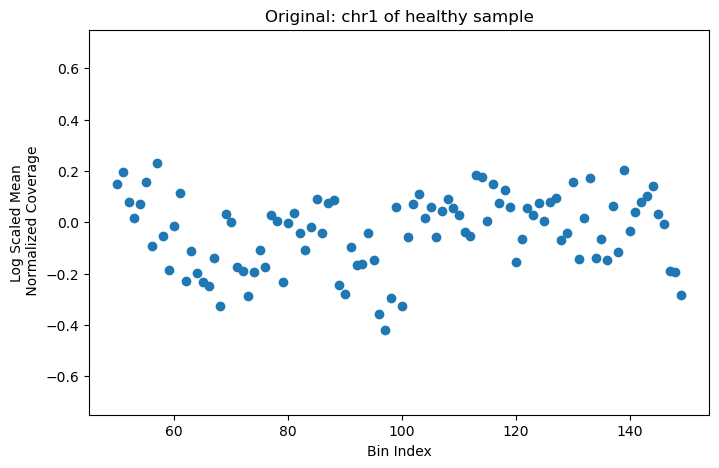

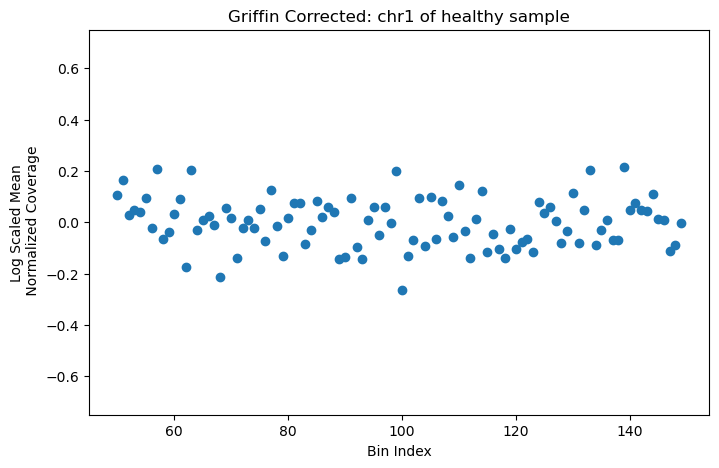

..................................................................................................................


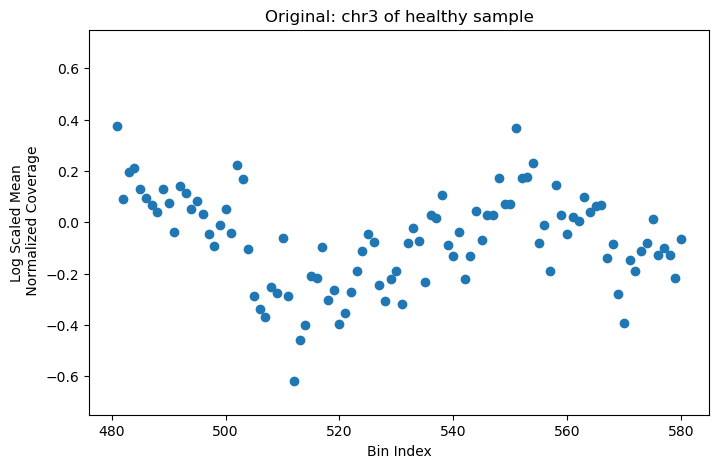

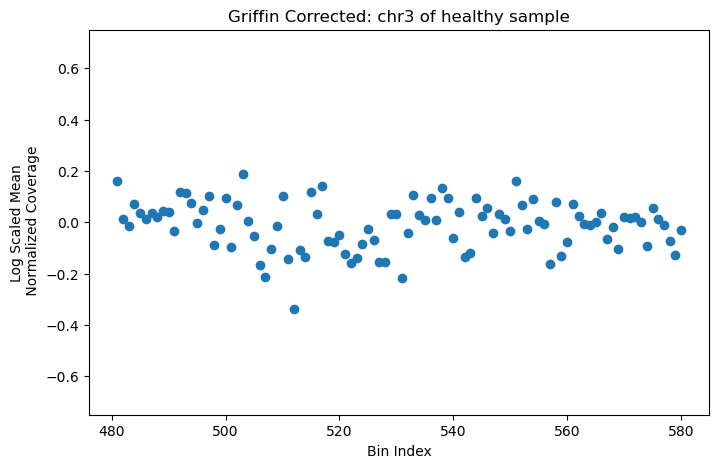

..................................................................................................................


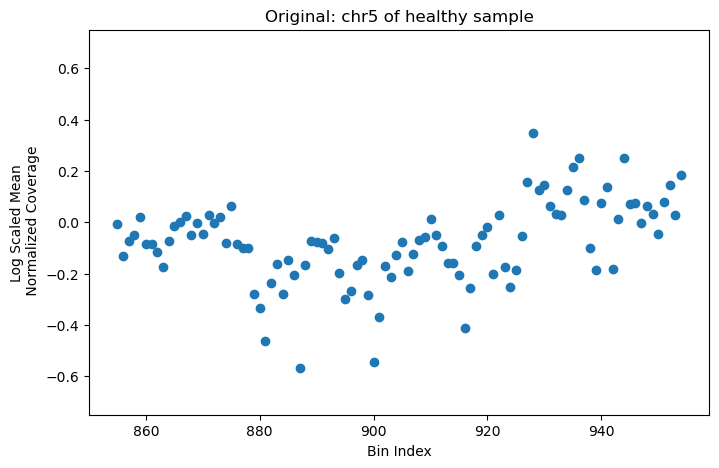

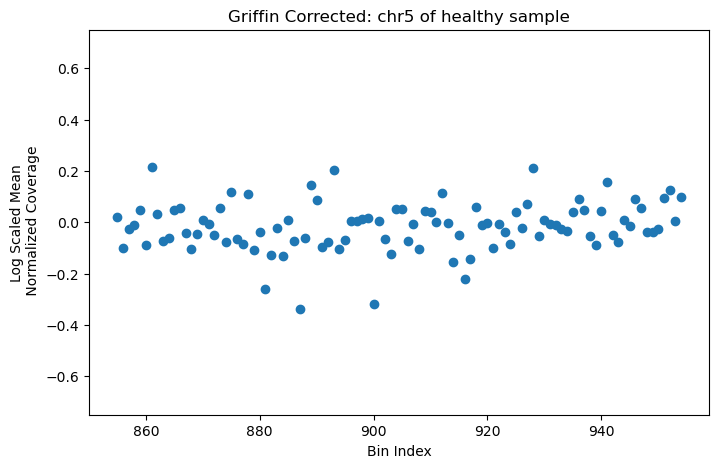

..................................................................................................................


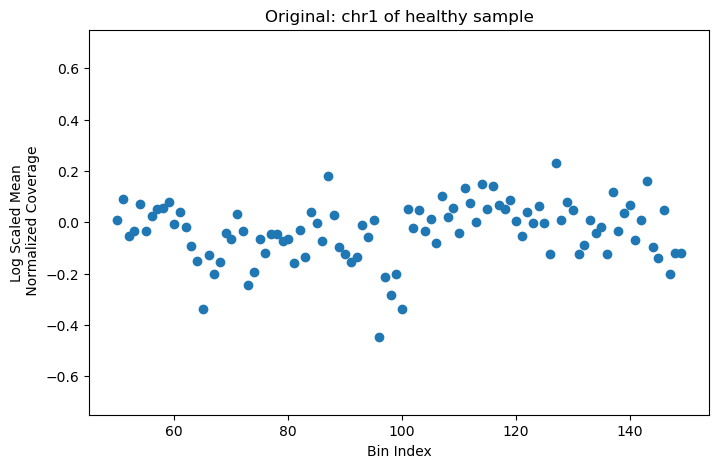

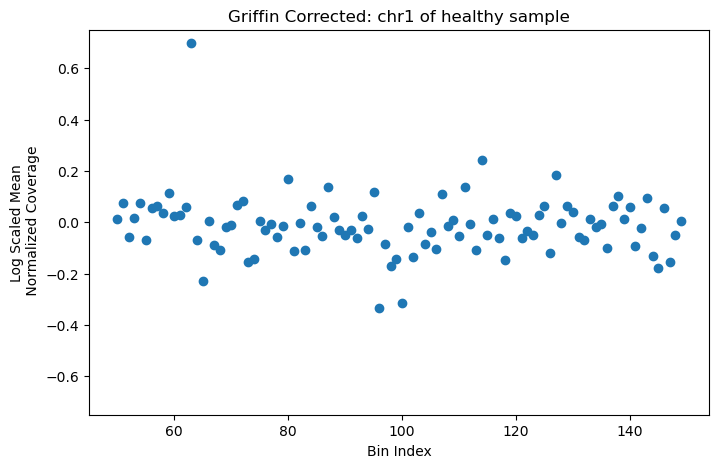

..................................................................................................................


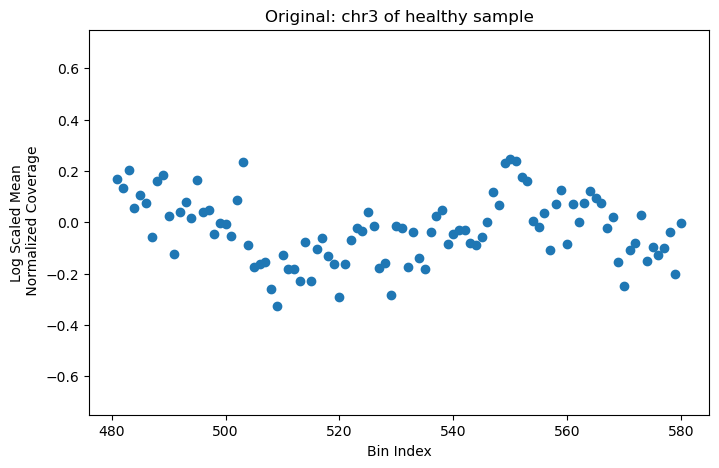

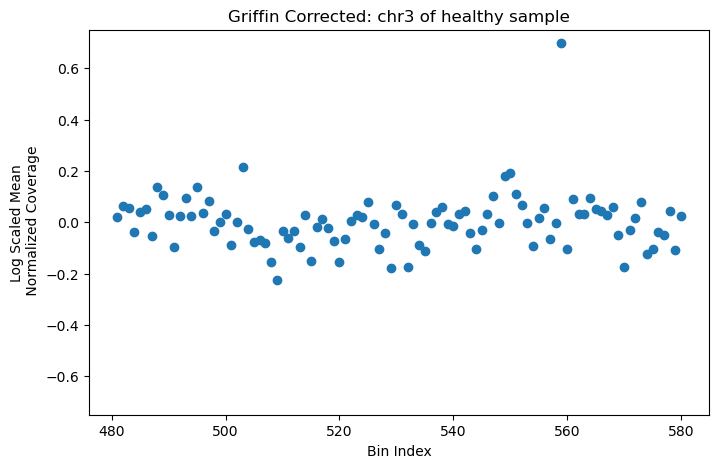

..................................................................................................................


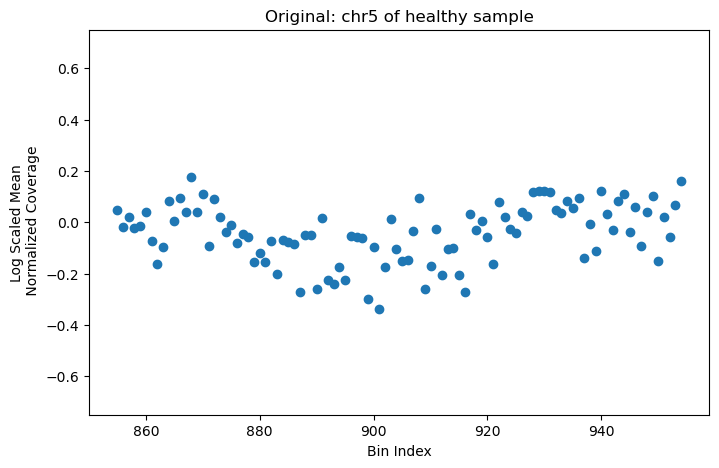

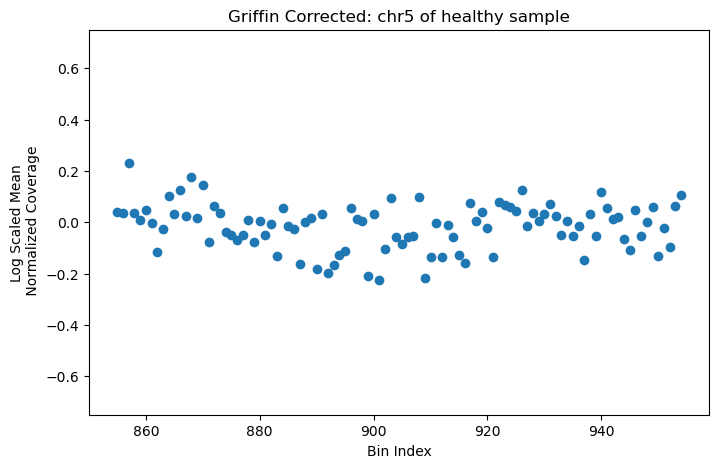

..................................................................................................................


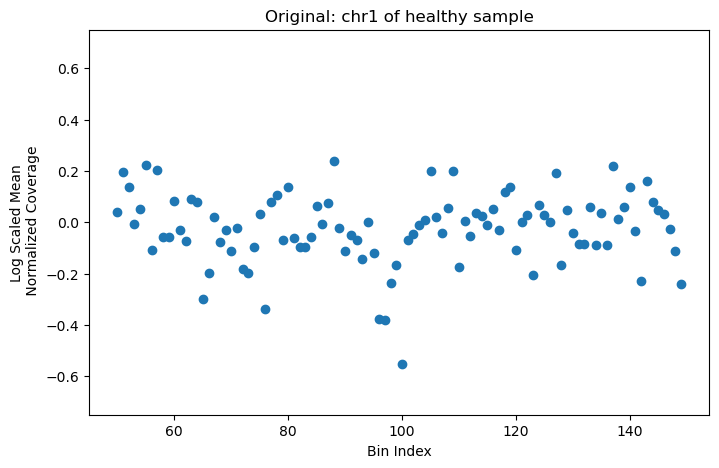

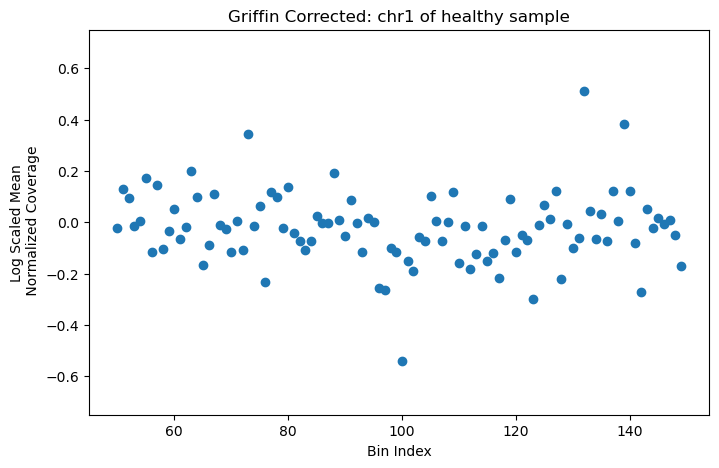

..................................................................................................................


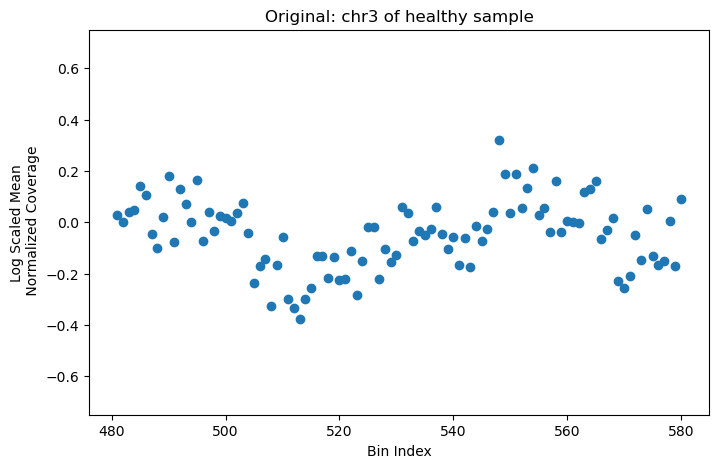

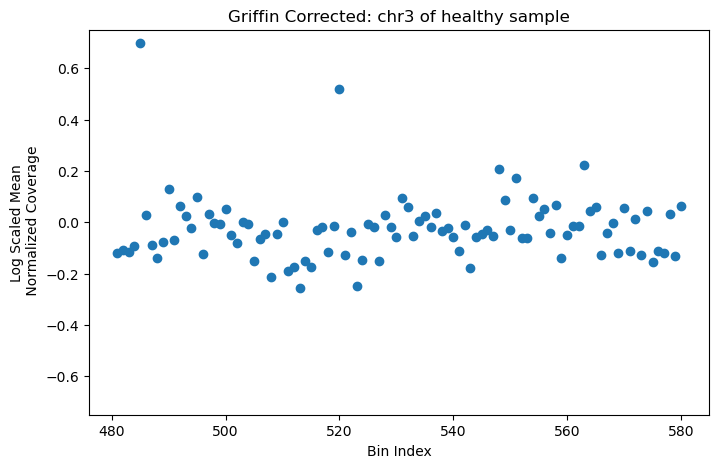

..................................................................................................................


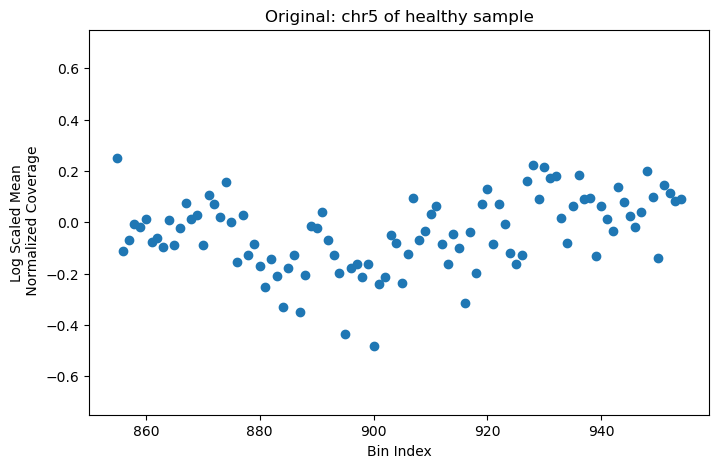

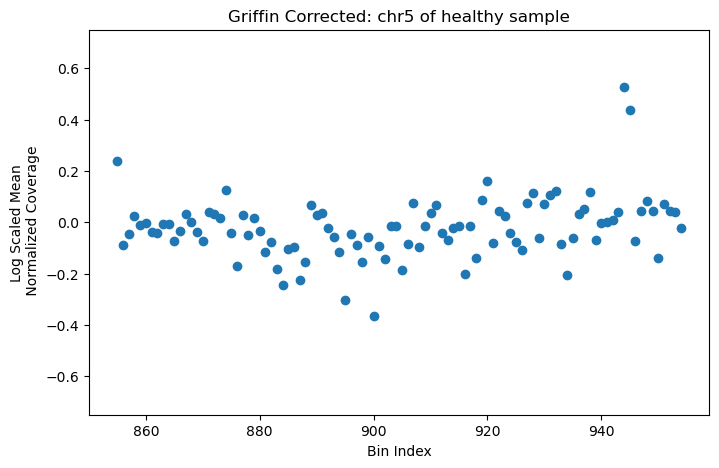

..................................................................................................................


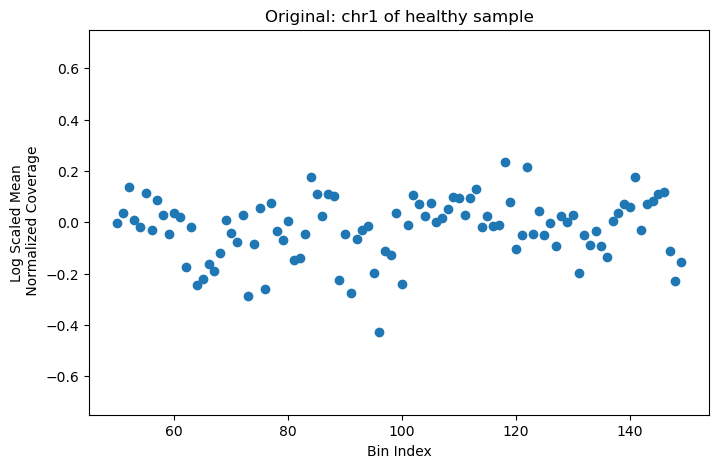

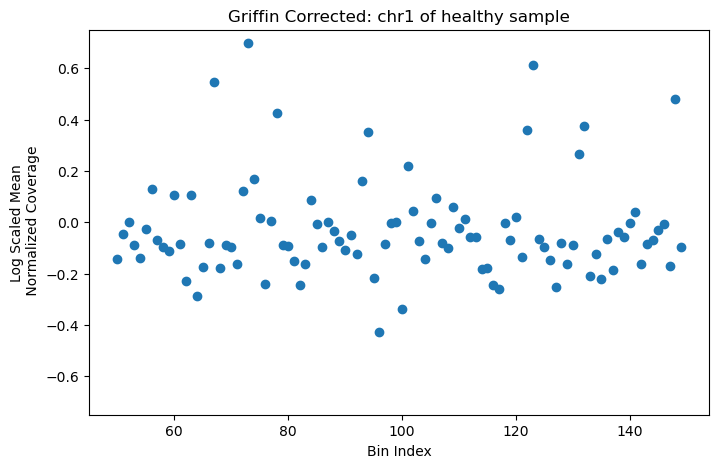

..................................................................................................................


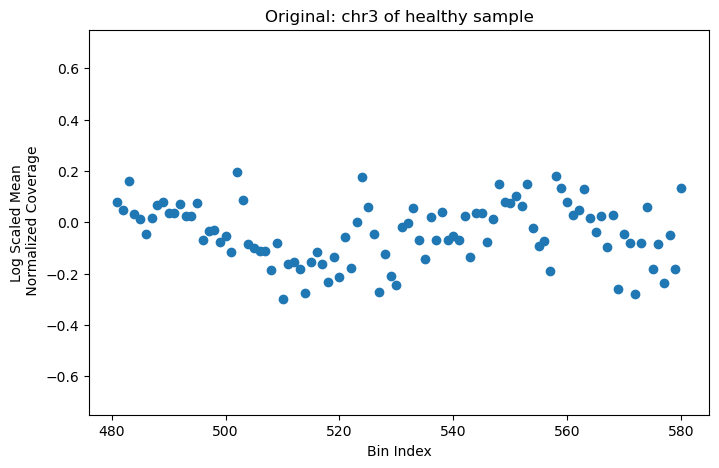

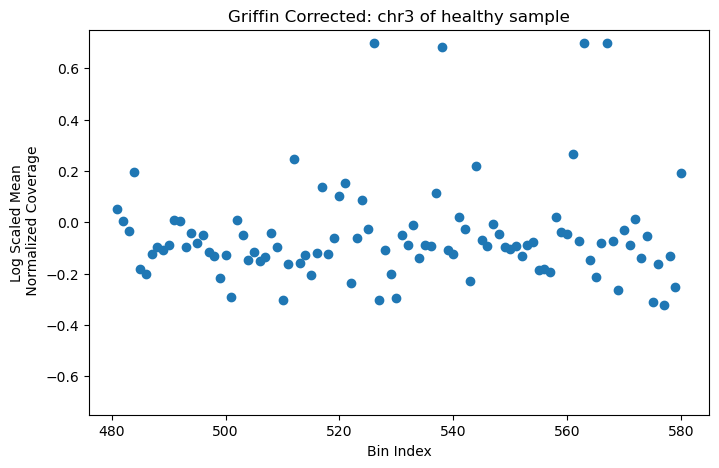

..................................................................................................................


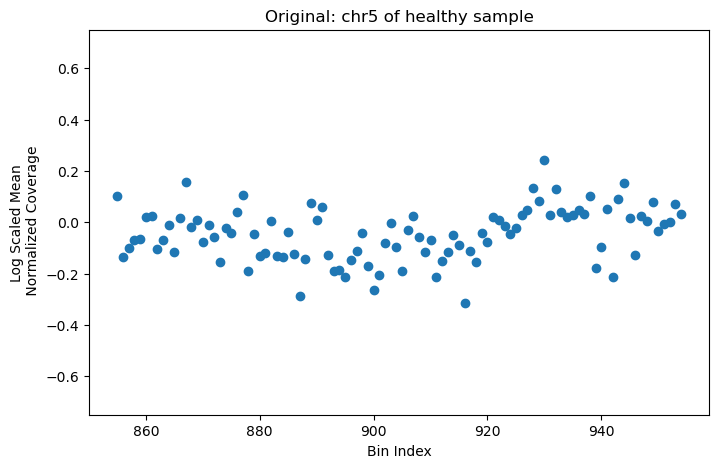

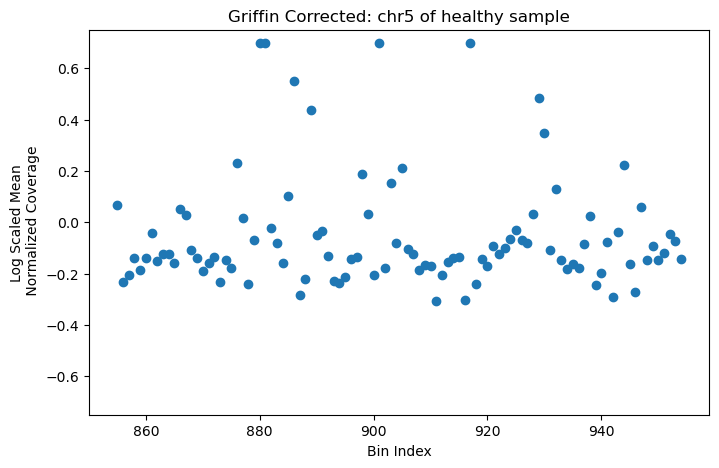

..................................................................................................................


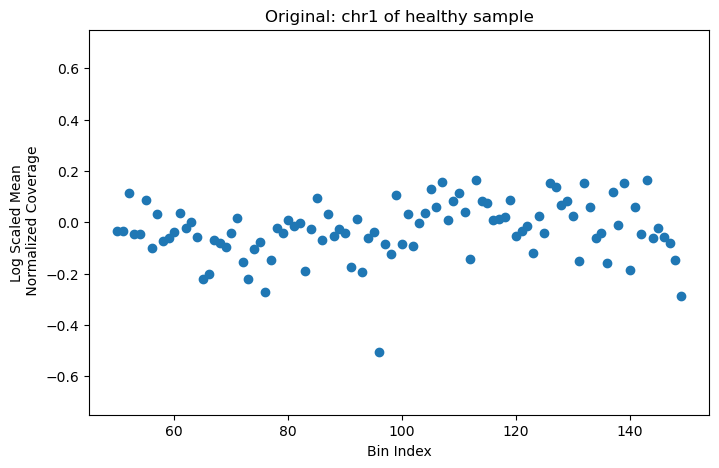

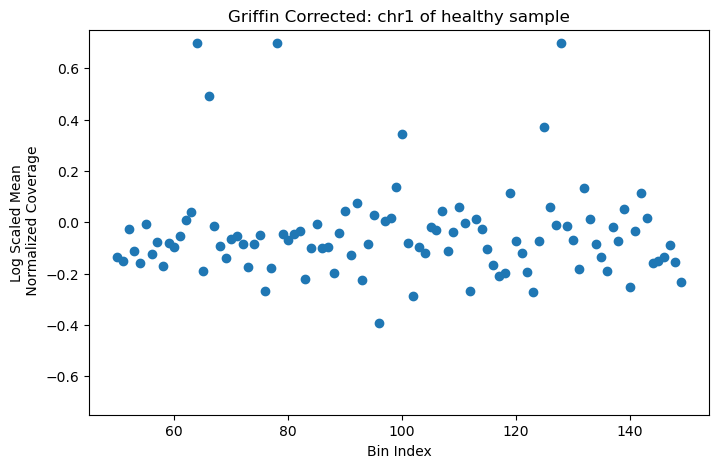

..................................................................................................................


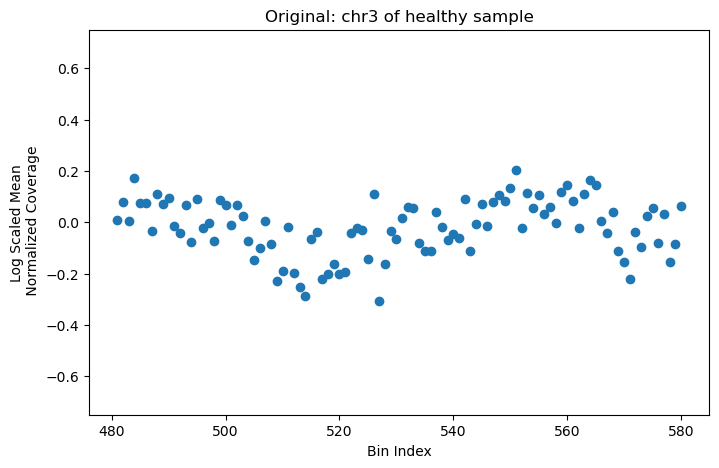

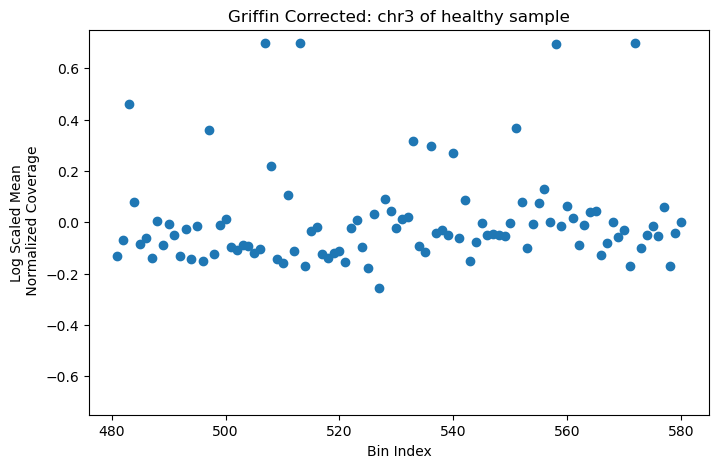

..................................................................................................................


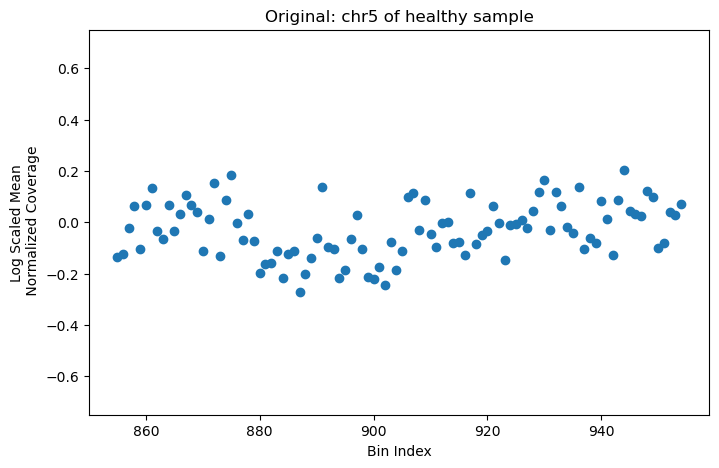

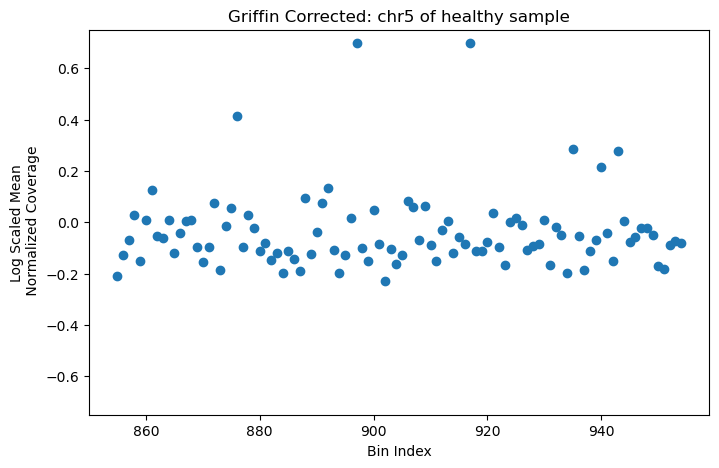

..................................................................................................................


In [26]:
 METHOD = 'Griffin'

bin_locations = pd.read_csv(f'{root_folder}/lpWGS_0.1X_1Mb/Bin_Label_CNA/1Mb.csv').values.tolist()
window_size = 100
start_offset = 50
window_size_frac_thr = 0.1
count_thr = 50

def find_region(contig, sample):
    global window_size, start_offset, window_size_frac_thr, count_thr
    step_size = int(window_size * window_size_frac_thr)
    start = None
    for i in range(len(bin_locations)):
        if bin_locations[i][0]==contig:
            start = i + start_offset
            break
    for i in range(start, sample.shape[0], step_size):
        min_total_count = np.min( sample[i: i+window_size] )
        if min_total_count>count_thr:
            start = i
            end = i+window_size-1
            return start, end

def identify_interesting_regions(cohort, sample_name):
    contigs = ['chr1', 'chr3', 'chr5']
    sample = np.load(f'{root_folder}/lpWGS_0.1X_1Mb/1Mb_2K_bins/Original/{cohort}/{sample_name}.npy')
    interesting_windows = []
    for contig in contigs:
        start, end = find_region(contig, sample)
        interesting_windows.append([cohort, sample_name, contig, start, end])
    return interesting_windows

def view_interesting_regions(cohort):
    files = os.listdir(f'{root_folder}/lpWGS_0.1X_1Mb/1Mb_2K_bins/Original/{cohort}/')
    sample_names = [file_[:-4] for file_ in files[:3]]
    interesting_region_list = []
    for sample in sample_names:
        interesting_region_list.extend( identify_interesting_regions(cohort, sample) )
    return interesting_region_list

def get_normalized_cov(coverage):
    mean_cov = np.mean(coverage)
    norm_cov = np.log2(coverage/mean_cov + 0.0001)
    norm_cov[norm_cov > 0.7] = 0.7
    norm_cov[norm_cov < -0.7] = -0.7
    return norm_cov

def get_plot(title, bin_coverages, start, end):
    X, Y = [], []
    for i in range(start, end+1):
        X.append(i)
        Y.append(bin_coverages[i-start])
    plt.figure(figsize=(8, 5))
    scatter = plt.scatter(X, Y)
    plt.title(title)
    plt.xlabel('Bin Index')
    plt.ylabel('Log Scaled Mean\n Normalized Coverage')
    plt.ylim([-0.75, 0.75])
    plt.show()

def plot_CNA(region):
    cohort, sample_name, contig, start_bin, end_bin = region[0], region[1], region[2], region[3], region[4]
    original_file = f'{root_folder}/lpWGS_0.1X_1Mb/1Mb_2K_bins/Original/{cohort}/{sample_name}.npy'
    corrected_file = f'{root_folder}/lpWGS_0.1X_1Mb/1Mb_2K_bins/{METHOD}_Corrected/{cohort}/{sample_name}.npy'
    original_cov = get_normalized_cov( np.load(original_file) )[start_bin: end_bin+1]
    corrected_cov = get_normalized_cov( np.load(corrected_file) )[start_bin: end_bin+1]
    get_plot(f'Original: {contig} of healthy sample', original_cov, start_bin, end_bin)
    get_plot(f'Griffin Corrected: {contig} of healthy sample', corrected_cov, start_bin, end_bin)
    print('..................................................................................................................')

interesting_region_list = []
interesting_region_list.extend( view_interesting_regions('healthy_c2i') )
interesting_region_list.extend( view_interesting_regions('healthy_invitro') )
for region in interesting_region_list:
    plot_CNA(region)

# Suppl Fig 14

healthy_c2i WHC556.sort


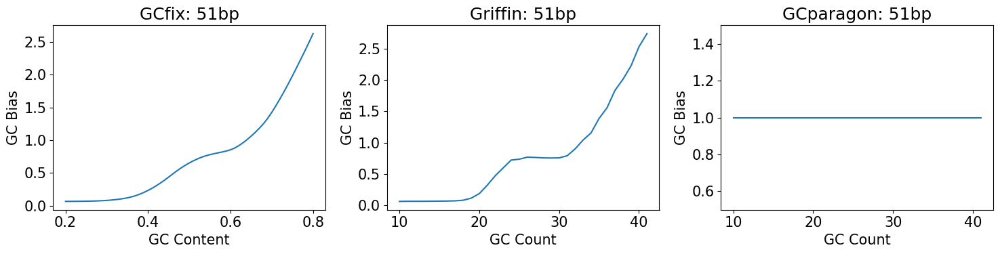

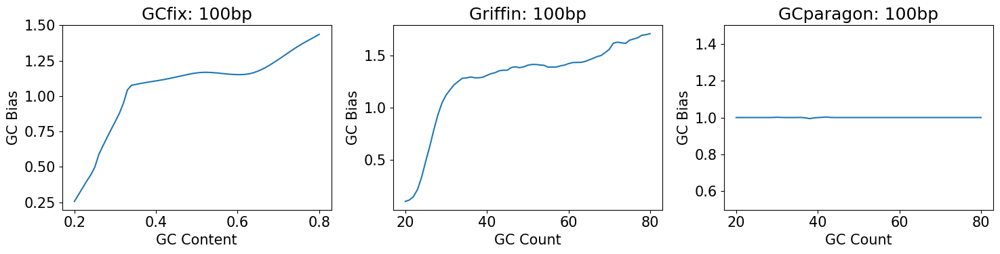

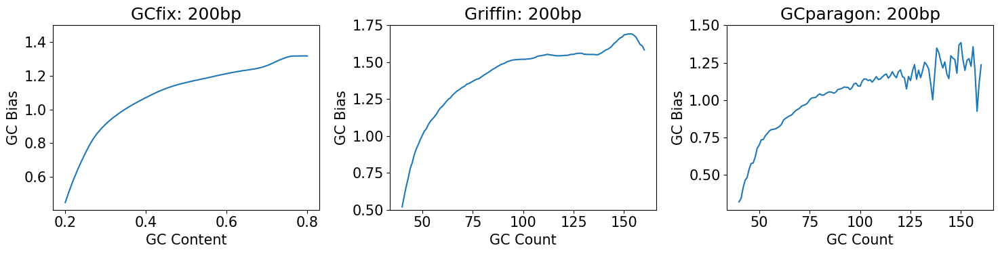

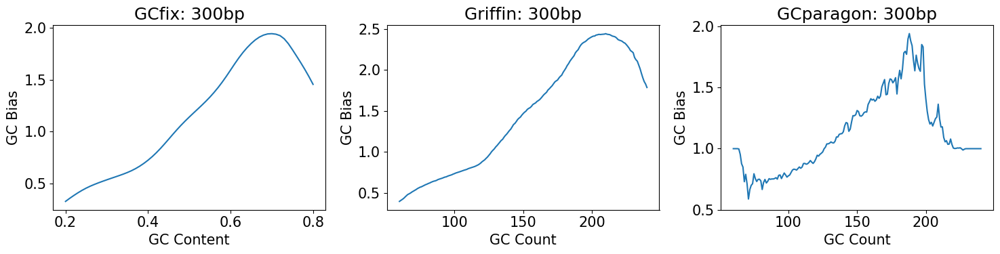

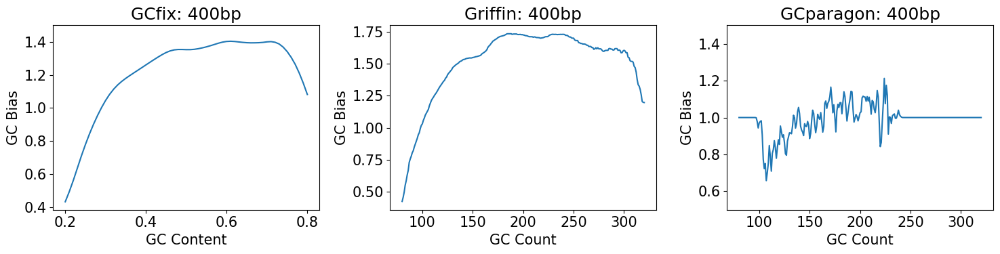

....................................................................................................................


In [47]:
lower_cnt, upper_cnt = 10, 90
thr = 3
lag = 10


len_group_dic = {51: [51, 55],
                     52: [51, 55],
                     399: [396, 400],
                     400: [396, 400]}
for length in range(53, 399):
    len_group_dic[length] = [length-2, length+2]
    

def process_length_level(sample):
    raw_sample = np.sum(sample, axis=0)
    processed_sample = np.zeros( raw_sample.shape )
    for i in range(raw_sample.shape[0]):
        processed_sample[i, :] = interpolate_zero_elements(np.copy(raw_sample[i, :]))
    return processed_sample


def remove_outlier(arr):
    high = np.percentile(arr, 100-thr)
    low = np.percentile(arr, thr)
    arr = np.where(arr>high, high, arr)
    arr = np.where(arr<low, low, arr)
    return arr


def construct_GC_bias(sample_lengths, ref_lengths, X):
    sample = np.sum(sample_lengths, axis=0)
    ref = np.sum(ref_lengths, axis=0)
    safe_ref = ref + 1
    GC_array = sample / safe_ref
    
    GC_array = GC_array[lower_cnt: upper_cnt+1]
    GC_array = remove_outlier(GC_array)
    GC_array = GC_array / np.mean(GC_array)
    
    lowess = sm.nonparametric.lowess(GC_array, X, frac=0.2)
    GC_array = lowess[:, 1]
    GC_array = GC_array / np.mean(GC_array)
    return GC_array


def plot_fastgc_len_bias(cohort, sample_name, frag_len, ax):
    global len_group_dic, ref_GC_array
    ref_len_GC_array = process_length_level(ref_GC_array)
    sample = np.load(f'{root_folder}/GC_Bias_Analysis/single_position_analysis_22_350_101_samples/{cohort}/{sample_name}.npy')
    sample_len_GC_array = process_length_level(sample)
    X = [float(i/100) for i in range(lower_cnt, upper_cnt+1)]
    start_len_ind = len_group_dic[frag_len][0] - 51
    end_len_ind = len_group_dic[frag_len][1] - 51
    Y = construct_GC_bias(sample_len_GC_array[start_len_ind: end_len_ind+1], ref_len_GC_array[start_len_ind: end_len_ind+1], X)
    Y = Y[lag: -lag]
    min_thr = min(1/20, np.percentile(Y, 1))
    Y[Y<min_thr] = min_thr
    ax.plot(X[lag:-lag], Y)
    ax.set_title(f'GCfix: {frag_len}bp')
    ax.set_xlabel('GC Content')
    ax.set_ylabel('GC Bias')
    if np.min(Y)>0.5:
        ax.set_ylim(bottom=0.5)
    if np.max(Y)<1.5:
        ax.set_ylim(top=1.5)


def plot_griffin_len_bias(sample_name, frag_len, ax):
    low, high = round(frag_len*0.2), round(frag_len*0.8)
    bias_estimates = pd.read_csv(f'{root_folder}/GC_Bias_Analysis/Griffin_Estimations/{sample_name}.csv').values.tolist()
    X, Y = [], []
    for row in bias_estimates:
        length, GC_count, bias = row[0], row[1], row[2]
        if length == frag_len and (GC_count>=low and GC_count<=high):
            X.append(GC_count)
            Y.append(bias)
    ax.plot(X, Y)
    ax.set_title(f'Griffin: {frag_len}bp')
    ax.set_xlabel('GC Count')
    ax.set_ylabel('GC Bias')
    if np.min(Y)>0.5:
        ax.set_ylim(bottom=0.5)
    if np.max(Y)<1.5:
        ax.set_ylim(top=1.5)


def plot_GCparagon_Bias(sample_name, frag_len, ax):
    low, high = round(frag_len*0.2), round(frag_len*0.8)
    correction_factors = np.array(pd.read_csv(f'{root_folder}/GC_Bias_Analysis/GCparagon_Estimations/{sample_name}.csv').values.tolist()[frag_len - 51][low: high+1])
    Y = 1.0/correction_factors
    X = [i for i in range(low, high+1)]
    ax.plot(X, Y)
    ax.set_title(f'GCparagon: {frag_len}bp')
    ax.set_xlabel('GC Count')
    ax.set_ylabel('GC Bias')
    if np.min(Y)>0.5:
        ax.set_ylim(bottom=0.5)
    if np.max(Y)<1.5:
        ax.set_ylim(top=1.5)


def main_func(cohort, sample_name):
    print(cohort, sample_name)
    length_list = [51, 100, 200, 300, 400]
    for length in length_list:
        fig, axes = plt.subplots(1, 3, figsize=(15, 4))
        plot_fastgc_len_bias(cohort, sample_name, length, axes[0])
        plot_griffin_len_bias(sample_name, length, axes[1])
        plot_GCparagon_Bias(sample_name, length, axes[2])
        plt.tight_layout()
        plt.show()
    print('....................................................................................................................')
    

main_func('healthy_c2i', 'WHC556.sort')

In [ ]:
lower_cnt, upper_cnt = 10, 90
thr = 3
lag = 10


len_group_dic = {51: [51, 55],
                     52: [51, 55],
                     399: [396, 400],
                     400: [396, 400]}
for length in range(53, 399):
    len_group_dic[length] = [length-2, length+2]
    

def process_length_level(sample):
    raw_sample = np.sum(sample, axis=0)
    processed_sample = np.zeros( raw_sample.shape )
    for i in range(raw_sample.shape[0]):
        processed_sample[i, :] = interpolate_zero_elements(np.copy(raw_sample[i, :]))
    return processed_sample


def remove_outlier(arr):
    high = np.percentile(arr, 100-thr)
    low = np.percentile(arr, thr)
    arr = np.where(arr>high, high, arr)
    arr = np.where(arr<low, low, arr)
    return arr


def construct_GC_bias(sample_lengths, ref_lengths, X):
    sample = np.sum(sample_lengths, axis=0)
    ref = np.sum(ref_lengths, axis=0)
    safe_ref = ref + 1
    GC_array = sample / safe_ref
    
    GC_array = GC_array[lower_cnt: upper_cnt+1]
    GC_array = remove_outlier(GC_array)
    GC_array = GC_array / np.mean(GC_array)
    
    lowess = sm.nonparametric.lowess(GC_array, X, frac=0.2)
    GC_array = lowess[:, 1]
    GC_array = GC_array / np.mean(GC_array)
    return GC_array


def plot_len_GC_bias(sample_len_GC_array, frag_len, ref_len_GC_array, color, ax):
    global len_group_dic 
    X = [float(i/100) for i in range(lower_cnt, upper_cnt+1)]
    start_len_ind = len_group_dic[frag_len][0] - 51
    end_len_ind = len_group_dic[frag_len][1] - 51
    Y = construct_GC_bias(sample_len_GC_array[start_len_ind: end_len_ind+1], ref_len_GC_array[start_len_ind: end_len_ind+1], X)
    Y = Y[lag: -lag]
    min_thr = min(1/20, np.percentile(Y, 1))
    Y[Y<min_thr] = min_thr
    ax.plot(X[lag:-lag], Y, label=f'{frag_len}bp', color=color)
    return np.min(Y), np.max(Y)
    
    
def main_func(cohort, sample_name):
    print(cohort, sample_name)
    color_list = ['Reds', 'Greens', 'Blues']
    length_lists = [[51, 60, 70, 80, 100, 125, 150, 175, 190], [200, 210, 220, 230, 240, 250, 260, 270, 280],
                         [290, 300, 310, 320, 330, 350, 375, 400]]
    global ref_GC_array
    ref_len_GC_array = process_length_level(ref_GC_array)
    sample = np.load(f'{root_folder}/GC_Bias_Analysis/single_position_analysis_22_350_101_samples/{cohort}/{sample_name}.npy')
    processed_sample = process_length_level(sample)
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    min_bias, max_bias = 10, -10
    for i in range(len(length_lists)):
        cmap = plt.get_cmap(color_list[i])
        lengths = length_lists[i]
        norm = mcolors.Normalize(vmin=min(lengths), vmax=max(lengths))
        for length in lengths:
            color = cmap(norm(length))
            temp_min, temp_max = plot_len_GC_bias(processed_sample, length, ref_len_GC_array, color, axes[i])
            min_bias = min(temp_min, min_bias)
            max_bias = max(temp_max, max_bias)
        axes[i].set_xlabel('GC Content', fontsize=14)
        axes[i].set_ylabel('GC Bias', fontsize=14)
        axes[i].legend(fontsize=12)
        axes[i].tick_params(axis='both', labelsize=14)
    for i in range(3):
        axes[i].set_ylim([min_bias-0.05, max_bias+0.05])
    plt.tight_layout()
    plt.show()
    print('.................................................................................................................')
    
        
main_func('healthy_invitro', 'WHC1389')
main_func('crc_gis', 'NCC_CRC-512_051015-CW-T-ready')
main_func('brca_gis', 'D7')